<a href="https://colab.research.google.com/github/DeepakAv2409/Time-Series-Forecasting---Advanced-forecasting-techniques-to-predict-future-trends/blob/main/Time_Series_Forecasting_Advanced_forecasting_techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
from sklearn.metrics import mean_squared_error

### Problem 1 for the Data Set - Shoesales.csv

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Shoe-Sales.csv to Shoe-Sales.csv


In [ ]:
df1 = pd.read_csv("Shoe-Sales.csv")

In [ ]:
df1

,YearMonth,Shoe_Sales
0,1980-01,85
1,1980-02,89
2,1980-03,109
3,1980-04,95
4,1980-05,91
...,...,...
182,1995-03,188
183,1995-04,195
184,1995-05,189
185,1995-06,220


In [ ]:
df1.head()

,YearMonth,Shoe_Sales
0,1980-01,85
1,1980-02,89
2,1980-03,109
3,1980-04,95
4,1980-05,91


In [ ]:
df1.tail()

,YearMonth,Shoe_Sales
182,1995-03,188
183,1995-04,195
184,1995-05,189
185,1995-06,220
186,1995-07,274


#### EXPLORATORY DATA ANALYSIS

In [ ]:
df1.dtypes

YearMonth     object
Shoe_Sales     int64
dtype: object

### Treating the dataset for ease:

Since we have monthly data for years starting from 1980 to 1995 combined, let us draw a date range and incoporate as "TimeStamp" and drop "YearMonth" for ease

In [ ]:
date=pd.date_range(start='01/01/1980', end='08/01/1995', freq='M')
date

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='M')

In [ ]:
df1['TimeStamp']=pd.DataFrame(date, columns=['Month'])
df1.head()

,YearMonth,Shoe_Sales,TimeStamp
0,1980-01,85,1980-01-31
1,1980-02,89,1980-02-29
2,1980-03,109,1980-03-31
3,1980-04,95,1980-04-30
4,1980-05,91,1980-05-31


In [ ]:
df1['TimeStamp']=pd.to_datetime(df1['TimeStamp'])
df1=df1.set_index('TimeStamp')
df1.drop(['YearMonth'], axis=1, inplace=True)
df1.head()

,Shoe_Sales
TimeStamp,
1980-01-31,85
1980-02-29,89
1980-03-31,109
1980-04-30,95
1980-05-31,91


### Basic details and Descriptive Statistics of Shoesales

In [ ]:
print("The number of rows: ",df1.shape[0], "\n""The number of columns: ",df1.shape[1])

The number of rows:  187 
The number of columns:  1


In [ ]:
np.round(df1.describe(),2).T

,count,mean,std,min,25%,50%,75%,max
Shoe_Sales,187.0,245.64,121.39,85.0,143.5,220.0,315.5,662.0


#### Checking for missing values and Interpolation

In [ ]:
df1.isna().sum()

Shoe_Sales    0
dtype: int64

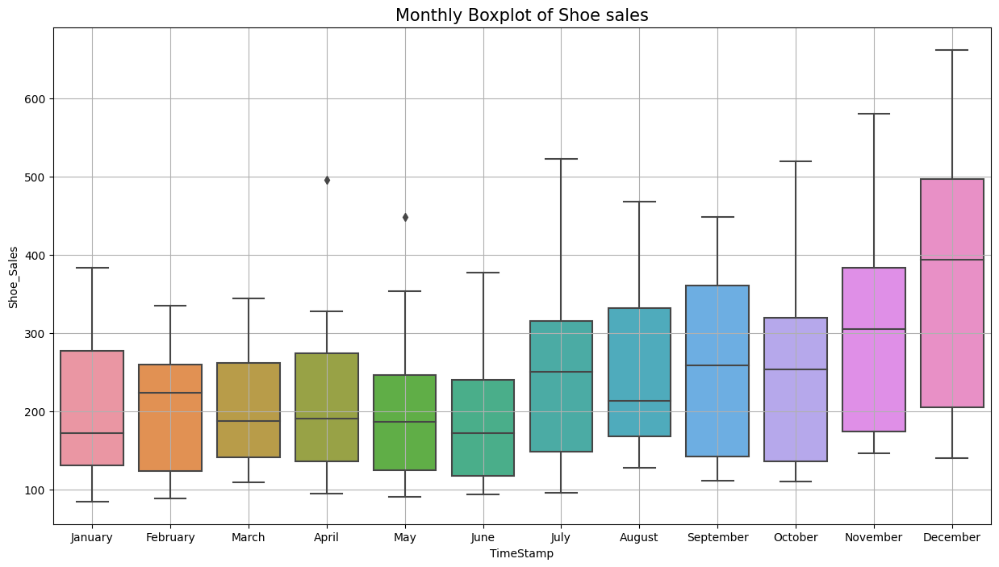

In [ ]:
rcParams['figure.figsize']=15,8
sns.boxplot(x = df1.index.month_name(), y = df1['Shoe_Sales']);
plt.grid();
plt.title('Monthly Boxplot of Shoe sales', fontsize=15);

In [ ]:
monthly_sales_across_years = pd.pivot_table(df1, values = 'Shoe_Sales', columns = df1.index.month, index = df1.index.year)
monthly_sales_across_years

TimeStamp,1,2,3,4,5,6,7,8,9,10,11,12
TimeStamp,,,,,,,,,,,,
1980,85.0,89.0,109.0,95.0,91.0,95.0,96.0,128.0,124.0,111.0,178.0,140.0
1981,150.0,132.0,155.0,132.0,91.0,94.0,109.0,155.0,123.0,130.0,150.0,163.0
1982,101.0,123.0,127.0,112.0,108.0,116.0,153.0,163.0,128.0,142.0,170.0,214.0
1983,134.0,122.0,142.0,156.0,145.0,169.0,134.0,165.0,156.0,111.0,165.0,197.0
1984,124.0,124.0,139.0,137.0,127.0,134.0,136.0,171.0,112.0,110.0,147.0,196.0
1985,112.0,118.0,125.0,122.0,120.0,118.0,281.0,344.0,366.0,362.0,580.0,523.0
1986,348.0,246.0,197.0,306.0,279.0,280.0,358.0,431.0,448.0,433.0,504.0,579.0
1987,384.0,335.0,320.0,496.0,448.0,377.0,523.0,468.0,428.0,520.0,493.0,662.0
1988,304.0,308.0,313.0,328.0,354.0,338.0,483.0,355.0,439.0,290.0,352.0,454.0


Text(0.5, 1.0, 'Monthly sales over years of Shoe sales')

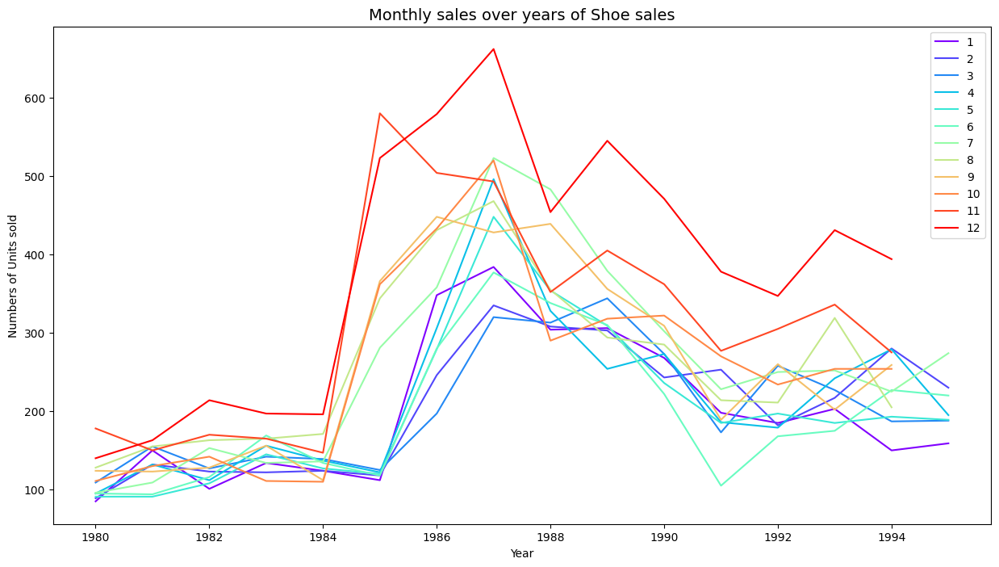

In [ ]:
plt.figure.figsize=(15,8)
monthly_sales_across_years.plot(colormap='rainbow')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Year')
plt.title('Monthly sales over years of Shoe sales', fontsize=14)

### Visualization of Time Series in Shoe sales

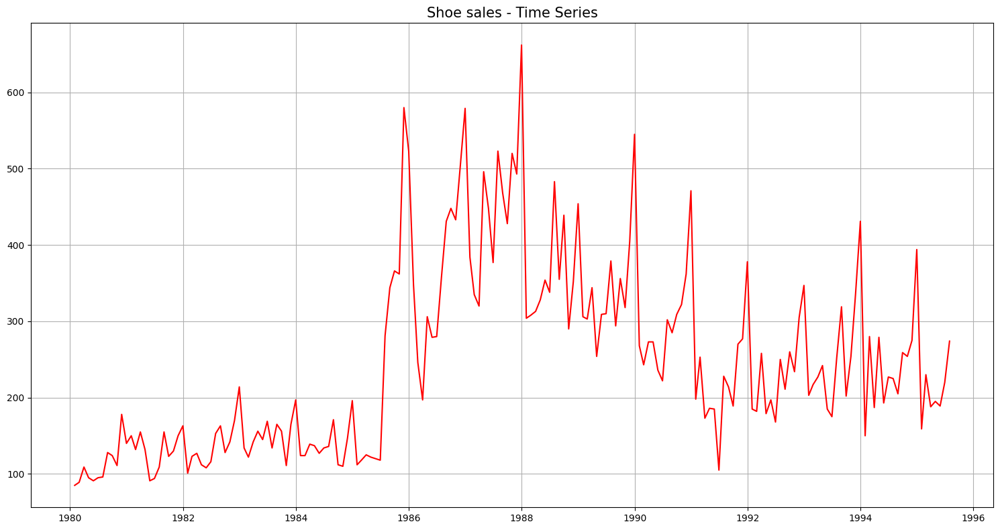

In [ ]:
rcParams['figure.figsize']=15,8
plt.grid();
plt.title('Shoe sales - Time Series', fontsize=15);
plt.plot(df1, color='red')
plt.tight_layout();

### Decompose the Time Series and plot the different components

##Additive Decomposition of shoe sales

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

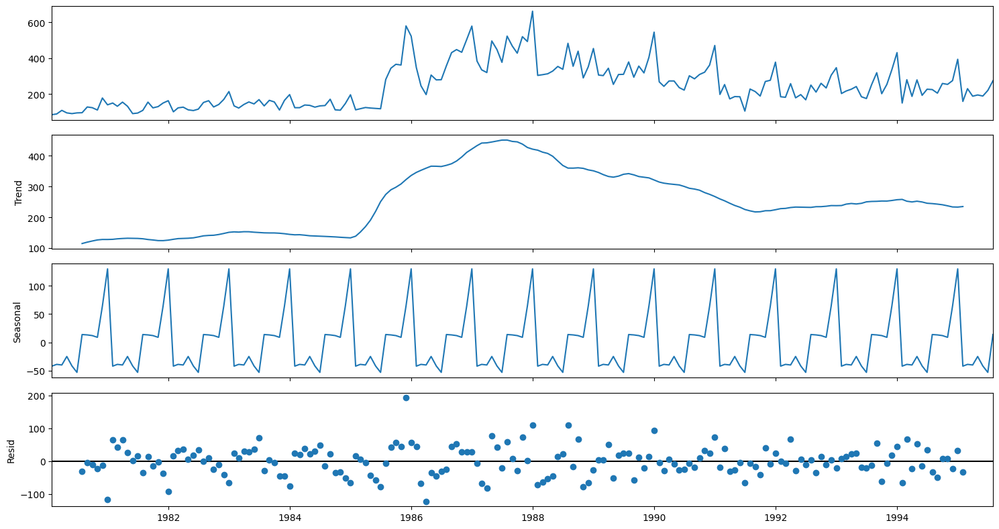

In [ ]:
df1_decompose = seasonal_decompose(df1, model='additive', period=12) #since here we are considering yearly seasonality and trend having monthly freq
df1_decompose.plot()
plt.tight_layout()
plt.show();

In [ ]:
R_Trend=df1_decompose.trend
R_Seasonality=df1_decompose.seasonal
R_Residual=df1_decompose.resid

print ('R_Trend', R_Trend.head(10), '\n')
print ('R_Seasonality', R_Seasonality.head(10), '\n')
print ('R_Residual', R_Residual.head(10), '\n')

R_Trend TimeStamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    114.458333
1980-08-31    118.958333
1980-09-30    122.666667
1980-10-31    126.125000
Name: trend, dtype: float64 

R_Seasonality TimeStamp
1980-01-31   -42.175463
1980-02-29   -39.062566
1980-03-31   -40.122090
1980-04-30   -25.092328
1980-05-31   -41.878042
1980-06-30   -53.208399
1980-07-31    13.741204
1980-08-31    13.077315
1980-09-30    11.866204
1980-10-31     8.835648
Name: seasonal, dtype: float64 

R_Residual TimeStamp
1980-01-31          NaN
1980-02-29          NaN
1980-03-31          NaN
1980-04-30          NaN
1980-05-31          NaN
1980-06-30          NaN
1980-07-31   -32.199537
1980-08-31    -4.035648
1980-09-30   -10.532870
1980-10-31   -23.960648
Name: resid, dtype: float64 



In [ ]:
R_Trend.head(12).to_csv('Shoe_sales_mtrend.csv')
R_Seasonality.head(12).to_csv('Shoe_sales_mseason.csv')
R_Residual.head(12).to_csv('Shoe_sales_mresid.csv')

Text(0.5, 1.0, 'Residual Plot of Additive Decomposition for Shoe_Sales Time Series')

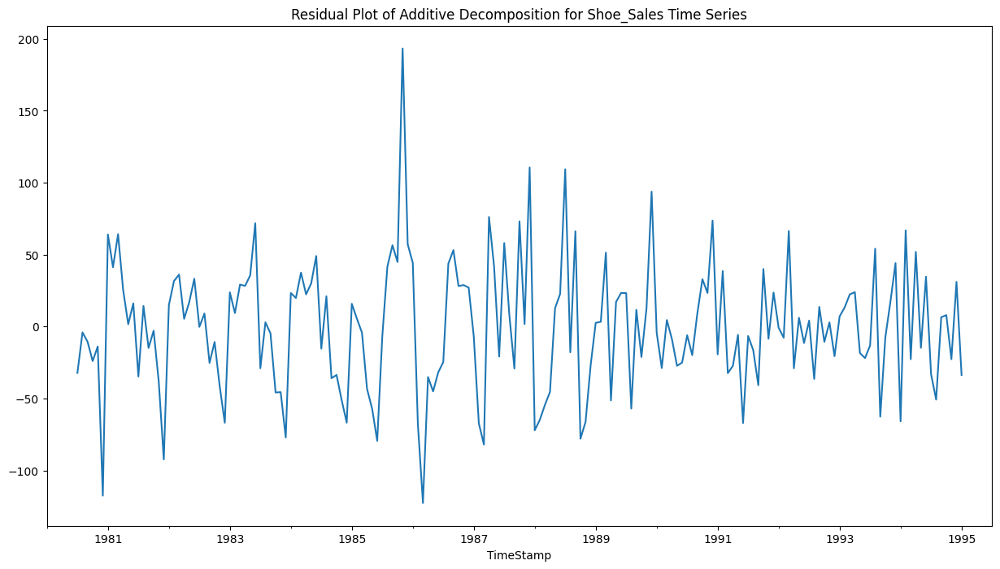

In [ ]:
#Let us know view R_Residual plot
R_Residual.plot()
plt.title('Residual Plot of Additive Decomposition for Shoe_Sales Time Series')

### Multiplicative Decomposition of Shoe_Sales

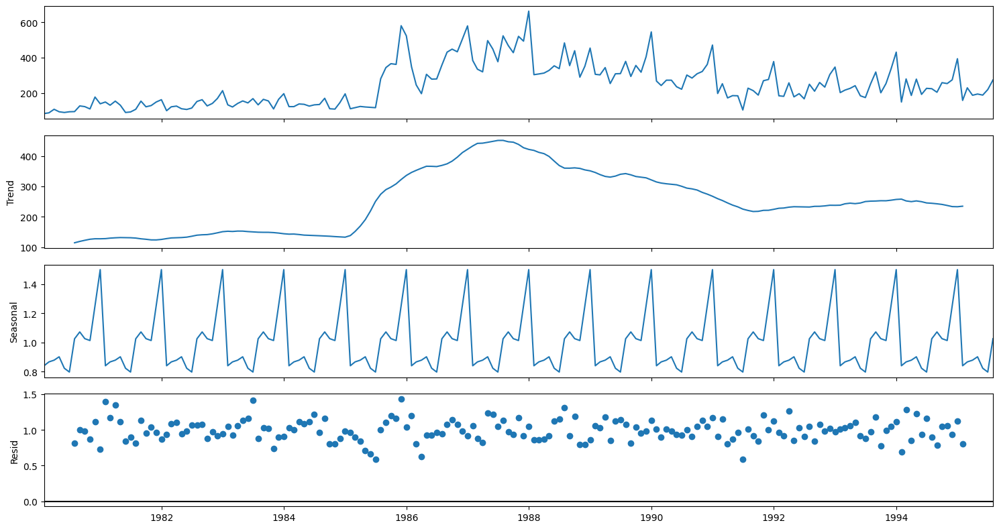

In [ ]:
df1_Mdecompose = seasonal_decompose(df1, model='multiplicative', period=12)
df1_Mdecompose.plot()
plt.tight_layout()
plt.show();

In [ ]:
RM_Trend=df1_Mdecompose.trend
RM_Seasonality=df1_Mdecompose.seasonal
RM_Residual=df1_Mdecompose.resid

print ('RM_Trend', RM_Trend.head(10), '\n')
print ('RM_Seasonality', RM_Seasonality.head(10), '\n')
print ('RM_Residual', RM_Residual.head(10), '\n')

RM_Trend TimeStamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    114.458333
1980-08-31    118.958333
1980-09-30    122.666667
1980-10-31    126.125000
Name: trend, dtype: float64 

RM_Seasonality TimeStamp
1980-01-31    0.840405
1980-02-29    0.866682
1980-03-31    0.878675
1980-04-30    0.901826
1980-05-31    0.823141
1980-06-30    0.797254
1980-07-31    1.025527
1980-08-31    1.072445
1980-09-30    1.026307
1980-10-31    1.013557
Name: seasonal, dtype: float64 

RM_Residual TimeStamp
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    0.817856
1980-08-31    1.003322
1980-09-30    0.984958
1980-10-31    0.868308
Name: resid, dtype: float64 



In [ ]:
RM_Trend.head(12).to_csv('Shoe_Sales_mtrend.csv')
RM_Seasonality.head(12).to_csv('Shoe_Sales_mseason.csv')
RM_Residual.head(12).to_csv('Shoe_Sales_mresid.csv')

Text(0.5, 1.0, 'Residual Plot of Multiplicative Decomposition for Shoe_Sales Time Series')

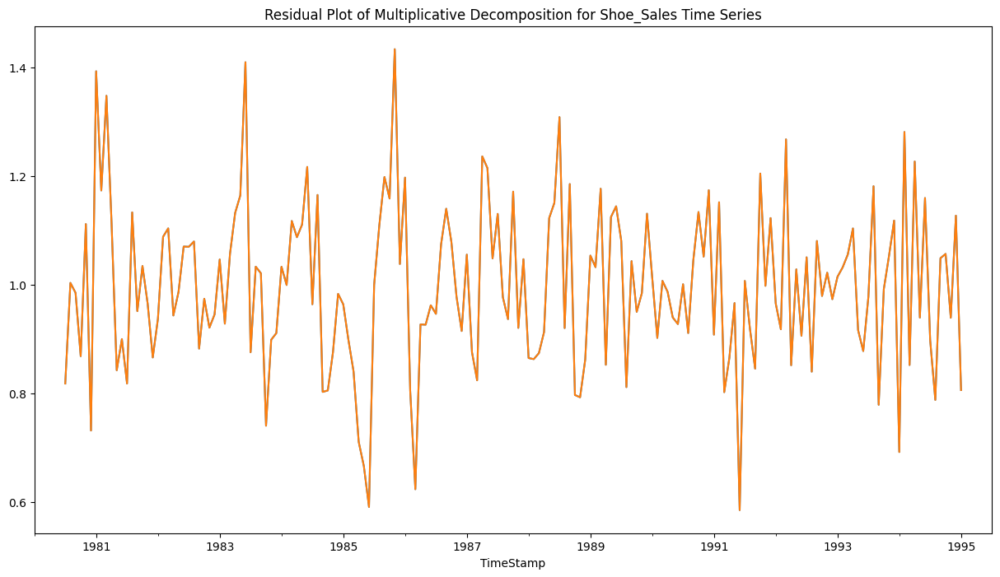

In [ ]:
#Let us know view R_Residual plot for Multiplicative Decomposition
RM_Residual.plot()
plt.title('Residual Plot of Multiplicative Decomposition for Shoe_Sales Time Series')#Let us know view R_Residual plot for Multiplicative Decomposition
RM_Residual.plot()
plt.title('Residual Plot of Multiplicative Decomposition for Shoe_Sales Time Series')

### Split the data into training and test. The test data should start in 1991.

In [ ]:
rtrain=df1[df1.index<'1991']
rtest=df1[df1.index>='1991']

In [ ]:
print(rtrain.shape)
print(rtest.shape)

(132, 1)
(55, 1)


In [ ]:
## This is to display multiple data frames from one cell
from IPython.display import display

In [ ]:
print('First few rows of Training Data')
display(rtrain.head())
print('Last few rows of Training Data')
display(rtrain.tail())
print('First few rows of Test Data')
display(rtest.head())
print('Last few rows of Test Data')
display(rtest.tail())

First few rows of Training Data


,Shoe_Sales
TimeStamp,
1980-01-31,85
1980-02-29,89
1980-03-31,109
1980-04-30,95
1980-05-31,91


Last few rows of Training Data


,Shoe_Sales
TimeStamp,
1990-08-31,285
1990-09-30,309
1990-10-31,322
1990-11-30,362
1990-12-31,471


First few rows of Test Data


,Shoe_Sales
TimeStamp,
1991-01-31,198
1991-02-28,253
1991-03-31,173
1991-04-30,186
1991-05-31,185


Last few rows of Test Data


,Shoe_Sales
TimeStamp,
1995-03-31,188
1995-04-30,195
1995-05-31,189
1995-06-30,220
1995-07-31,274


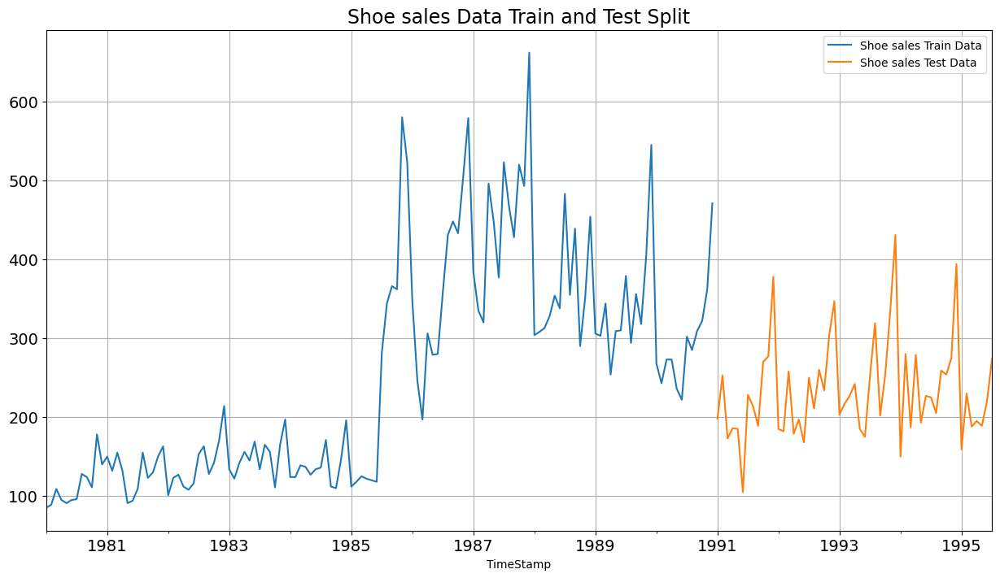

In [ ]:
#Visualization of train and test data.
rtrain['Shoe_Sales'].plot(fontsize=14)
rtest['Shoe_Sales'].plot(fontsize=14)
plt.grid()
plt.legend(['Shoe sales Train Data','Shoe sales Test Data'])
plt.title('Shoe sales Data Train and Test Split', fontsize=17)
plt.show();

### Build different Models and Model Evaluation

#### Model 1 - LINEAR REGRESSION

Before we start with Linear Regression we have to modify our training and test data so that we can build a model that is going to regress the 'Shoe_Sales' variable against the order of the occurrence.

In [ ]:
print(rtrain.shape)
print(rtest.shape)

(132, 1)
(55, 1)


In [ ]:
train_time = [i+1 for i in range(len(rtrain))]
test_time = [i+133 for i in range(len(rtest))]
print('Training Time Instance :','\n',train_time)
print('Test Time Instance :','\n',test_time)

Training Time Instance : 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time Instance : 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [ ]:
LR_train = rtrain.copy()
LR_test = rtest.copy()

In [ ]:
LR_train['Time']=train_time
LR_test['Time']=test_time

In [ ]:
print('First few rows of Training Data')
display(LR_train.head())
print('Last few rows of Training Data')
display(LR_train.tail())
print('First few rows of Test Data')
display(LR_test.head())
print('Last few rows of Test Data')
display(LR_test.tail())

First few rows of Training Data


,Shoe_Sales,Time
TimeStamp,,
1980-01-31,85,1
1980-02-29,89,2
1980-03-31,109,3
1980-04-30,95,4
1980-05-31,91,5


Last few rows of Training Data


,Shoe_Sales,Time
TimeStamp,,
1990-08-31,285,128
1990-09-30,309,129
1990-10-31,322,130
1990-11-30,362,131
1990-12-31,471,132


First few rows of Test Data


,Shoe_Sales,Time
TimeStamp,,
1991-01-31,198,133
1991-02-28,253,134
1991-03-31,173,135
1991-04-30,186,136
1991-05-31,185,137


Last few rows of Test Data


,Shoe_Sales,Time
TimeStamp,,
1995-03-31,188,183
1995-04-30,195,184
1995-05-31,189,185
1995-06-30,220,186
1995-07-31,274,187


In [ ]:
#Let us build Linear Regression on the modified test and training data
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
lr.fit(LR_train[['Time']],LR_train['Shoe_Sales'])

LinearRegression()

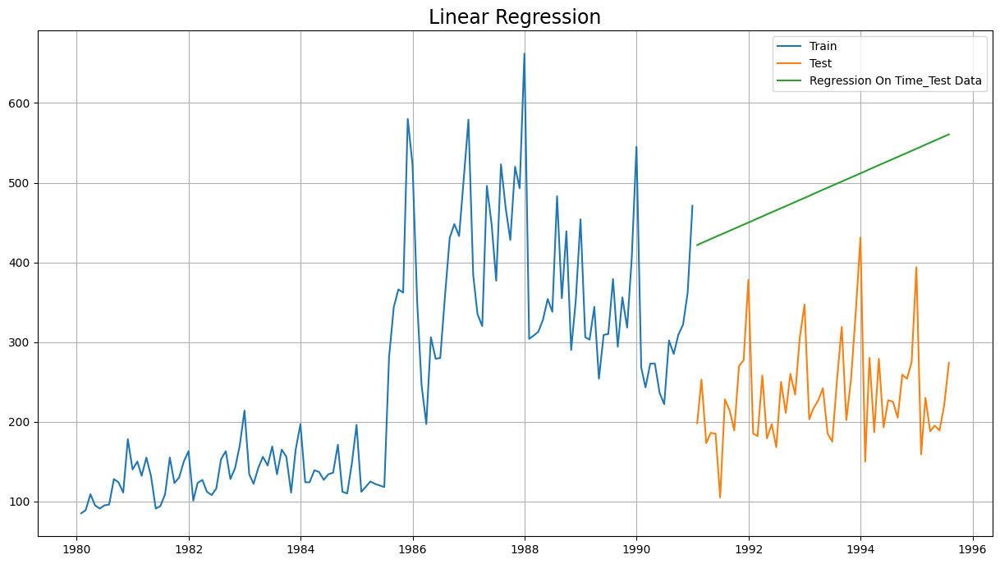

In [ ]:
train_predictions_LR = lr.predict(LR_train[['Time']])
LR_train['RegOnTime']= train_predictions_LR

test_predictions_LR = lr.predict(LR_test[['Time']])
LR_test['RegOnTime'] = test_predictions_LR

plt.plot(rtrain['Shoe_Sales'], label='Train')
plt.plot(rtest['Shoe_Sales'], label='Test')
plt.plot(LR_test['RegOnTime'], label='Regression On Time_Test Data')
plt.title('Linear Regression', fontsize=17)
plt.legend(loc='best')
plt.grid()
plt.show();

In [ ]:
#Model Evaluation
rmse_LR_test = mean_squared_error(rtest['Shoe_Sales'],test_predictions_LR,squared=False)
print("For Regression On Time forecast on the Test Data,  RMSE is %3.3f " %(rmse_LR_test))

For Regression On Time forecast on the Test Data,  RMSE is 266.276 


In [ ]:
#Let's create a DataFrame for all the RMSE Value
Results = pd.DataFrame({'Test RMSE Shoe sales': [rmse_LR_test]},index=['Regression On Time'])
Results

,Test RMSE Shoe sales
Regression On Time,266.276472


Model 2 - NAIVE APPROACH

In [ ]:
NM_train = rtrain.copy()
NM_test = rtest.copy()

In [ ]:
rtrain.tail()

,Shoe_Sales
TimeStamp,
1990-08-31,285
1990-09-30,309
1990-10-31,322
1990-11-30,362
1990-12-31,471


In [ ]:
NM_test['naive'] = np.asarray(rtrain['Shoe_Sales'])[len(np.asarray(rtrain['Shoe_Sales']))-1]
NM_test['naive'].head()

TimeStamp
1991-01-31    471
1991-02-28    471
1991-03-31    471
1991-04-30    471
1991-05-31    471
Name: naive, dtype: int64

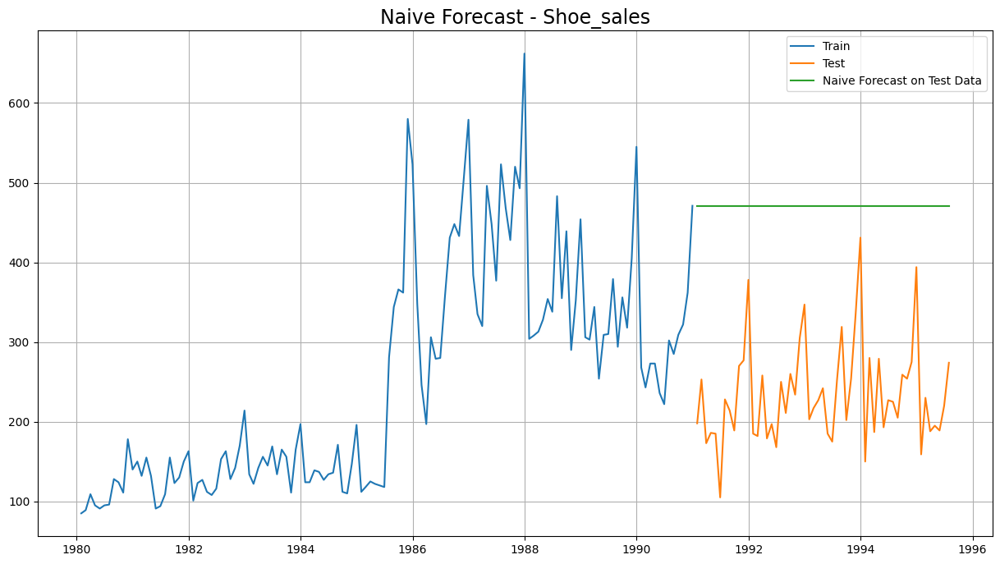

In [ ]:
plt.plot(NM_train['Shoe_Sales'], label='Train')
plt.plot(rtest['Shoe_Sales'], label='Test')

plt.plot(NM_test['naive'], label='Naive Forecast on Test Data')

plt.legend(loc='best')
plt.title("Naive Forecast - Shoe_sales", fontsize=17)
plt.grid()
plt.show();

In [ ]:
rmse_NM_test = mean_squared_error(rtest['Shoe_Sales'],NM_test['naive'],squared=False)
print("For Naive Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_NM_test))

For Naive Model forecast on the Test Data,  RMSE is 245.121


In [ ]:
Results_21 = pd.DataFrame({'Test RMSE Shoe sales': [rmse_NM_test]},index=['Naive Model'])
resultsDf3 = pd.concat([Results, Results_21], axis=0)
resultsDf3

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306


Model 3 - SIMPLE AVERAGE MODEL

In [ ]:
#For this particular simple average method, we will forecast by using the average of the training values.
SA_train = rtrain.copy()
SA_test = rtest.copy()

In [ ]:
SA_test['mean_forecast'] = rtrain['Shoe_Sales'].mean()
SA_test.head()

,Shoe_Sales,mean_forecast
TimeStamp,,
1991-01-31,198,250.575758
1991-02-28,253,250.575758
1991-03-31,173,250.575758
1991-04-30,186,250.575758
1991-05-31,185,250.575758


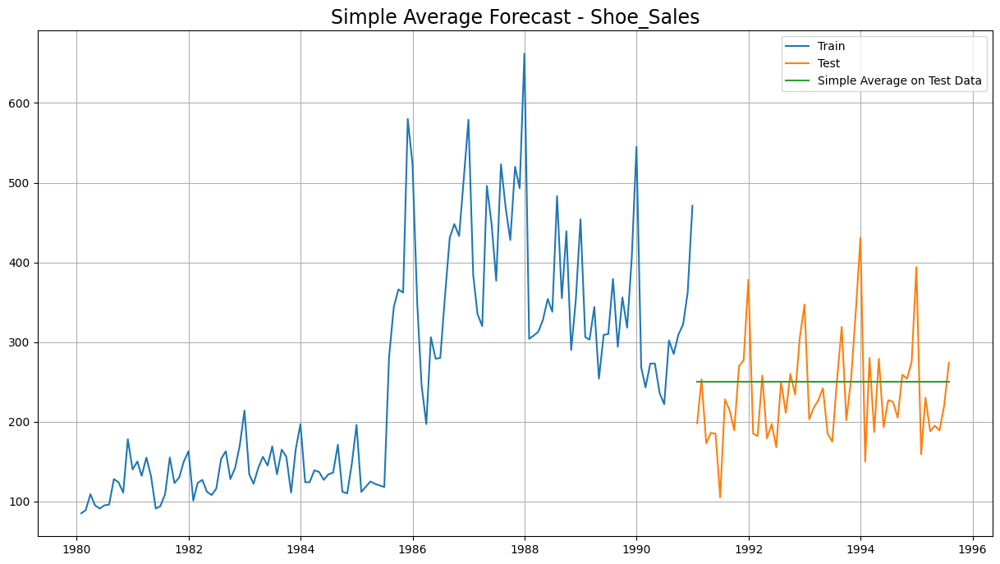

In [ ]:
plt.plot(SA_train['Shoe_Sales'], label='Train')
plt.plot(SA_test['Shoe_Sales'], label='Test')

plt.plot(SA_test['mean_forecast'], label='Simple Average on Test Data')

plt.legend(loc='best')
plt.title("Simple Average Forecast - Shoe_Sales", fontsize=17)
plt.grid()
plt.show();

In [ ]:
rmse_SA_test = mean_squared_error(rtest['Shoe_Sales'],SA_test['mean_forecast'],squared=False)
print("For Simple Average forecast on Shoe sales Test Data,  RMSE is %3.3f" %(rmse_SA_test))

For Simple Average forecast on Shoe sales Test Data,  RMSE is 63.985


In [ ]:
resultsDf_31 = pd.DataFrame({'Test RMSE Shoe sales': [rmse_SA_test]},index=['Simple Average Model'])
resultsDf_31

,Test RMSE Shoe sales
Simple Average Model,63.98457


In [ ]:
resultsDf3 = pd.concat([Results, Results_21,resultsDf_31], axis=0)
resultsDf3

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570


Model 4 - MOVING AVERAGE MODEL

In [ ]:
MovingAverage = df1.copy()
MovingAverage.head()

,Shoe_Sales
TimeStamp,
1980-01-31,85
1980-02-29,89
1980-03-31,109
1980-04-30,95
1980-05-31,91


In [ ]:
#Moving Models

MovingAverage['Trailing_4'] = MovingAverage['Shoe_Sales'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Shoe_Sales'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Shoe_Sales'].rolling(9).mean()

MovingAverage.head()

,Shoe_Sales,Trailing_4,Trailing_6,Trailing_9
TimeStamp,,,,
1980-01-31,85,NaN,NaN,NaN
1980-02-29,89,NaN,NaN,NaN
1980-03-31,109,NaN,NaN,NaN
1980-04-30,95,94.5,NaN,NaN
1980-05-31,91,96.0,NaN,NaN


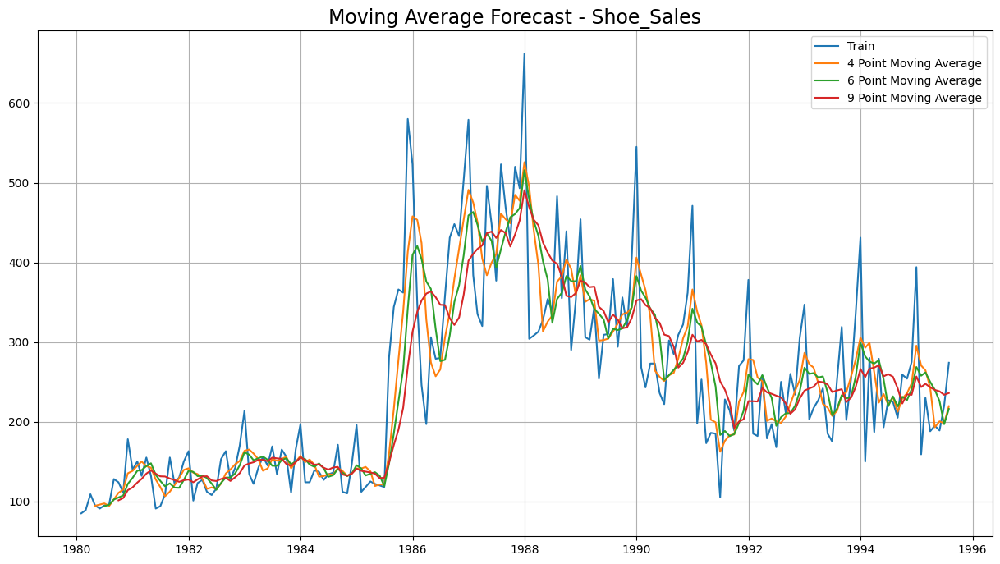

In [ ]:
#Visulaizing the trailing models together on whole Shoe_Sales dataset
plt.plot(MovingAverage['Shoe_Sales'], label='Train')

plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid()
plt.title('Moving Average Forecast - Shoe_Sales', fontsize=17)
plt.show();

In [ ]:
#Splitting the data into test anr train again
trailing_MovingAverage_train=MovingAverage[MovingAverage.index<'1991']
trailing_MovingAverage_test=MovingAverage[MovingAverage.index>='1991']

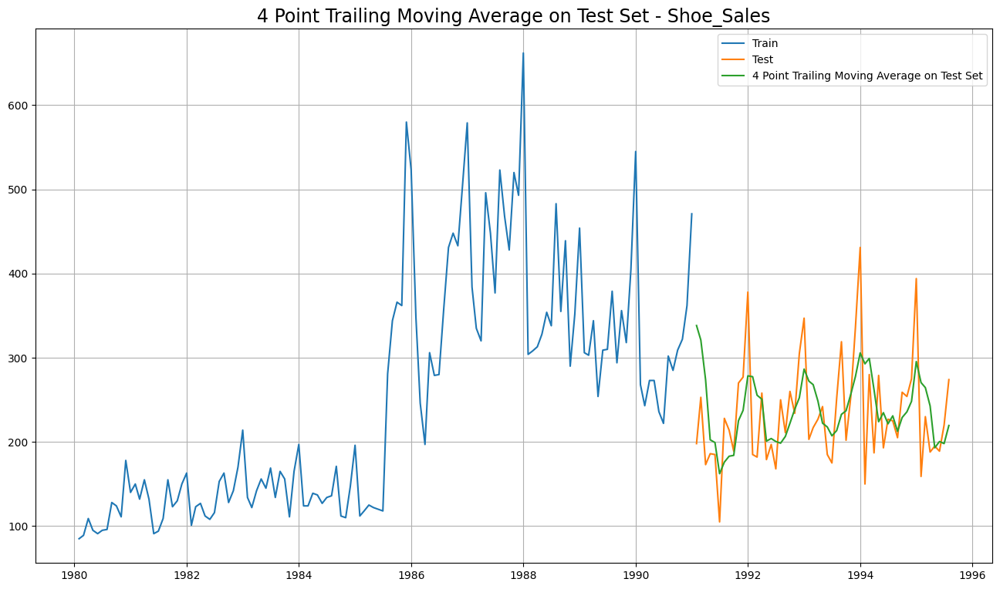

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Shoe_Sales'], label='Train')
plt.plot(trailing_MovingAverage_test['Shoe_Sales'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')

#The best location for title
plt.legend(loc ='best')
plt.grid()
plt.title('4 Point Trailing Moving Average on Test Set - Shoe_Sales', fontsize=17);
plt.show();

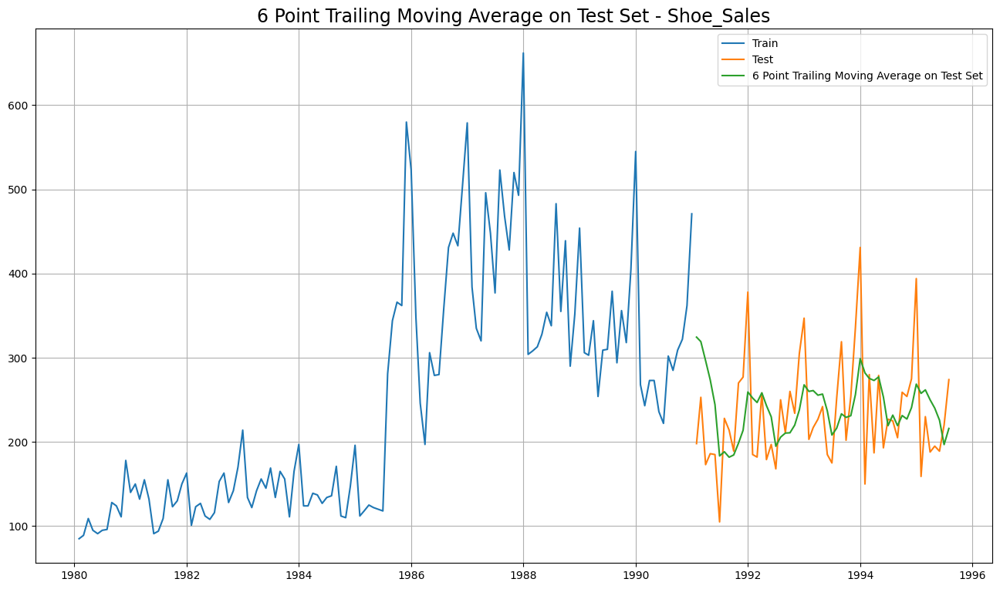

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Shoe_Sales'], label='Train')
plt.plot(trailing_MovingAverage_test['Shoe_Sales'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_6'], label='6 Point Trailing Moving Average on Test Set')

#The best location for title
plt.legend(loc ='best')
plt.grid()
plt.title('6 Point Trailing Moving Average on Test Set - Shoe_Sales', fontsize=17);
plt.show();

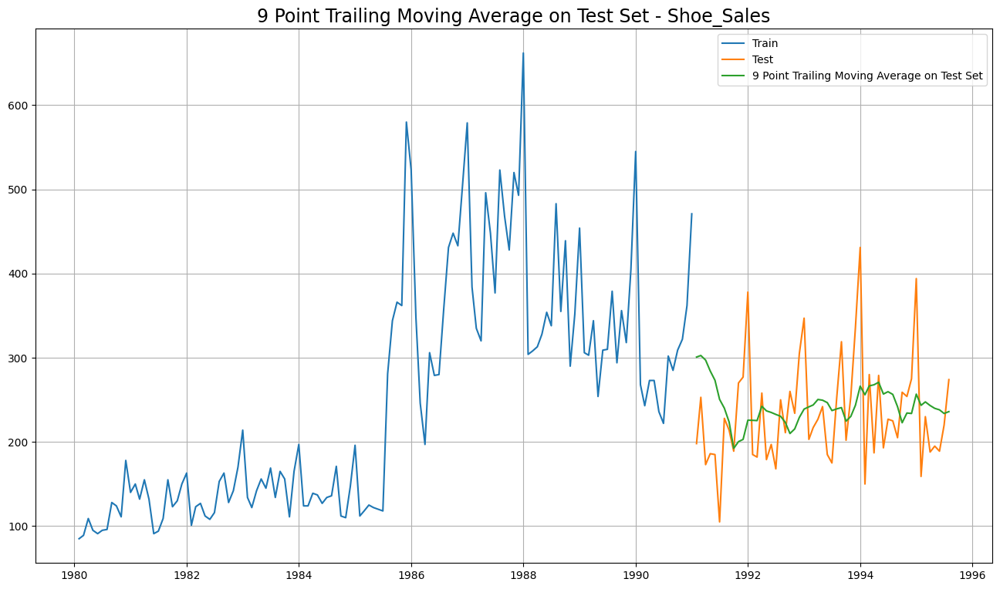

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Shoe_Sales'], label='Train')
plt.plot(trailing_MovingAverage_test['Shoe_Sales'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_9'], label='9 Point Trailing Moving Average on Test Set')

#The best location for title
plt.legend(loc ='best')
plt.grid()
plt.title('9 Point Trailing Moving Average on Test Set - Shoe_Sales', fontsize=17);
plt.show();

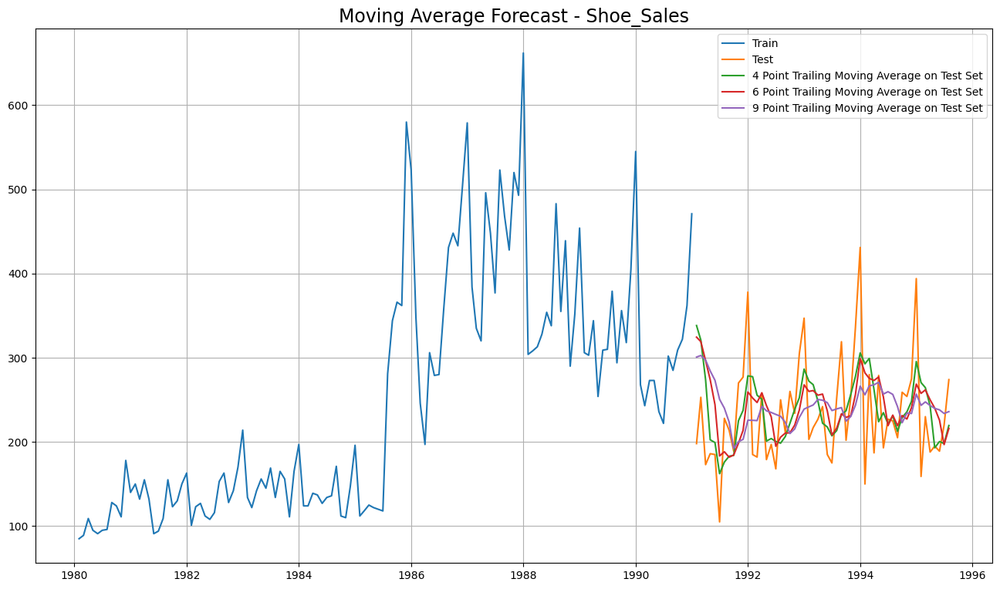

In [ ]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_train['Shoe_Sales'], label='Train')
plt.plot(trailing_MovingAverage_test['Shoe_Sales'], label='Test')

plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
#The best location for title
plt.legend(loc ='best')
plt.grid()
plt.title('Moving Average Forecast - Shoe_Sales', fontsize=17);
plt.show();

In [ ]:
#Model Evaluation: This is done only on test data

## Test Data - RMSE --> 4 point Trailing MA

rmse_MA_test_4 = mean_squared_error(rtest['Shoe_Sales'],trailing_MovingAverage_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is %3.3f" %(rmse_MA_test_4))

## Test Data - RMSE --> 6 point Trailing MA

rmse_MA_test_6 = mean_squared_error(rtest['Shoe_Sales'],trailing_MovingAverage_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is %3.3f" %(rmse_MA_test_6))

## Test Data - RMSE --> 9 point Trailing MA

rmse_MA_test_9 = mean_squared_error(rtest['Shoe_Sales'],trailing_MovingAverage_test['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is %3.3f" %(rmse_MA_test_9))

For 4 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is 57.873
For 6 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is 63.457
For 9 point Moving Average Model forecast on Shoe_Sales Training Data,  RMSE is 67.724


In [ ]:
resultsDf_41 = pd.DataFrame({'Test RMSE Shoe sales': [rmse_MA_test_4 ,rmse_MA_test_6,rmse_MA_test_9]} ,index=['4point Trailing MovingAverage','6point Trailing MovingAverage','9point Trailing MovingAverage'])
resultsDf_41

,Test RMSE Shoe sales
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648


In [ ]:
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41], axis=0)
ResultResult = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648


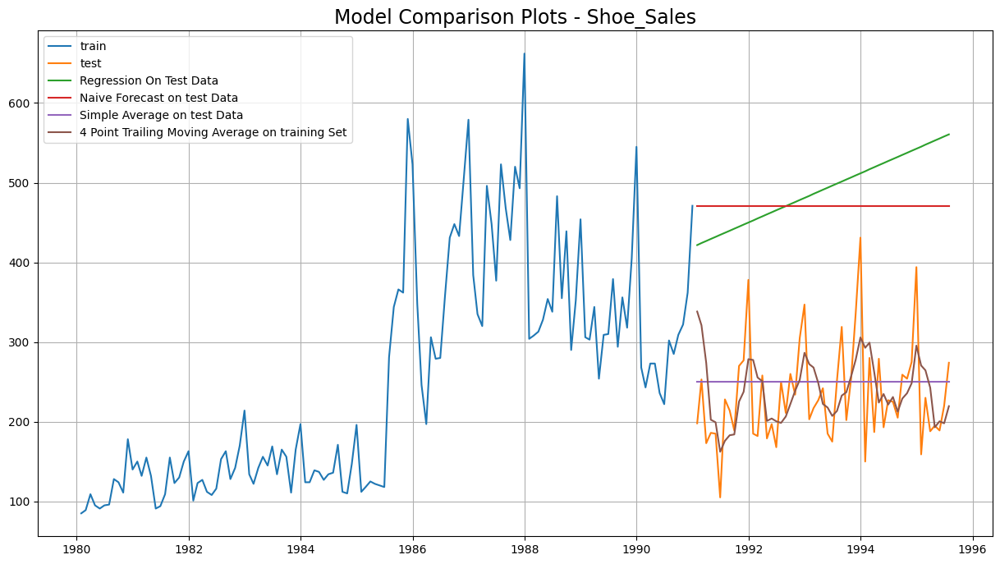

In [ ]:
#Since we have built all the models now, lets visualize a consildated plots for all the above models.
plt.plot(rtrain['Shoe_Sales'], label='train')
plt.plot(rtest['Shoe_Sales'], label='test')

plt.plot(LR_test['RegOnTime'], label='Regression On Test Data')

plt.plot(NM_test['naive'], label='Naive Forecast on test Data')

plt.plot(SA_test['mean_forecast'], label='Simple Average on test Data')

plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on training Set') #2point Trailing MovingAverage has the least RMSE value


plt.legend(loc='best')
plt.title("Model Comparison Plots - Shoe_Sales", fontsize=17)
plt.grid();

Model 5 - Simple Exponential Smoothing

In [ ]:
import statsmodels.tools.eval_measures as em
from statsmodels.tsa.api import SimpleExpSmoothing, ExponentialSmoothing, Holt

In [ ]:
model_SES = SimpleExpSmoothing(rtrain,initialization_method='estimated' )
model_SES_autofit = model_SES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
model_SES_autofit.params

{'smoothing_level': 0.60504993589639,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 88.82961878179444,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
#Here, Python has optimized the smoothing level to be almost 0.1
SES_predict_Shoe_sales = model_SES_autofit.forecast(steps=len(rtest))
SES_predict_Shoe_sales

1991-01-31    420.229967
1991-02-28    420.229967
1991-03-31    420.229967
1991-04-30    420.229967
1991-05-31    420.229967
1991-06-30    420.229967
1991-07-31    420.229967
1991-08-31    420.229967
1991-09-30    420.229967
1991-10-31    420.229967
1991-11-30    420.229967
1991-12-31    420.229967
1992-01-31    420.229967
1992-02-29    420.229967
1992-03-31    420.229967
1992-04-30    420.229967
1992-05-31    420.229967
1992-06-30    420.229967
1992-07-31    420.229967
1992-08-31    420.229967
1992-09-30    420.229967
1992-10-31    420.229967
1992-11-30    420.229967
1992-12-31    420.229967
1993-01-31    420.229967
1993-02-28    420.229967
1993-03-31    420.229967
1993-04-30    420.229967
1993-05-31    420.229967
1993-06-30    420.229967
1993-07-31    420.229967
1993-08-31    420.229967
1993-09-30    420.229967
1993-10-31    420.229967
1993-11-30    420.229967
1993-12-31    420.229967
1994-01-31    420.229967
1994-02-28    420.229967
1994-03-31    420.229967
1994-04-30    420.229967


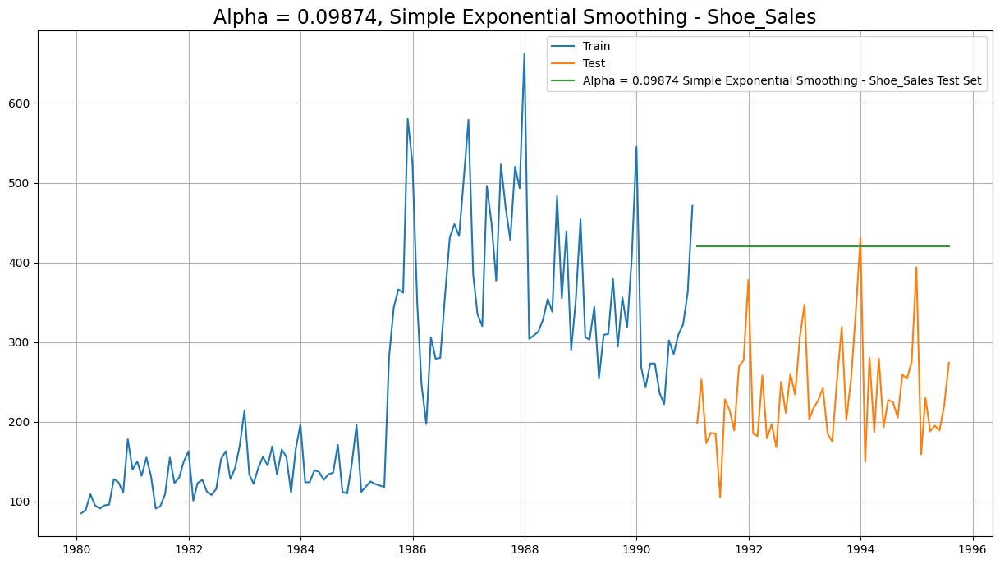

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(SES_predict_Shoe_sales, label='Alpha = 0.09874 Simple Exponential Smoothing - Shoe_Sales Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha = 0.09874, Simple Exponential Smoothing - Shoe_Sales', fontsize=17);

In [ ]:
#Model Evaluation
print('SES RMSE:',mean_squared_error(rtest.values,SES_predict_Shoe_sales.values,squared=False))

SES RMSE: 196.40494102498238


In [ ]:
R_SES= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,SES_predict_Shoe_sales.values,squared=False)]},index=['Simple Exponential Smoothing'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41, R_SES], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941


### Model 6 - Double Exponential Model

In [ ]:
model_DES = Holt(rtrain,initialization_method='estimated' )
model_DES_autofit = model_DES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
model_DES_autofit.params

{'smoothing_level': 0.5949085457600333,
 'smoothing_trend': 0.0002777648923329902,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 82.93522505452626,
 'initial_trend': 2.5392328089641367,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
DES_predict_Shoe_sales = model_DES_autofit.forecast(steps=len(rtest))
DES_predict_Shoe_sales

1991-01-31    422.908695
1991-02-28    425.448566
1991-03-31    427.988438
1991-04-30    430.528309
1991-05-31    433.068181
1991-06-30    435.608052
1991-07-31    438.147924
1991-08-31    440.687795
1991-09-30    443.227667
1991-10-31    445.767538
1991-11-30    448.307410
1991-12-31    450.847281
1992-01-31    453.387153
1992-02-29    455.927024
1992-03-31    458.466896
1992-04-30    461.006767
1992-05-31    463.546639
1992-06-30    466.086510
1992-07-31    468.626382
1992-08-31    471.166253
1992-09-30    473.706125
1992-10-31    476.245996
1992-11-30    478.785868
1992-12-31    481.325739
1993-01-31    483.865611
1993-02-28    486.405482
1993-03-31    488.945354
1993-04-30    491.485225
1993-05-31    494.025097
1993-06-30    496.564968
1993-07-31    499.104840
1993-08-31    501.644711
1993-09-30    504.184583
1993-10-31    506.724454
1993-11-30    509.264326
1993-12-31    511.804197
1994-01-31    514.344069
1994-02-28    516.883940
1994-03-31    519.423812
1994-04-30    521.963683


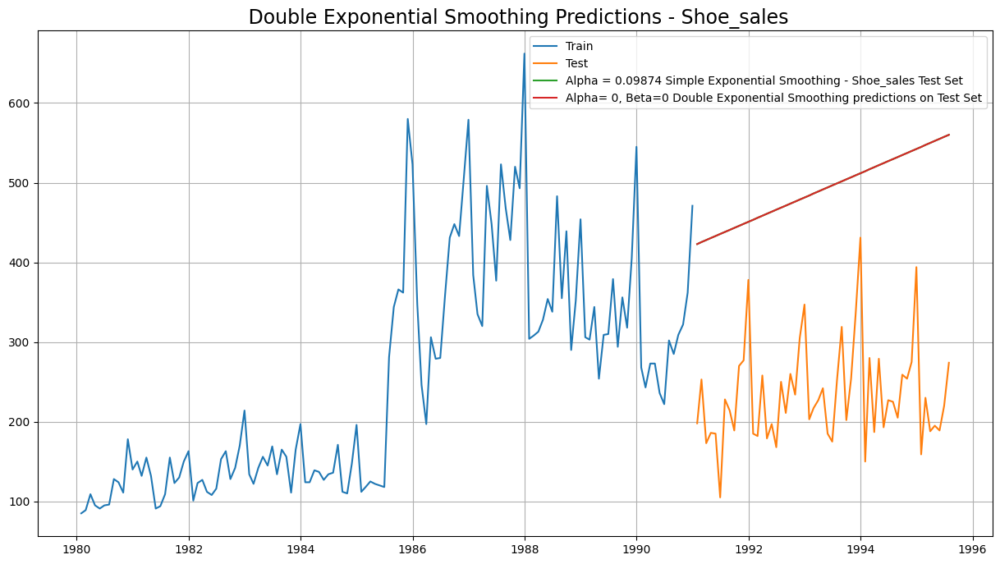

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

plt.plot(DES_predict_Shoe_sales, label='Alpha = 0.09874 Simple Exponential Smoothing - Shoe_sales Test Set') #SES
plt.plot(DES_predict_Shoe_sales, label='Alpha= 0, Beta=0 Double Exponential Smoothing predictions on Test Set') #DES

plt.legend(loc='best')
plt.grid()
plt.title(' Double Exponential Smoothing Predictions - Shoe_sales', fontsize=17);

In [ ]:
#Model Evaluation
print('DES RMSE:',mean_squared_error(rtest.values,DES_predict_Shoe_sales.values,squared=False))

DES RMSE: 266.5684287163948


In [ ]:
R_DES= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,DES_predict_Shoe_sales.values,squared=False)]},index=['Double Exponential Smoothing'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41, R_SES, R_DES], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429


#### Model 7 - Holt-Winter's Model (Exponential Smoothing) with additive errors

In [ ]:
model_TES = ExponentialSmoothing(rtrain,trend='additive',seasonal='additive',initialization_method='estimated')
model_TES_autofit = model_TES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
model_TES_autofit.params

{'smoothing_level': 0.5722121481903332,
 'smoothing_trend': 0.010424204394132648,
 'smoothing_seasonal': 0.2733064512861663,
 'damping_trend': nan,
 'initial_level': 127.63256960661492,
 'initial_trend': 2.128374124666348,
 'initial_seasons': array([-47.75924795, -45.73192519, -16.68460264, -14.62093609,
        -22.53394273,  -6.83080393,  12.37845207,  41.25059797,
         23.03086932,  12.10276437,  53.07487041,  23.4616035 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
TES_predict_Shoe_sales = model_TES_autofit.forecast(steps=len(rtest))
TES_predict_Shoe_sales

1991-01-31    222.794048
1991-02-28    215.688235
1991-03-31    243.726457
1991-04-30    261.300316
1991-05-31    275.782177
1991-06-30    270.734706
1991-07-31    362.958977
1991-08-31    324.159902
1991-09-30    358.664582
1991-10-31    333.669387
1991-11-30    387.152688
1991-12-31    477.862951
1992-01-31    237.020109
1992-02-29    229.914296
1992-03-31    257.952518
1992-04-30    275.526377
1992-05-31    290.008238
1992-06-30    284.960767
1992-07-31    377.185038
1992-08-31    338.385963
1992-09-30    372.890643
1992-10-31    347.895448
1992-11-30    401.378749
1992-12-31    492.089012
1993-01-31    251.246170
1993-02-28    244.140357
1993-03-31    272.178579
1993-04-30    289.752438
1993-05-31    304.234298
1993-06-30    299.186828
1993-07-31    391.411099
1993-08-31    352.612023
1993-09-30    387.116703
1993-10-31    362.121509
1993-11-30    415.604810
1993-12-31    506.315073
1994-01-31    265.472231
1994-02-28    258.366418
1994-03-31    286.404640
1994-04-30    303.978498


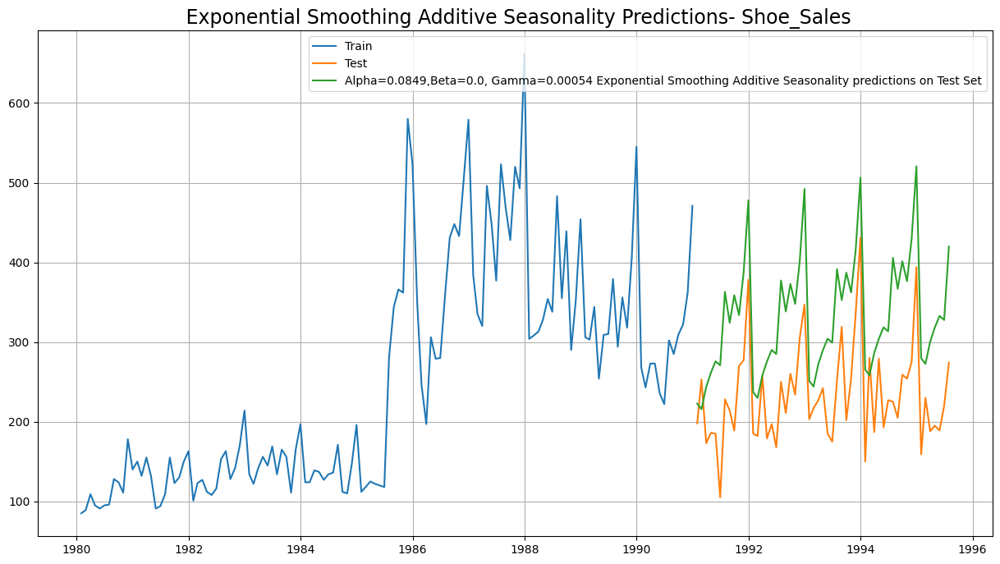

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

#plt.plot(SES_predict_Shoe_sales, label='Alpha = 0.09874 Simple Exponential Smoothing - Shoe_Sales Test Set')
#plt.plot(DES_predict_Shoe_sales, label='Alpha=0, Beta=0 Double Exponential Smoothing predictions on Test Set')
plt.plot(TES_predict_Shoe_sales, label='Alpha=0.0849,Beta=0.0, Gamma=0.00054 Exponential Smoothing Additive Seasonality predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title(' Exponential Smoothing Additive Seasonality Predictions- Shoe_Sales', fontsize=17);

In [ ]:
#Model Evaluation
print('TES RMSE:',mean_squared_error(rtest.values,TES_predict_Shoe_sales.values,squared=False))

TES RMSE: 109.01688439657312


In [ ]:
R_TES= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,TES_predict_Shoe_sales.values,squared=False)]},index=['Exponential Smoothing (Additive Seasonality)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884


## Model 8 - Holt-Winter's Model (Exponential Smoothing) with multiplicative seasonality

In [ ]:
model_TES_M = ExponentialSmoothing(rtrain,trend='additive',seasonal='multiplicative',initialization_method='estimated')
model_TES_M_autofit = model_TES_M.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
model_TES_M_autofit.params

{'smoothing_level': 0.6009868693481561,
 'smoothing_trend': 0.006156909298740214,
 'smoothing_seasonal': 0.17574086651628373,
 'damping_trend': nan,
 'initial_level': 107.69608365185793,
 'initial_trend': 0.4232661374510192,
 'initial_seasons': array([1.09755031, 0.99553258, 1.21255323, 1.38802376, 1.29807702,
        1.10890294, 1.22578614, 1.43128568, 1.70333676, 1.4459007 ,
        1.7104661 , 1.94336275]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
TES_M_predict_Shoe_sales = model_TES_M_autofit.forecast(steps=len(rtest))
TES_M_predict_Shoe_sales

1991-01-31    263.531912
1991-02-28    245.139749
1991-03-31    259.792279
1991-04-30    276.337606
1991-05-31    272.442200
1991-06-30    262.642621
1991-07-31    345.145636
1991-08-31    324.141924
1991-09-30    347.267953
1991-10-31    322.201675
1991-11-30    388.197274
1991-12-31    477.651191
1992-01-31    271.950542
1992-02-29    252.950042
1992-03-31    268.047492
1992-04-30    285.095376
1992-05-31    281.053773
1992-06-30    270.922630
1992-07-31    355.998105
1992-08-31    334.307334
1992-09-30    358.130230
1992-10-31    332.253696
1992-11-30    400.276816
1992-12-31    492.475831
1993-01-31    280.369172
1993-02-28    260.760335
1993-03-31    276.302705
1993-04-30    293.853147
1993-05-31    289.665345
1993-06-30    279.202640
1993-07-31    366.850574
1993-08-31    344.472744
1993-09-30    368.992508
1993-10-31    342.305718
1993-11-30    412.356359
1993-12-31    507.300471
1994-01-31    288.787802
1994-02-28    268.570628
1994-03-31    284.557919
1994-04-30    302.610917


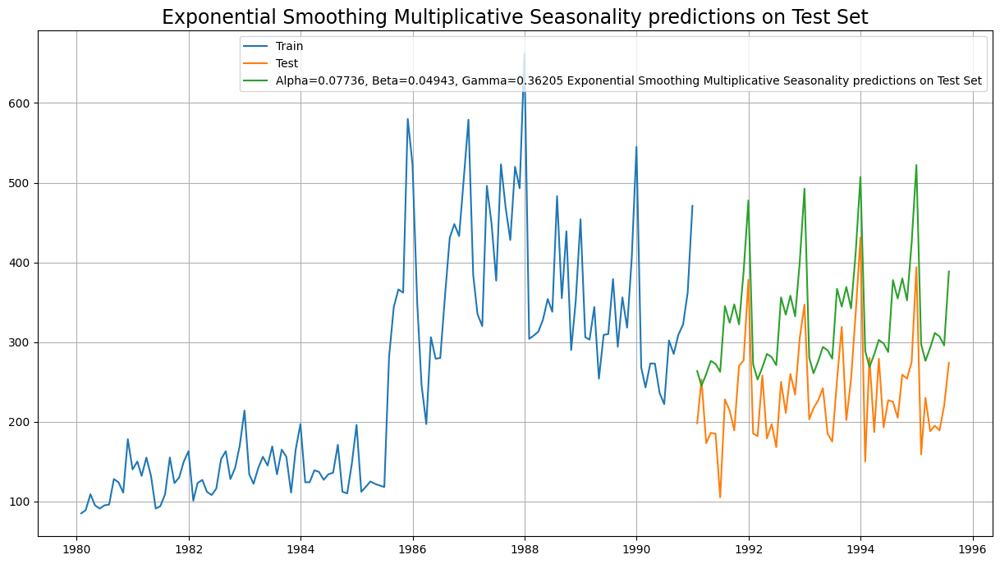

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')

#plt.plot(SES_predict_Shoe_sales, label='Alpha = 0.09874 Simple Exponential Smoothing - Rose Test Set')
#plt.plot(DES_predict_Shoe_sales, label='Alpha=0, Beta=0 Double Exponential Smoothing predictions on Test Set')
#plt.plot(TES_predict_Shoe_sales, label='Alpha=0.0849,Beta=0.0, Gamma=0.00054 Exponential Smoothing predictions on Test Set')
plt.plot(TES_M_predict_Shoe_sales, label='Alpha=0.07736, Beta=0.04943, Gamma=0.36205 Exponential Smoothing Multiplicative Seasonality predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Exponential Smoothing Multiplicative Seasonality predictions on Test Set', fontsize=17);

In [ ]:
#Model Evaluation
print('TES M_RMSE:',mean_squared_error(rtest.values,TES_M_predict_Shoe_sales.values,squared=False))

TES M_RMSE: 102.11763671023203


In [ ]:
R_M_TES= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,TES_M_predict_Shoe_sales.values,squared=False)]},index=['Exponential Smoothing (Multi Seasonality)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES, R_M_TES], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884
Exponential Smoothing (Multi Seasonality),102.117637


## Check for stationarity of the whole Time Series data.

The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:

1. H0: The Time Series has a unit root and is thus non-stationary.
2. H1:The Time Series does not have a unit root and is thus stationary
We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the α (0.05) value.

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
dftest = adfuller(df1, regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -1.577
DF test p-value is 0.801418623453652
Number of lags used 13


In [ ]:
#Since the p value is greater than 0.05, So Time Series is non-stationary.

#Let us take one level of differencing to see whether the series becomes stationary

dftest = adfuller(df1.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -3.532
DF test p-value is 0.03611703400135965
Number of lags used 12



1. We see that p-value lesser than alpha=0.05 Hence, the data is non-stationary
2.We conclude that with a lag 1 - now the shoe sales data is Stationary. Now, let us go ahead and plot the stationary series.

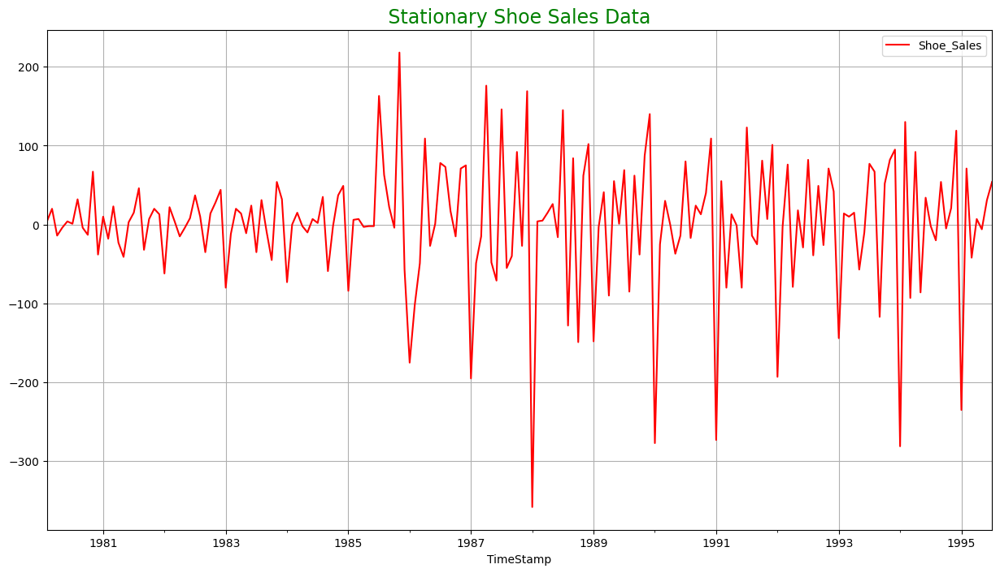

In [ ]:
df1.diff().dropna().plot(grid=True, color='red');
plt.title(' Stationary Shoe Sales Data ', color='green', fontsize=17);

Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

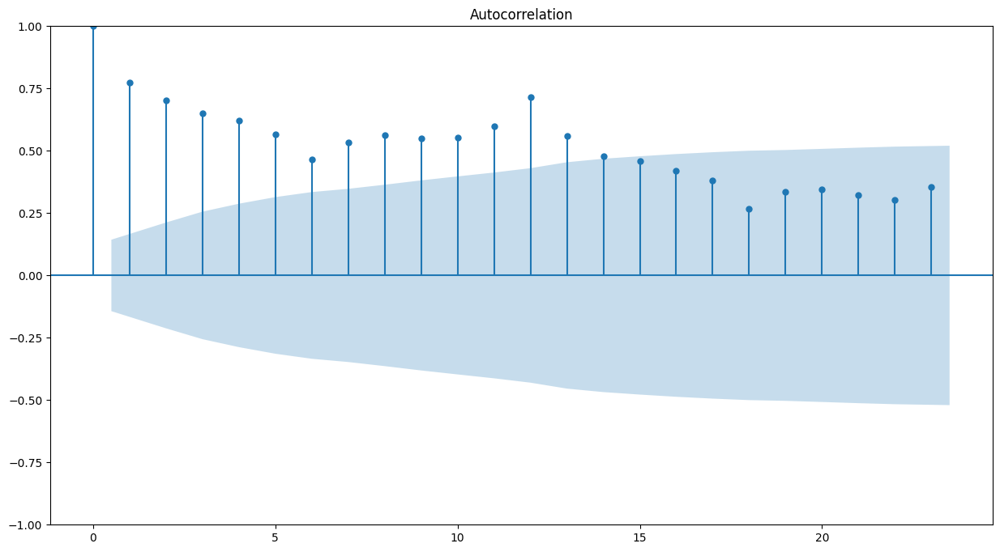

In [ ]:
plot_acf(df1, alpha=0.05);

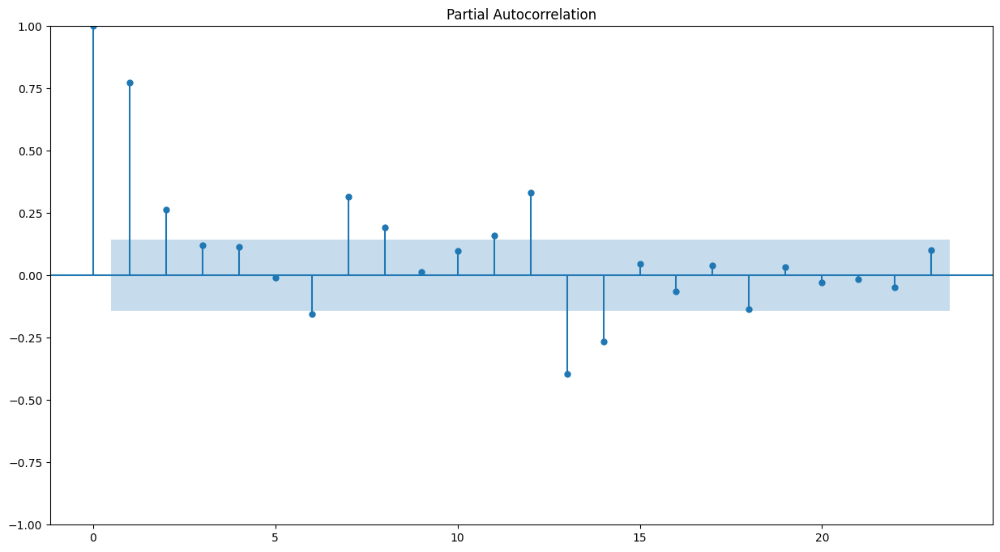

In [ ]:
plot_pacf(df1, alpha=0.05, method='ywmle');

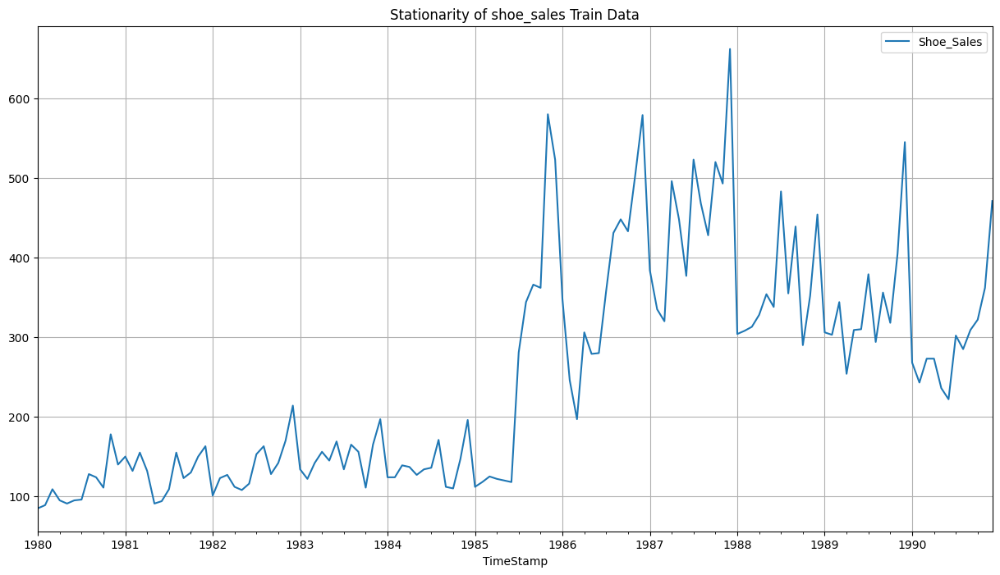

In [ ]:
#Checking for stationarity of the Training Data Time Series
rtrain.plot(grid=True)
plt.title('Stationarity of shoe_sales Train Data')
plt.show();

In [ ]:
dftest = adfuller(rtrain,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -1.749
DF test p-value is 0.7287654522797308
Number of lags used 13


In [ ]:
#Since the train data is non-stationary, lets take first level of differencing
dftest = adfuller(rtrain.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -3.181
DF test p-value is 0.08822589255919894
Number of lags used 13


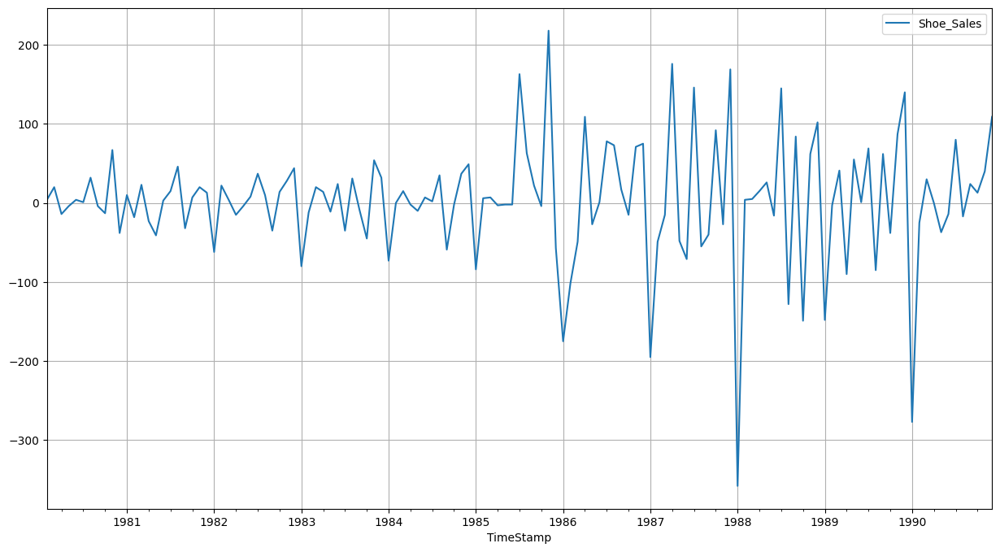

In [ ]:
#The data is now stationary at 95% confidence.
rtrain.diff().dropna().plot(grid=True);

In [ ]:
rtrain.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132 entries, 1980-01-31 to 1990-12-31
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Shoe_Sales  132 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


##Model 9 - Automated ARIMA Model


Now that our training data is stationary, let us build an automated version of ARIMA model and for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC)

Note: The data has some seasonality so ideally we should build a SARIMA model. But lets test on the lowest Akaike Information Criteria, which one suits best - ARIMA or SARIMA

In [ ]:
import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [ ]:
# Creating an empty Dataframe with column names only
SHOE_SALES_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
SHOE_SALES_ARIMA_AIC

,param,AIC


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    S_ARIMA_model = ARIMA(rtrain['Shoe_Sales'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,S_ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:1508.2837722095962
ARIMA(0, 1, 1) - AIC:1497.050322418789
ARIMA(0, 1, 2) - AIC:1494.9646053663419


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(0, 1, 3) - AIC:1495.1484738738814
ARIMA(1, 1, 0) - AIC:1501.6431242011076
ARIMA(1, 1, 1) - AIC:1492.4871865078978

<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)



ARIMA(1, 1, 2) - AIC:1494.423859457616


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(1, 1, 3) - AIC:1496.3858782559237
ARIMA(2, 1, 0) - AIC:1498.950483025858
ARIMA(2, 1, 1) - AIC:1494.431498303535


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(2, 1, 2) - AIC:1496.410739176849


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA

ARIMA(2, 1, 3) - AIC:1480.8578673211555
ARIMA(3, 1, 0) - AIC:1498.930309422661
ARIMA(3, 1, 1) - AIC:1496.346864104809


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


ARIMA(3, 1, 2) - AIC:1495.6558545482299


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(3, 1, 3) - AIC:1482.5660328404756


<ipython-input-105-108ab6aa85d0>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SHOE_SALES_ARIMA_AIC = SHOE_SALES_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


In [ ]:
SHOE_SALES_ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
11,"(2, 1, 3)",1480.857867
15,"(3, 1, 3)",1482.566033
5,"(1, 1, 1)",1492.487187
6,"(1, 1, 2)",1494.423859
9,"(2, 1, 1)",1494.431498


In [ ]:
auto_ARIMA = ARIMA(rtrain, order=(2,1,3))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:             Shoe_Sales   No. Observations:                  132
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -734.429
Date:                Thu, 24 Aug 2023   AIC                           1480.858
Time:                        11:32:29   BIC                           1498.109
Sample:                    01-31-1980   HQIC                          1487.868
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0150      0.030      0.504      0.614      -0.043       0.073
ar.L2         -0.9973      0.016    -61.668      0.000      -1.029      -0.966
ma.L1         -0.3324      0.092     -3.599      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


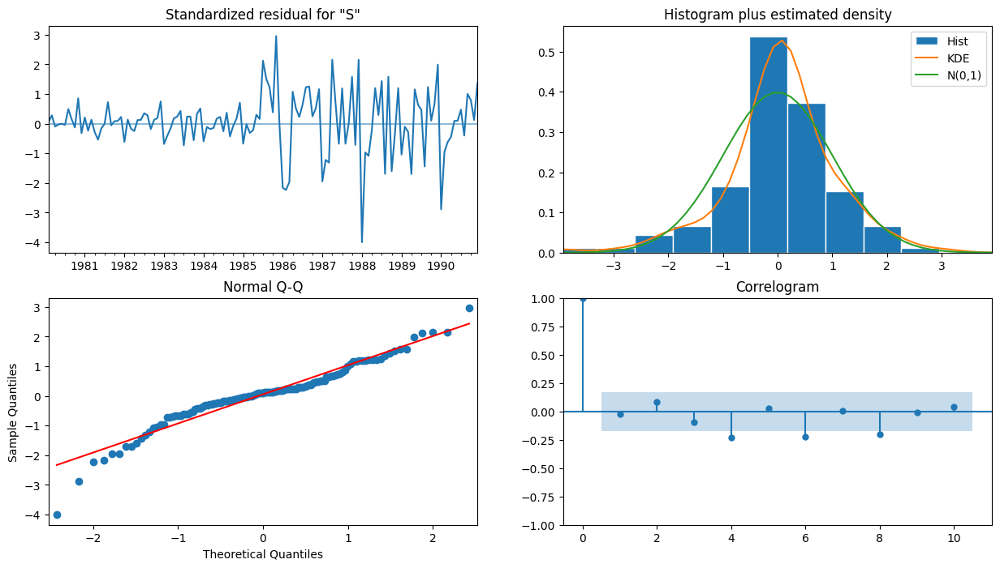

In [ ]:
#Shoesales ARIMA Diagnostic plot
results_auto_ARIMA.plot_diagnostics();

In [ ]:
#Prediction and Evaluation of ARIMA model on the Rose Test
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(rtest))
predicted_auto_ARIMA

1991-01-31    396.318332
1991-02-28    373.836070
1991-03-31    422.946969
1991-04-30    446.105552
1991-05-31    397.472098
1991-06-30    373.646143
1991-07-31    421.793419
1991-08-31    446.277688
1991-09-30    398.625164
1991-10-31    373.491745
1991-11-30    420.641100
1991-12-31    446.414406
1992-01-31    399.776474
1992-02-29    373.372643
1992-03-31    419.491062
1992-04-30    446.515957
1992-05-31    400.924981
1992-06-30    373.288575
1992-07-31    418.344344
1992-08-31    446.582616
1992-09-30    402.069653
1992-10-31    373.239247
1992-11-30    417.201971
1992-12-31    446.614693
1993-01-31    403.209475
1993-02-28    373.224337
1993-03-31    416.064952
1993-04-30    446.612523
1993-05-31    404.343442
1993-06-30    373.243496
1993-07-31    414.934282
1993-08-31    446.576470
1993-09-30    405.470571
1993-10-31    373.296345
1993-11-30    413.810937
1993-12-31    446.506926
1994-01-31    406.589890
1994-02-28    373.382479
1994-03-31    412.695880
1994-04-30    446.404310


In [ ]:
#Model Evaluation
rmse = mean_squared_error(rtest['Shoe_Sales'],predicted_auto_ARIMA,squared=False)
rmse

184.67459527853288

In [ ]:
R_ARIMA= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,predicted_auto_ARIMA.values,squared=False)]},index=['ARIMA (2, 1, 3)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES, R_ARIMA], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884
"ARIMA (2, 1, 3)",184.674595


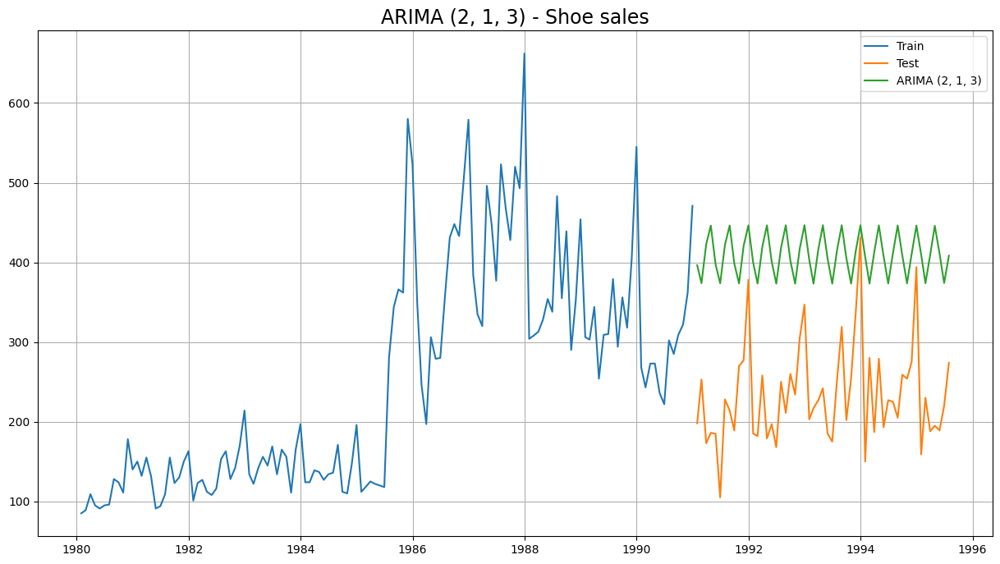

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')
plt.plot(predicted_auto_ARIMA,label='ARIMA (2, 1, 3)')


plt.legend(loc='best')
plt.grid()
plt.title('ARIMA (2, 1, 3) - Shoe sales', fontsize=17);

Model 10 - Manual ARIMA

Build a version of the ARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots.

Let us look at the ACF and the PACF plots once more.

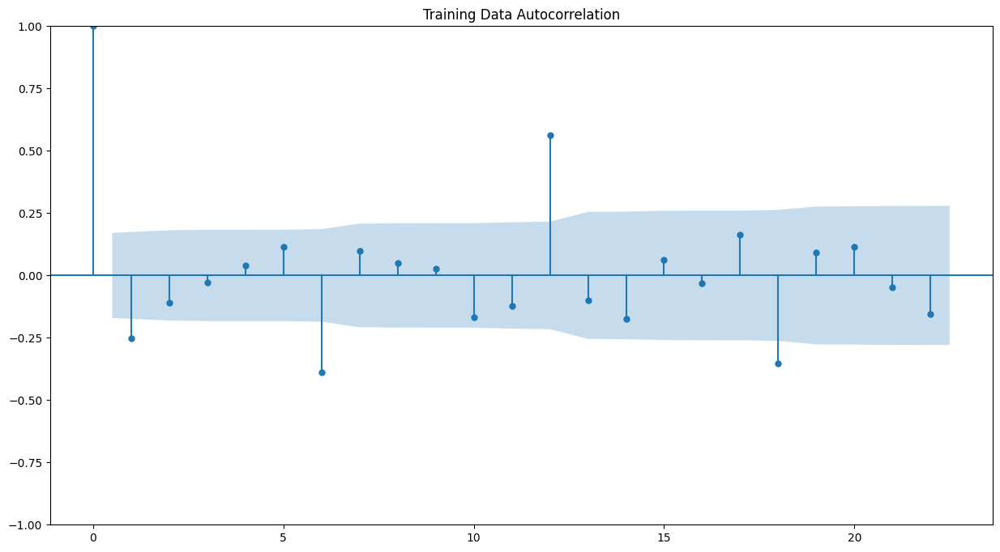

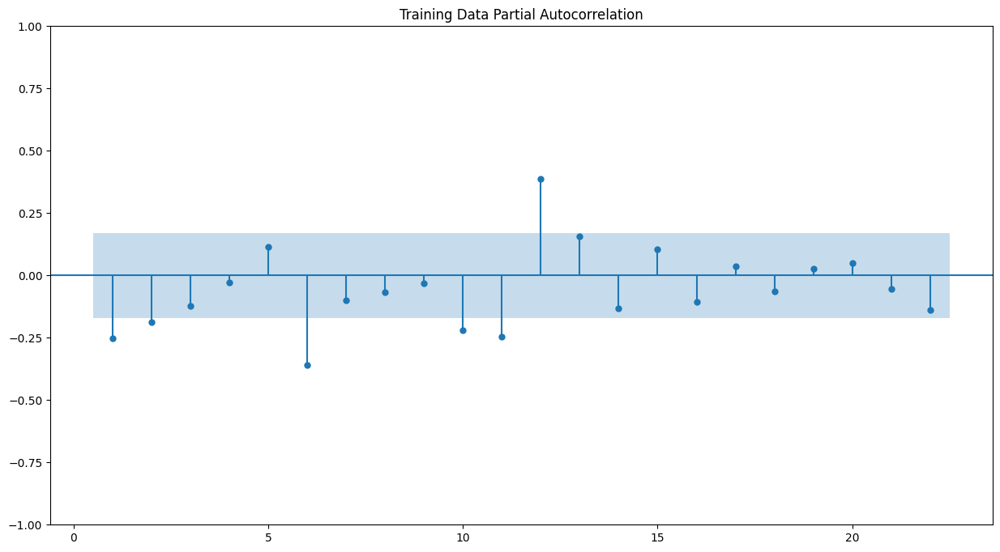

In [ ]:
plot_acf(rtrain.diff(),title='Training Data Autocorrelation',missing='drop')
plot_pacf(rtrain.diff().dropna(),title='Training Data Partial Autocorrelation',zero=False,method='ywmle')
plt.show()

Here, we have taken alpha=0.05.

The Auto-Regressive parameter in an ARIMA model is 'p' which comes from the significant lag before which the PACF plot cuts-off to 1. The Moving-Average parameter in an ARIMA model is 'q' which comes from the significant lag before the ACF plot cuts-off to 2. By looking at the above plots, we will take the value of p and q to be 1 and 2 respectively.

In [ ]:
RManual_ARIMA = ARIMA(rtrain['Shoe_Sales'], order=(2,1,1),freq='M')

results_manual_ARIMA = RManual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:             Shoe_Sales   No. Observations:                  132
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -743.216
Date:                Thu, 24 Aug 2023   AIC                           1494.431
Time:                        11:32:32   BIC                           1505.932
Sample:                    01-31-1980   HQIC                          1499.105
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4698      0.112      4.212      0.000       0.251       0.688
ar.L2          0.0234      0.111      0.211      0.833      -0.194       0.241
ma.L1         -0.8430      0.089     -9.497      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


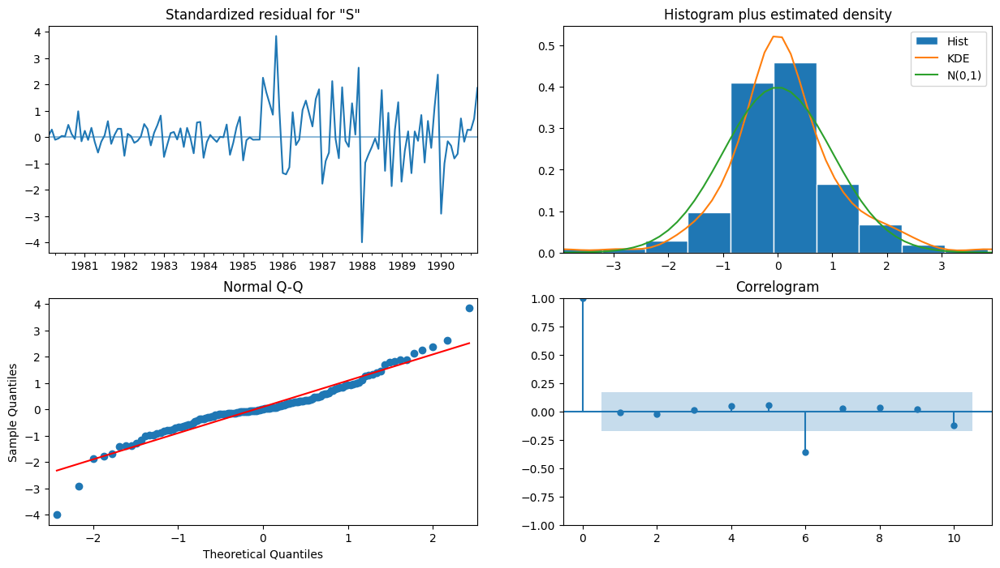

In [ ]:
#Rose Manual ARIMA Diagnostic plot
results_manual_ARIMA.plot_diagnostics();

In [ ]:
#Prediction and Evaluation of Manual ARIMA model on the Rose Test
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(rtest))
predicted_manual_ARIMA

1991-01-31    412.414004
1991-02-28    387.442058
1991-03-31    374.336528
1991-04-30    367.593920
1991-05-31    364.118902
1991-06-30    362.328217
1991-07-31    361.405460
1991-08-31    360.929955
1991-09-30    360.684923
1991-10-31    360.558655
1991-11-30    360.493589
1991-12-31    360.460059
1992-01-31    360.442781
1992-02-29    360.433878
1992-03-31    360.429290
1992-04-30    360.426925
1992-05-31    360.425707
1992-06-30    360.425079
1992-07-31    360.424756
1992-08-31    360.424589
1992-09-30    360.424503
1992-10-31    360.424459
1992-11-30    360.424436
1992-12-31    360.424424
1993-01-31    360.424418
1993-02-28    360.424415
1993-03-31    360.424414
1993-04-30    360.424413
1993-05-31    360.424412
1993-06-30    360.424412
1993-07-31    360.424412
1993-08-31    360.424412
1993-09-30    360.424412
1993-10-31    360.424412
1993-11-30    360.424412
1993-12-31    360.424412
1994-01-31    360.424412
1994-02-28    360.424412
1994-03-31    360.424412
1994-04-30    360.424412


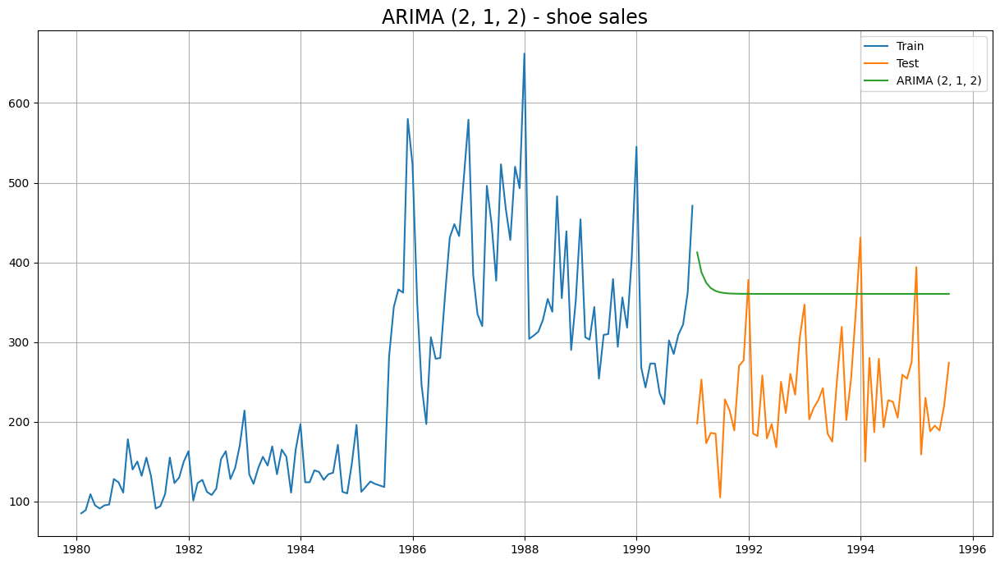

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')
plt.plot(predicted_manual_ARIMA,label='ARIMA (2, 1, 2)')


plt.legend(loc='best')
plt.grid()
plt.title('ARIMA (2, 1, 2) - shoe sales', fontsize=17);

In [ ]:
#Model Evaluation
rmse = mean_squared_error(rtest['Shoe_Sales'],predicted_manual_ARIMA,squared=False)
rmse

143.2535851409183

In [ ]:
RM_ARIMA= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,predicted_manual_ARIMA.values,squared=False)]},index=['ARIMA (2, 1, 2)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES, R_ARIMA, RM_ARIMA], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884
"ARIMA (2, 1, 3)",184.674595


Model 11 - Automated SARIMA Model

Build an Automated version of a SARIMA model for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC)



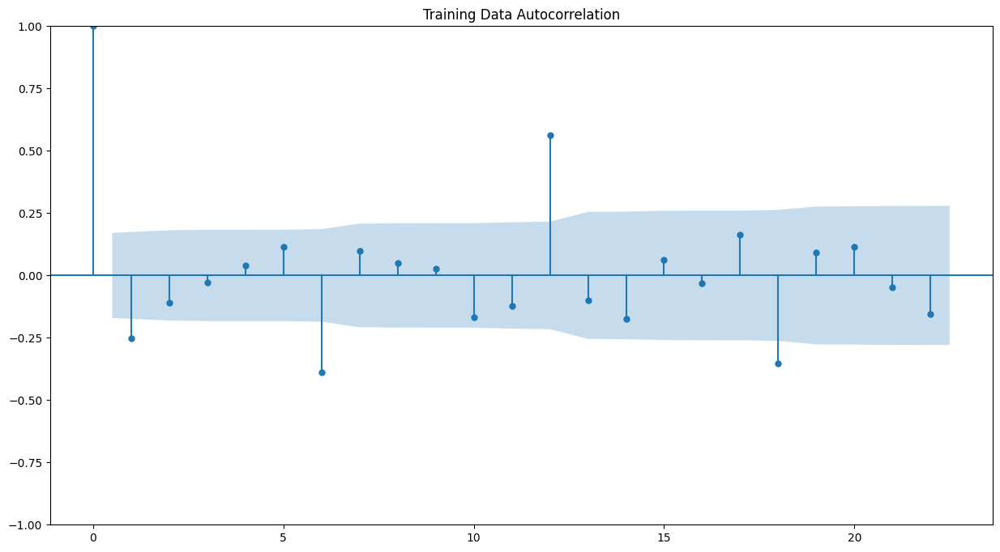

In [ ]:
plot_acf(rtrain.diff(),title='Training Data Autocorrelation',missing='drop');

In [ ]:
#We can see that there is a seasonality. Lets build the models now.
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [ ]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_model = sm.tsa.statespace.SARIMAX(rtrain['Shoe_Sales'].values,
                                            order=param, seasonal_order= param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1497.7788474019549
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1338.3663267373174


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1208.4142473347135


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AI

SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:4117.349732757214
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1327.3970510547892
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1312.586797868651


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1187.0843995008606


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:3724.0363947016185
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1201.06008315672


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1200.754517442117


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1188.0396305010788


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:4395.309830471082
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1071.7371393677752


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1073.5912665500066


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1074.38581059169


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AI

SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:2164.523046981678
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1476.016777738224
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1318.386120638771


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1185.4842426143903


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 3, 12) - AIC:3356.9006056888334
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1313.573827700332


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1287.7675669260686
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:1164.297458535821


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 3, 12) - AIC:2887.115777435414
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:1188.1632556767725


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:1188.2091371918907


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:1165.8757060515213


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 3, 12) - AIC:3029.761794895437
SARIMA(0, 1, 1)x(3, 0, 0, 12) - AIC:1063.8535916161609


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(3, 0, 1, 12) - AIC:1064.9884940320298


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(3, 0, 2, 12) - AIC:1065.4784220758788


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(3, 0, 3, 12) - AIC:1753.0020969021261
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:1463.545127212092


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1308.3453006660825


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:1177.0247487773704


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 3, 12) - AIC:3210.507444739577
SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1315.5733347402775


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1279.6069439950538


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:1156.1654292788921


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 3, 12) - AIC:3258.0100282469866
SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:1190.066349043642


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:1190.0436339224073


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:1157.7723133307177


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 0, 3, 12) - AIC:3486.2570712754755


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 0, 12) - AIC:1065.7996356592519


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 1, 12) - AIC:1066.868250077649


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 2, 12) - AIC:1067.2348348823473


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 3, 12) - AIC:1860.783881462176
SARIMA(0, 1, 3)x(0, 0, 0, 12) - AIC:1453.392674533767


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(0, 0, 1, 12) - AIC:1295.6926502825509


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(0, 0, 2, 12) - AIC:1165.1974640133174


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(0, 0, 3, 12) - AIC:3109.0470687611232
SARIMA(0, 1, 3)x(1, 0, 0, 12) - AIC:1312.3375717570539


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 1, 12) - AIC:1267.121111118235


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 2, 12) - AIC:1143.6879109009135


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 3, 12) - AIC:3214.7523102387827
SARIMA(0, 1, 3)x(2, 0, 0, 12) - AIC:1188.229900381422


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 1, 12) - AIC:1187.6169743791472


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 2, 12) - AIC:1145.4715645074875


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 3, 12) - AIC:3252.5433498122616


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 0, 12) - AIC:1064.814555944202


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 1, 12) - AIC:1066.0536870470137


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 2, 12) - AIC:1066.4459262177536


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(3, 0, 3, 12) - AIC:1672.688101744924
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:1491.1378318825623
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1331.405814409209


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:1197.560194010957


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AI

SARIMA(1, 1, 0)x(0, 0, 3, 12) - AIC:3505.824059685132
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1303.2203127538976
SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1296.8057138710715


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:1173.3867718162398


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 3, 12) - AIC:3722.642860327517
SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:1177.1656900229718


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:1175.6619338061828


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:1175.0815891384905


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 3, 12) - AIC:3574.8592131265546
SARIMA(1, 1, 0)x(3, 0, 0, 12) - AIC:1053.1265950753339


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 1, 12) - AIC:1053.920029158922


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 2, 12) - AIC:1053.180529383484


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 3, 12) - AIC:2637.7732372264127
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:1471.8669871774296


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1315.3261912470548
SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:1186.0030842411998


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 3, 12) - AIC:3114.83160357103
SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1305.195510169827


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1288.679501525873


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:1165.179255380758


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 3, 12) - AIC:3304.178498431899
SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:1179.1583649870581


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:1177.606913991893


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:1166.9242913617056


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 3, 12) - AIC:3191.1716404271615
SARIMA(1, 1, 1)x(3, 0, 0, 12) - AIC:1055.1252199394412


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 1, 12) - AIC:1055.812529312224


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 2, 12) - AIC:1055.0703093469835


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 3, 12) - AIC:1771.5102013666383
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:1463.4445549649004


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1306.7163356175636


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:1176.2946238349969


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 3, 12) - AIC:3714.7509409793306
SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1306.194694464738


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1280.3994898125343


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:1157.0825892924324


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 3, 12) - AIC:3242.76843629423
SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:1180.6823652107632


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:1179.6027991647832


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:1158.7941776853995


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 3, 12) - AIC:2824.004227747478
SARIMA(1, 1, 2)x(3, 0, 0, 12) - AIC:1056.9262386335558


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(3, 0, 1, 12) - AIC:1057.7183713047498


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(3, 0, 2, 12) - AIC:1057.0130361915667


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(3, 0, 3, 12) - AIC:2269.997095001494
SARIMA(1, 1, 3)x(0, 0, 0, 12) - AIC:1455.1227996391283


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 1, 12) - AIC:1297.990978430649


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 2, 12) - AIC:1167.2864076962553


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 3, 12) - AIC:3279.3200037561596
SARIMA(1, 1, 3)x(1, 0, 0, 12) - AIC:1304.0159932711879


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 1, 12) - AIC:1268.9081401645699


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 2, 12) - AIC:1145.236466458486


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 3, 12) - AIC:3261.880008191806
SARIMA(1, 1, 3)x(2, 0, 0, 12) - AIC:1179.8716548587993


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 1, 12) - AIC:1178.3362481908541


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 2, 12) - AIC:1147.007974131514


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 3, 12) - AIC:3296.5832797727485
SARIMA(1, 1, 3)x(3, 0, 0, 12) - AIC:1056.1814874380084


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(3, 0, 1, 12) - AIC:1056.4520957338787


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(3, 0, 2, 12) - AIC:1055.8086458308378


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(3, 0, 3, 12) - AIC:1710.2700067300157
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:1477.9194683056446
SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1331.935319374876


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:1199.1019589233922


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 3, 12) - AIC:4226.992678968706
SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1295.218164081891


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1288.6840148345934
SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:1175.3764824244183


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(1, 0, 3, 12) - AIC:4200.066821802958


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:1169.126967659817


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:1167.363977501314


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:1166.9191464405833


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 3, 12) - AIC:4235.907418804279
SARIMA(2, 1, 0)x(3, 0, 0, 12) - AIC:1045.0214623097866


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(3, 0, 1, 12) - AIC:1044.8866865007421


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(3, 0, 2, 12) - AIC:1044.2189447348637


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(3, 0, 3, 12) - AIC:1597.66409833922
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:1473.8515321187938


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1316.7129215405869


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:1185.5196690090577


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 3, 12) - AIC:3755.712625629997


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1293.3419959529435


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1289.296741061852


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:1166.1030148362


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 3, 12) - AIC:3536.8940365960843
SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:1168.6663425966826


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:1168.520870623319


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:1167.6766922685827


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 3, 12) - AIC:3470.1308537193477
SARIMA(2, 1, 1)x(3, 0, 0, 12) - AIC:1045.5602424877825


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 1, 12) - AIC:1046.717339625037


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 2, 12) - AIC:1046.2045146531925


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 3, 12) - AIC:2385.618391883163
SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:1464.190279382342


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1308.2038016389486


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:1176.4764240714499


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 3, 12) - AIC:4038.09684694811
SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1293.3977262855767


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 1, 12) - AIC:1279.6661104289064


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 2, 12) - AIC:1158.4910015379958


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 3, 12) - AIC:3236.0782854548356
SARIMA(2, 1, 2)x(2, 0, 0, 12) - AIC:1169.9627314264155


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 1, 12) - AIC:1170.0463662104241


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 2, 12) - AIC:1158.6303256861854


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 0, 3, 12) - AIC:2798.6808401232934


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 0, 12) - AIC:1046.722420584272


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 1, 12) - AIC:1048.0035077268813


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 2, 12) - AIC:1047.5868190992726


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 3, 12) - AIC:1610.9334331769398
SARIMA(2, 1, 3)x(0, 0, 0, 12) - AIC:1438.7608779850452


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(0, 0, 1, 12) - AIC:1299.4342699381473


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(0, 0, 2, 12) - AIC:1169.3674505614936


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(0, 0, 3, 12) - AIC:3639.574584715367
SARIMA(2, 1, 3)x(1, 0, 0, 12) - AIC:1295.0242843769645


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 1, 12) - AIC:1270.7701814934717


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 2, 12) - AIC:1147.209950354493


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 3, 12) - AIC:3617.766382322578
SARIMA(2, 1, 3)x(2, 0, 0, 12) - AIC:1171.3899150753728


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 1, 12) - AIC:1170.3347173728034


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 2, 12) - AIC:1148.986522667774


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 3, 12) - AIC:3651.0806753239212


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(3, 0, 0, 12) - AIC:1047.9074109896553


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(3, 0, 1, 12) - AIC:1048.4590828971996


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(3, 0, 2, 12) - AIC:1047.6854741735885


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(3, 0, 3, 12) - AIC:2085.1995604572726
SARIMA(3, 1, 0)x(0, 0, 0, 12) - AIC:1467.4747263045615


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(0, 0, 1, 12) - AIC:1330.5603607088897


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(0, 0, 2, 12) - AIC:1197.9633133926377


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(0, 0, 3, 12) - AIC:3469.1439417080023
SARIMA(3, 1, 0)x(1, 0, 0, 12) - AIC:1284.1847455580196


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(1, 0, 1, 12) - AIC:1280.0127999459949


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(1, 0, 2, 12) - AIC:1176.773970309519


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(1, 0, 3, 12) - AIC:3773.3926084588306


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 0, 12) - AIC:1159.801733879623


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 1, 12) - AIC:1159.0479223728908


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 2, 12) - AIC:1158.429443264508


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 3, 12) - AIC:2589.9013842100994
SARIMA(3, 1, 0)x(3, 0, 0, 12) - AIC:1036.067322457275


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(3, 0, 1, 12) - AIC:1036.54541678109


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(3, 0, 2, 12) - AIC:1035.7107027239526


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(3, 0, 3, 12) - AIC:2869.3963530649507
SARIMA(3, 1, 1)x(0, 0, 0, 12) - AIC:1465.39718115193


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 1, 12) - AIC:1318.518235790001


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 2, 12) - AIC:1189.5749954226285


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 3, 12) - AIC:3572.553255434111


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 0, 12) - AIC:1283.5864189524877


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 1, 12) - AIC:1279.4496974411693


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 2, 12) - AIC:1166.4107309013111


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(1, 0, 3, 12) - AIC:3538.8940365817134


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 0, 12) - AIC:1159.4465234940885


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 1, 12) - AIC:1158.4875588761815


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 2, 12) - AIC:1157.8123209699565


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 3, 12) - AIC:3551.7054009639937
SARIMA(3, 1, 1)x(3, 0, 0, 12) - AIC:1035.9071127809511


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 1, 12) - AIC:1036.9987554791232


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 2, 12) - AIC:1035.9098739885808


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(3, 0, 3, 12) - AIC:1731.7862081094393


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 0, 12) - AIC:1465.6255973322477


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 1, 12) - AIC:1308.8606279014605


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 2, 12) - AIC:1177.4468779225801


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(0, 0, 3, 12) - AIC:5435.856672925164


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 0, 12) - AIC:1284.5907586289


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 1, 12) - AIC:1281.4454806891172


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 2, 12) - AIC:1157.5249047361497


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 3, 12) - AIC:5417.806385310694
SARIMA(3, 1, 2)x(2, 0, 0, 12) - AIC:1161.4267100752497


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(2, 0, 1, 12) - AIC:1159.8968427712605


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(2, 0, 2, 12) - AIC:1159.3184751073343


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(2, 0, 3, 12) - AIC:5151.899006063508


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 0, 12) - AIC:1037.7828894575573


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 1, 12) - AIC:1038.7860593504201


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 2, 12) - AIC:1037.6247412624575


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(3, 0, 3, 12) - AIC:1572.7718823391447


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 0, 12) - AIC:1438.017153339648


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 1, 12) - AIC:1297.015925463816


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 2, 12) - AIC:1168.6914085004234


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 3, 12) - AIC:3669.932243926049
SARIMA(3, 1, 3)x(1, 0, 0, 12) - AIC:1286.6826494632414


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 1, 12) - AIC:1272.740910830195


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 2, 12) - AIC:1149.1427502979404


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 3, 12) - AIC:3648.737732815622


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 0, 12) - AIC:1163.288132347409


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 1, 12) - AIC:1161.721749306018


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 2, 12) - AIC:1150.918908984192


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(2, 0, 3, 12) - AIC:2565.3148278996937


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 0, 12) - AIC:1039.599419566248


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 1, 12) - AIC:1040.2844210796238


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 2, 12) - AIC:1039.2195165950293


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(3, 0, 3, 12) - AIC:1806.0110308570347


<ipython-input-123-81564918d2cf>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


In [ ]:
SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
206,"(3, 1, 0)","(3, 0, 2, 12)",1035.710703
220,"(3, 1, 1)","(3, 0, 0, 12)",1035.907113
222,"(3, 1, 1)","(3, 0, 2, 12)",1035.909874
204,"(3, 1, 0)","(3, 0, 0, 12)",1036.067322
205,"(3, 1, 0)","(3, 0, 1, 12)",1036.545417


In [ ]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(rtrain['Shoe_Sales'],
                                order=(3, 1, 0),
                                seasonal_order=(3, 0, 2, 12),
                                enforce_stationarity=False,)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


                                        SARIMAX Results                                        
Dep. Variable:                              Shoe_Sales   No. Observations:                  132
Model:             SARIMAX(3, 1, 0)x(3, 0, [1, 2], 12)   Log Likelihood                -508.855
Date:                                 Thu, 24 Aug 2023   AIC                           1035.711
Time:                                         11:41:14   BIC                           1058.407
Sample:                                     01-31-1980   HQIC                          1044.871
                                          - 12-31-1990                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3834      0.093     -4.118      0.000      -0.566      -0

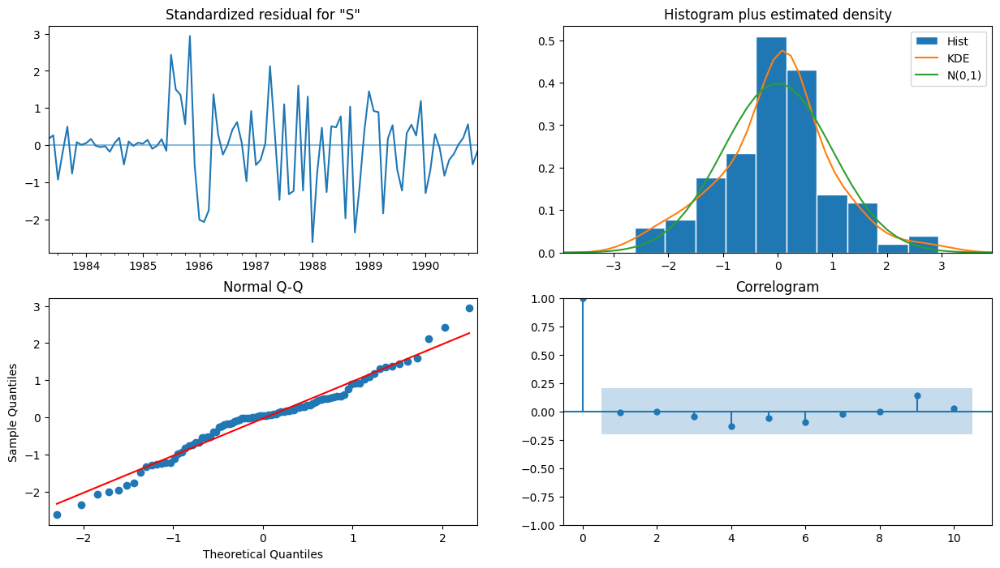

In [ ]:
results_auto_SARIMA.plot_diagnostics()
plt.show()

In [ ]:
#Prediction on Test Data (Auto SARIMA Model)
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(rtest))
predicted_auto_SARIMA1= results_auto_SARIMA.get_prediction(start=pd.to_datetime('1991-01-01'), dynamic=False)
predicted_auto_SARIMA1

In [ ]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Shoe_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,224.061828,57.748618,110.876617,337.247039
1991-02-28,199.703359,67.844253,66.731066,332.675652
1991-03-31,210.663976,80.468341,52.948925,368.379027
1991-04-30,238.129678,88.609817,64.457629,411.801727
1991-05-31,219.861015,97.493513,28.777241,410.944789


In [ ]:
rmse = mean_squared_error(rtest['Shoe_Sales'],predicted_auto_SARIMA.predicted_mean,squared=False)
rmse

73.02368906118444

In [ ]:
R_SARIMA= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,predicted_auto_SARIMA.predicted_mean,squared=False)]},index=['SARIMA (2, 1, 1) (1, 0, 3, 12)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES, R_ARIMA, RM_ARIMA, R_SARIMA], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884
"ARIMA (2, 1, 3)",184.674595


/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 9 (	) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


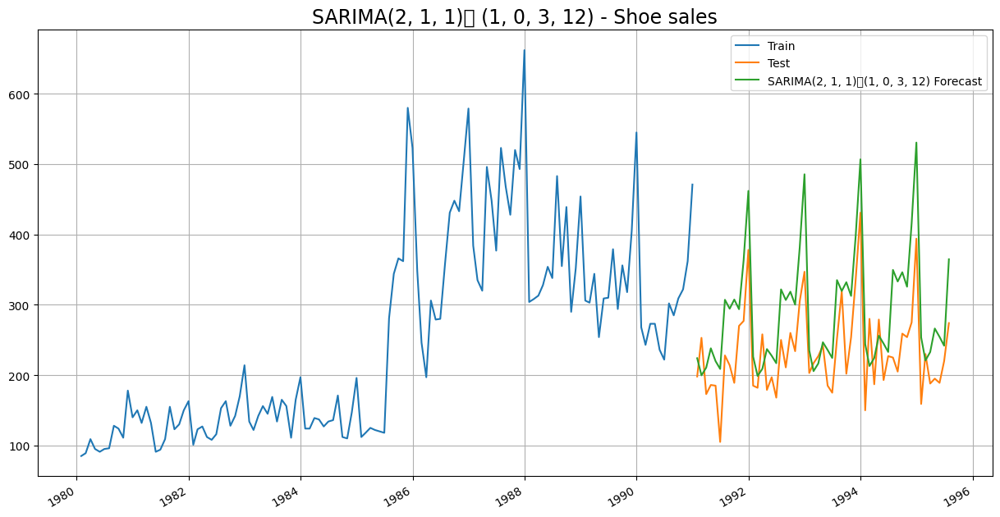

In [ ]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(rtrain, label='Train')
plt.plot(rtest, label='Test')
predicted_auto_SARIMA.predicted_mean.plot(label='SARIMA(2, 1, 1)	(1, 0, 3, 12) Forecast')


plt.legend(loc='best')
plt.grid()
plt.title('SARIMA(2, 1, 1)	 (1, 0, 3, 12) - Shoe sales', fontsize=17);

Model 12 - Manual SARIMA Model

Build a version of the SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots - Seasonality at 12

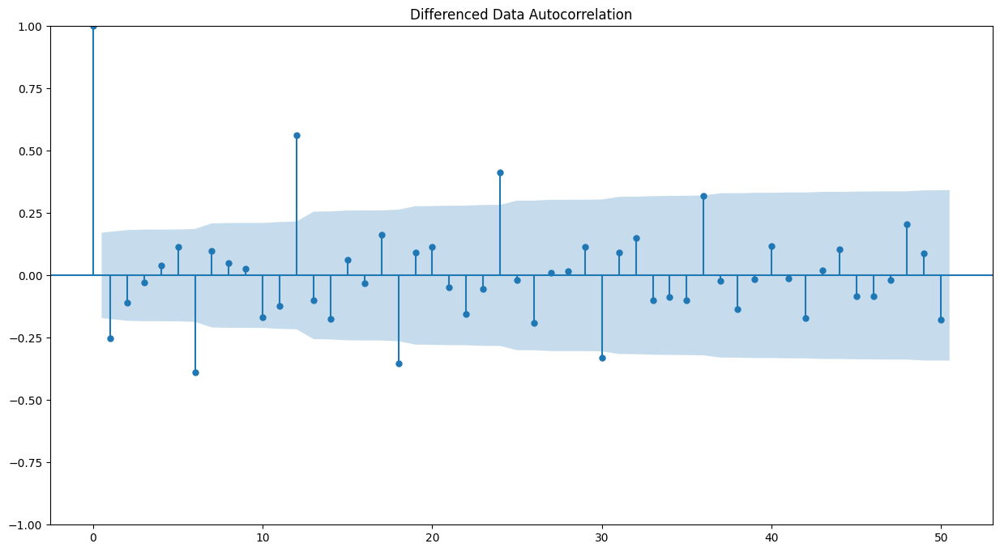

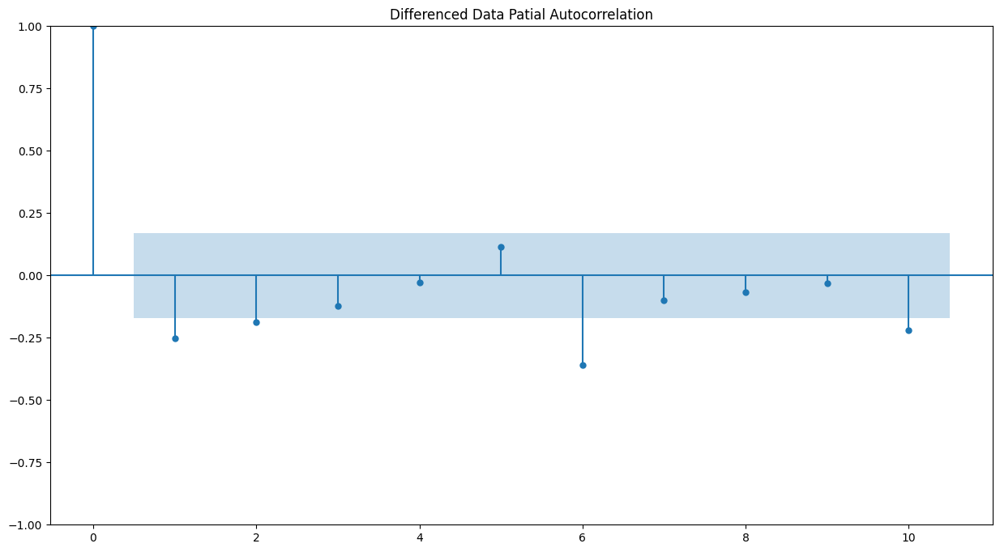

In [ ]:
#Let us look at the ACF and the PACF plots once more.
plot_acf(rtrain['Shoe_Sales'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(rtrain['Shoe_Sales'].diff().dropna(),lags=10,title='Differenced Data Patial Autocorrelation')
plt.show();

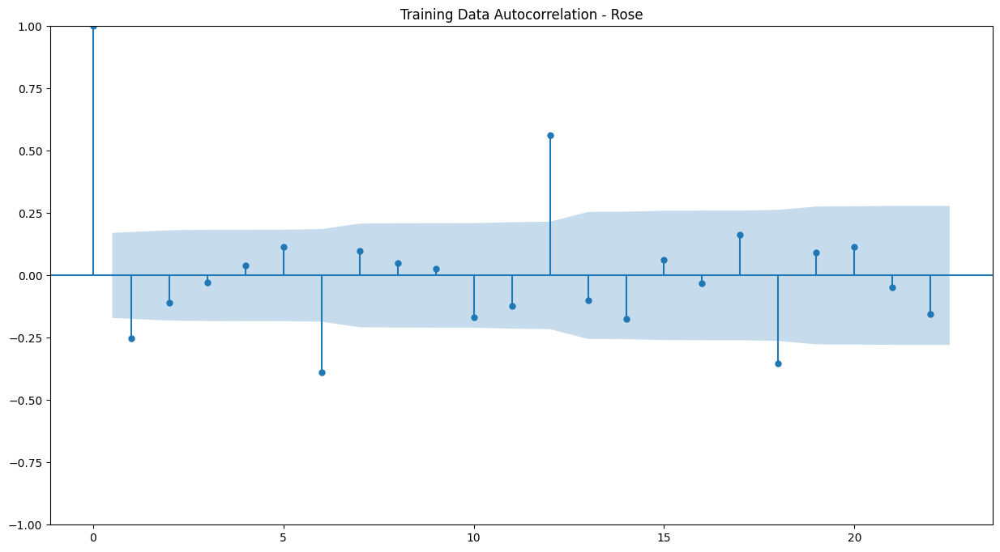

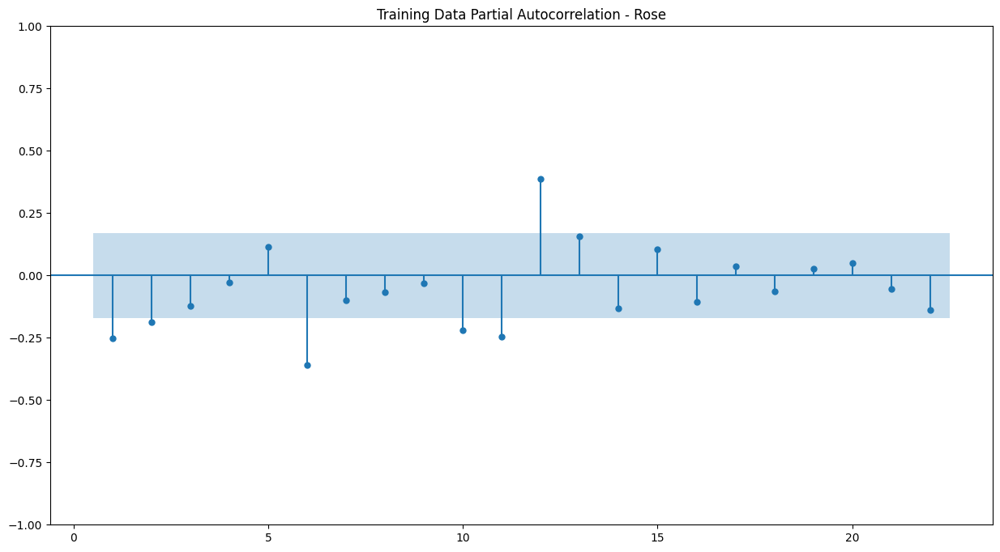

In [ ]:
plot_acf(rtrain.diff(),title='Training Data Autocorrelation - Rose',missing='drop')
plot_pacf(rtrain.diff().dropna(),title='Training Data Partial Autocorrelation - Rose',zero=False,method='ywmle');
plt.show();

In [ ]:
manual_SARIMA_rose = sm.tsa.statespace.SARIMAX(rtrain['Shoe_Sales'].values,
                                order=(2, 1, 1),
                                seasonal_order=(2, 1, 2, 12),
                                enforce_stationarity=False)
results_manual_SARIMA_rose = manual_SARIMA_rose.fit(maxiter=1000)
print(results_manual_SARIMA_rose.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  132
Model:             SARIMAX(2, 1, 1)x(2, 1, [1, 2], 12)   Log Likelihood                -514.086
Date:                                 Thu, 24 Aug 2023   AIC                           1044.172
Time:                                         11:41:22   BIC                           1064.433
Sample:                                              0   HQIC                          1052.353
                                                 - 132                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3252      0.109    -12.208      0.000      -1.538      -1

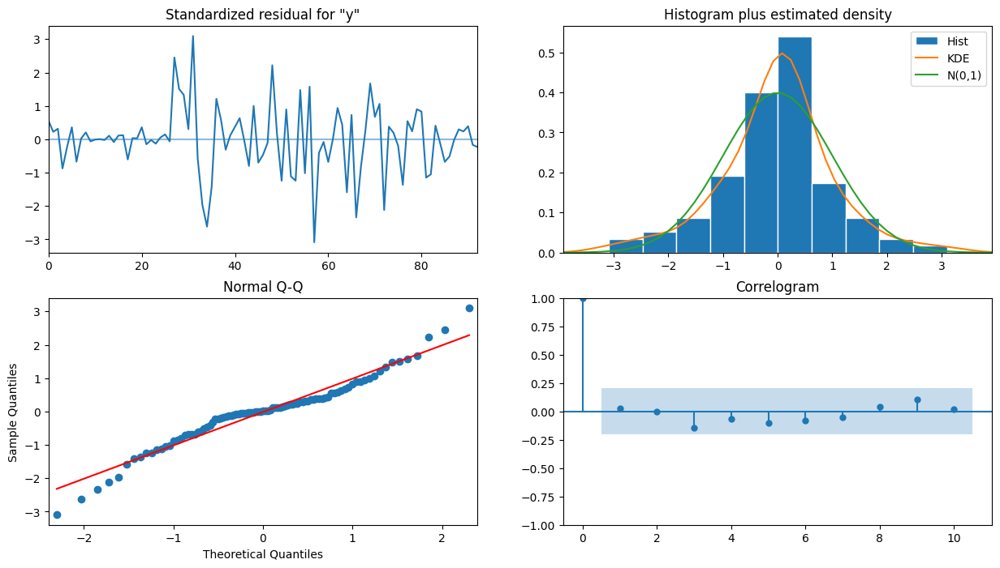

In [ ]:
results_manual_SARIMA_rose.plot_diagnostics();

In [ ]:
predicted_manual_SARIMA_rose = results_manual_SARIMA_rose.get_forecast(steps=len(rtest))

In [ ]:
rmse = mean_squared_error(rtest['Shoe_Sales'],predicted_manual_SARIMA_rose.predicted_mean,squared=False)
rmse

47.8730376133064

In [ ]:
SARIMA_test=rtest.copy()
SARIMA_test['Shoe_Sales_manual_forecasted'] = predicted_manual_SARIMA_rose.predicted_mean
SARIMA_test.head()

,Shoe_Sales,Shoe_Sales_manual_forecasted
TimeStamp,,
1991-01-31,198,228.020964
1991-02-28,253,208.827095
1991-03-31,173,221.323207
1991-04-30,186,240.569992
1991-05-31,185,224.064002


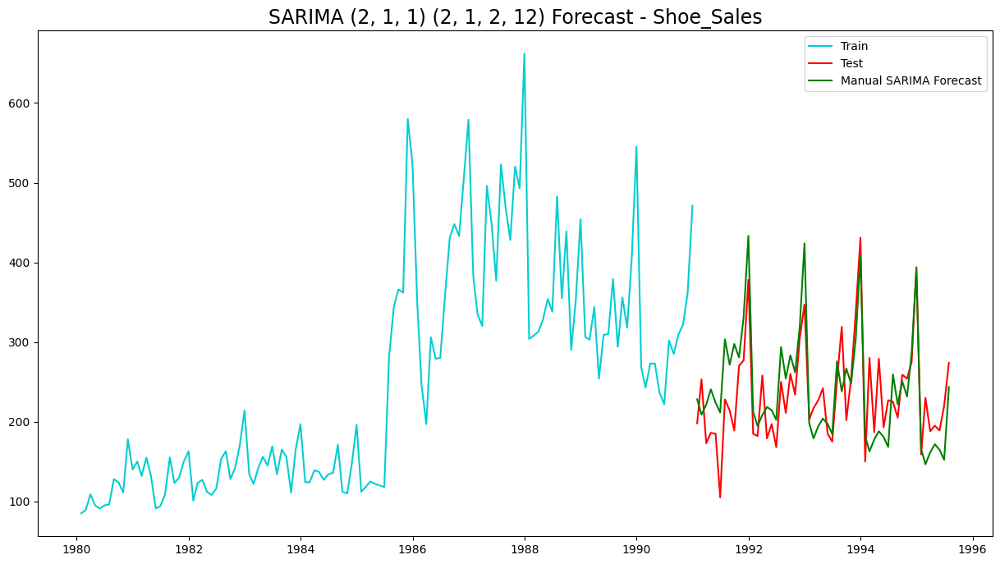

In [ ]:
plt.plot(rtrain['Shoe_Sales'], label='Train', color = 'darkturquoise')
plt.plot(rtest['Shoe_Sales'], label='Test', color = 'red')

plt.plot(SARIMA_test['Shoe_Sales_manual_forecasted'], color='green', label='Manual SARIMA Forecast')
plt.title('SARIMA (2, 1, 1) (2, 1, 2, 12) Forecast - Shoe_Sales', fontsize=17)
plt.legend(loc='best')

In [ ]:
R_manual_SARIMA= pd.DataFrame({'Test RMSE Shoe sales': [mean_squared_error(rtest.values,predicted_manual_SARIMA_rose.predicted_mean,squared=False)]},index=['SARIMA (2, 1, 1) (2, 1, 2, 12)'])
Result = pd.concat([Results, Results_21,resultsDf_31, resultsDf_41,R_SES, R_DES, R_TES, R_ARIMA, RM_ARIMA, R_SARIMA, R_manual_SARIMA], axis=0)
Result

,Test RMSE Shoe sales
Regression On Time,266.276472
Naive Model,245.121306
Simple Average Model,63.984570
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
9point Trailing MovingAverage,67.723648
Simple Exponential Smoothing,196.404941
Double Exponential Smoothing,266.568429
Exponential Smoothing (Additive Seasonality),109.016884
"ARIMA (2, 1, 3)",184.674595


Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

In [ ]:
Result.sort_values(by=['Test RMSE Shoe sales'])

,Test RMSE Shoe sales
"SARIMA (2, 1, 1) (2, 1, 2, 12)",47.873038
4point Trailing MovingAverage,57.872686
6point Trailing MovingAverage,63.456893
Simple Average Model,63.984570
9point Trailing MovingAverage,67.723648
"SARIMA (2, 1, 1) (1, 0, 3, 12)",73.023689
Exponential Smoothing (Additive Seasonality),109.016884
"ARIMA (2, 1, 2)",143.253585
"ARIMA (2, 1, 3)",184.674595
Simple Exponential Smoothing,196.404941


# Best Model for SHOE SALES with Least RMSE - MANUAL SARIMA

In [ ]:
ES_Ad = sm.tsa.statespace.SARIMAX(rtrain['Shoe_Sales'].values,
                                order=(2, 1, 2),
                                seasonal_order=(2, 1, 3, 12),
                                enforce_stationarity=False)
ES_Ad_fit = manual_SARIMA_rose.fit(maxiter=1000)

print('')
print('Holt Winters model Exponential Smoothing Estimated Parameters')
print('')
print(ES_Ad_fit.params)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'



Holt Winters model Exponential Smoothing Estimated Parameters

[-1.32523777e+00 -3.95818676e-01  9.99873162e-01 -1.43146119e-01
 -6.51839275e-02 -4.03448655e-01 -1.68813997e-01  3.49433456e+03]


In [ ]:
# Forecasting using this model for the duration of the test set
TES_predict =  ES_Ad_fit.forecast(steps=12)
TES_predict
prediction_1 = TES_predict


In [ ]:
df3 = pd.DataFrame(TES_predict)

In [ ]:
df3.to_csv('rose_forecast_tes.csv')

In [ ]:
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(ES_Ad_fit.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(ES_Ad_fit.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
0,122.425730,228.020964,333.616198
1,103.231861,208.827095,314.422329
2,115.727973,221.323207,326.918441
3,134.974758,240.569992,346.165226
4,118.468768,224.064002,329.659236


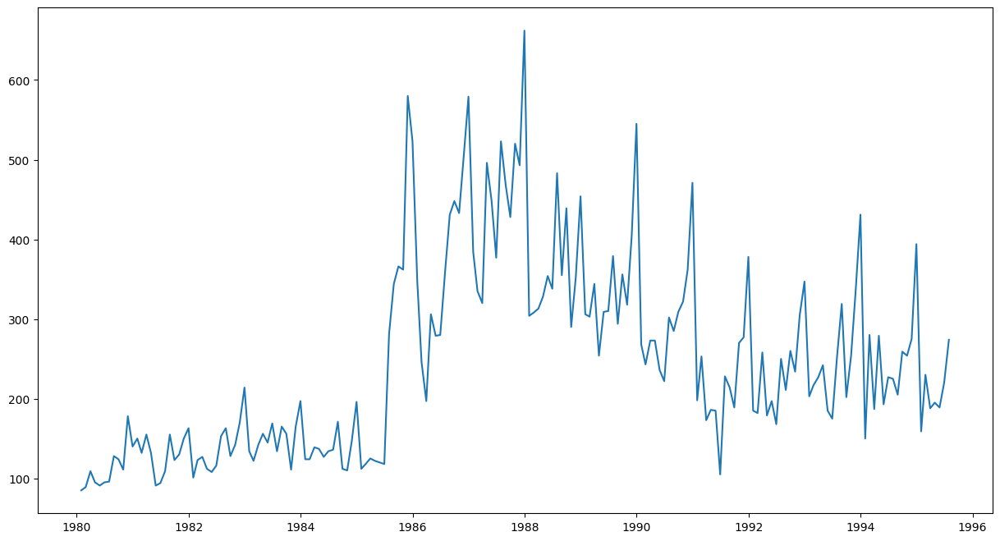

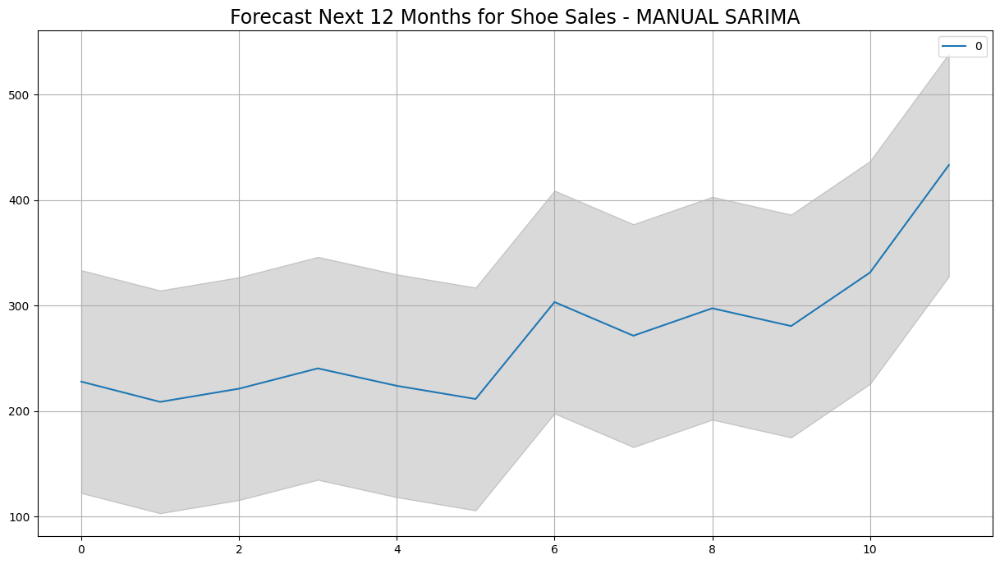

In [ ]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(df1['Shoe_Sales'], label='Original Data - Shoe_Sales')

ax =df3.plot(label='Forecast next 12 months - Shoe_Sales')
ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Shoe Sales - MANUAL SARIMA', fontsize=17);

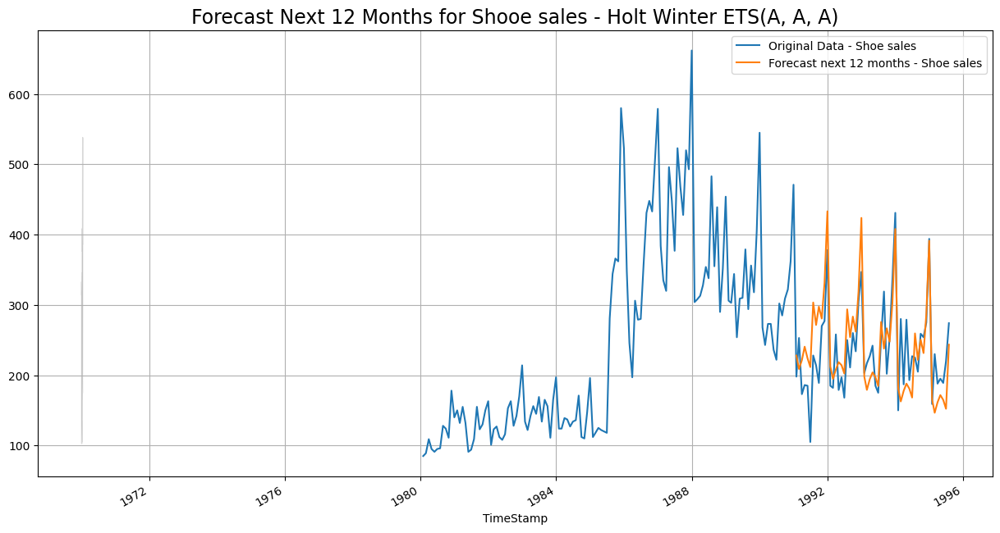

In [ ]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(df1['Shoe_Sales'], label='Original Data - Shoe sales')

ax = SARIMA_test['Shoe_Sales_manual_forecasted'].plot(label='Forecast next 12 months - Shoe sales')
ax.fill_between(pred_1_df.index,pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Shooe sales - Holt Winter ETS(A, A, A)', fontsize=17);

## Dataset - Soft Drinks

In [ ]:
  from google.colab import files
  uploaded = files.upload()

Saving SoftDrink.csv to SoftDrink.csv


In [ ]:
df2=pd.read_csv("SoftDrink.csv")

In [ ]:
df2.head()

,YearMonth,SoftDrinkProduction
0,1980-01,1954
1,1980-02,2302
2,1980-03,3054
3,1980-04,2414
4,1980-05,2226


In [ ]:
df2.tail()

,YearMonth,SoftDrinkProduction
182,1995-03,4067
183,1995-04,4022
184,1995-05,3937
185,1995-06,4365
186,1995-07,4290


# Exploartory data analysis

In [ ]:
df2.dtypes

YearMonth              object
SoftDrinkProduction     int64
dtype: object

###Treating the dataset for ease:
Since we have monthly data for years starting from 1980 to 1995 combined, let us draw a date range and incoporate as "TimeStamp" and drop "YearMonth" for ease


In [ ]:
date=pd.date_range(start='01/01/1980', end='08/01/1995', freq='M')
date

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='M')

In [ ]:
df2['TimeStamp']=pd.DataFrame(date, columns=['Month'])
df2.head()

,YearMonth,SoftDrinkProduction,TimeStamp
0,1980-01,1954,1980-01-31
1,1980-02,2302,1980-02-29
2,1980-03,3054,1980-03-31
3,1980-04,2414,1980-04-30
4,1980-05,2226,1980-05-31


In [ ]:
df2['TimeStamp']=pd.to_datetime(df2['TimeStamp'])
df2=df2.set_index('TimeStamp')
df2.drop(['YearMonth'], axis=1, inplace=True)
df2.head()

,SoftDrinkProduction
TimeStamp,
1980-01-31,1954
1980-02-29,2302
1980-03-31,3054
1980-04-30,2414
1980-05-31,2226


### Basic details and Descriptive Statistics of Softdrinks


In [ ]:
print("The number of rows: ",df2.shape[0], "\n""The number of columns: ",df2.shape[1])

The number of rows:  187 
The number of columns:  1


In [ ]:
np.round(df2.describe(),2).T

,count,mean,std,min,25%,50%,75%,max
SoftDrinkProduction,187.0,3262.61,728.36,1954.0,2748.0,3134.0,3741.0,5725.0


Checking for missing values and Interpolation

In [ ]:
df2.isna().sum()

SoftDrinkProduction    0
dtype: int64

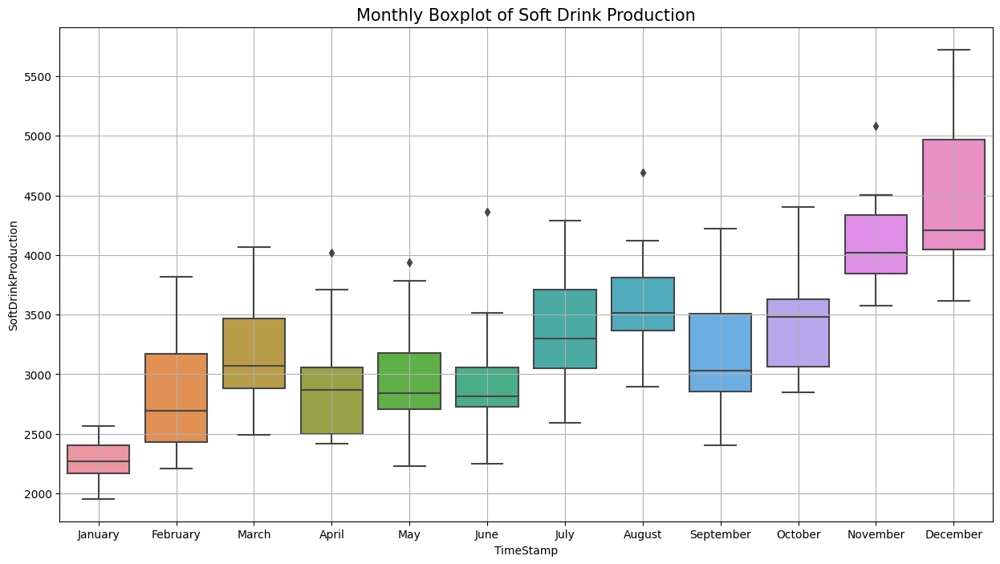

In [ ]:
rcParams['figure.figsize']=15,8
sns.boxplot(x = df2.index.month_name(), y = df2['SoftDrinkProduction']);
plt.grid();
plt.title('Monthly Boxplot of Soft Drink Production', fontsize=15);

In [ ]:
monthly_sales_across_years_SoftDrink = pd.pivot_table(df2, values = 'SoftDrinkProduction', columns = df2.index.month, index = df2.index.year)
monthly_sales_across_years_SoftDrink

TimeStamp,1,2,3,4,5,6,7,8,9,10,11,12
TimeStamp,,,,,,,,,,,,
1980,1954.0,2302.0,3054.0,2414.0,2226.0,2725.0,2589.0,3470.0,2400.0,3180.0,4009.0,3924.0
1981,2072.0,2434.0,2956.0,2828.0,2687.0,2629.0,3150.0,4119.0,3030.0,3055.0,3821.0,4001.0
1982,2529.0,2472.0,3134.0,2789.0,2758.0,2993.0,3282.0,3437.0,2804.0,3076.0,3782.0,3889.0
1983,2271.0,2452.0,3084.0,2522.0,2769.0,3438.0,2839.0,3746.0,2632.0,2851.0,3871.0,3618.0
1984,2389.0,2344.0,2678.0,2492.0,2858.0,2246.0,2800.0,3869.0,3007.0,3023.0,3907.0,4209.0
1985,2353.0,2570.0,2903.0,2910.0,3782.0,2759.0,2931.0,3641.0,2794.0,3070.0,3576.0,4106.0
1986,2452.0,2206.0,2488.0,2416.0,2534.0,2521.0,3093.0,3903.0,2907.0,3025.0,3812.0,4209.0
1987,2138.0,2419.0,2622.0,2912.0,2708.0,2798.0,3254.0,2895.0,3263.0,3736.0,4077.0,4097.0
1988,2175.0,3138.0,2823.0,2498.0,2822.0,2738.0,4137.0,3515.0,3785.0,3632.0,4504.0,4451.0


Text(0.5, 1.0, 'Monthly sales over years of Soft Drink Production')

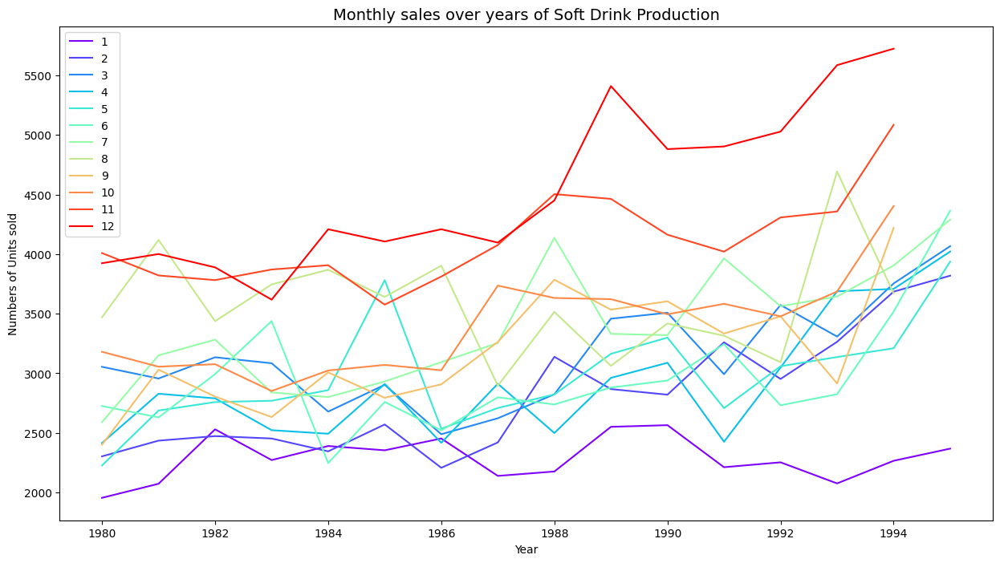

In [ ]:
plt.figure.figsize=(15,8)
monthly_sales_across_years_SoftDrink.plot(colormap='rainbow')
plt.legend(loc='best')
plt.ylabel('Numbers of Units sold')
plt.xlabel('Year')
plt.title('Monthly sales over years of Soft Drink Production', fontsize=14)

## Visualization of Time Series in Soft Drink

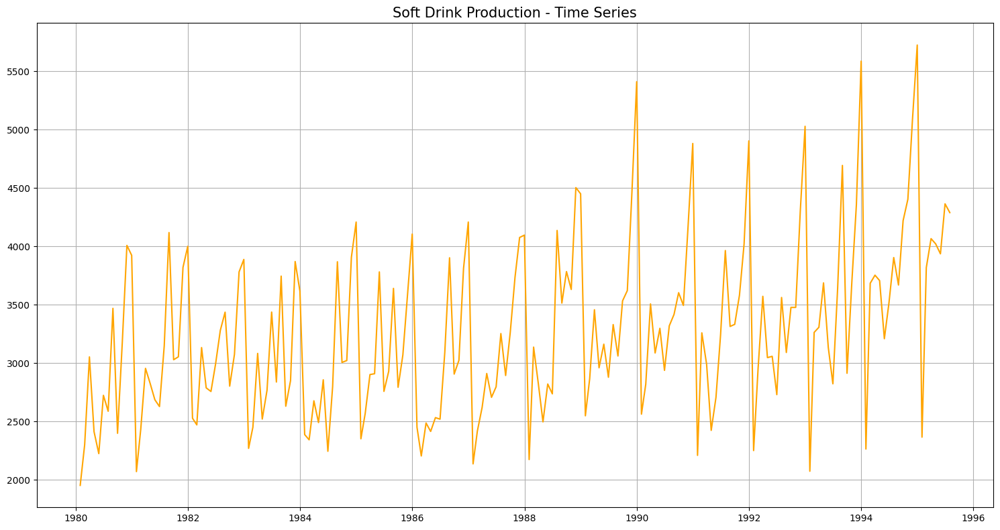

In [ ]:
rcParams['figure.figsize']=15,8
plt.grid();
plt.title('Soft Drink Production - Time Series', fontsize=15);
plt.plot(df2, color='orange')
plt.tight_layout();

### Decompose the Time Series and plot the different components

Additive Decomposition of Soft Drink

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

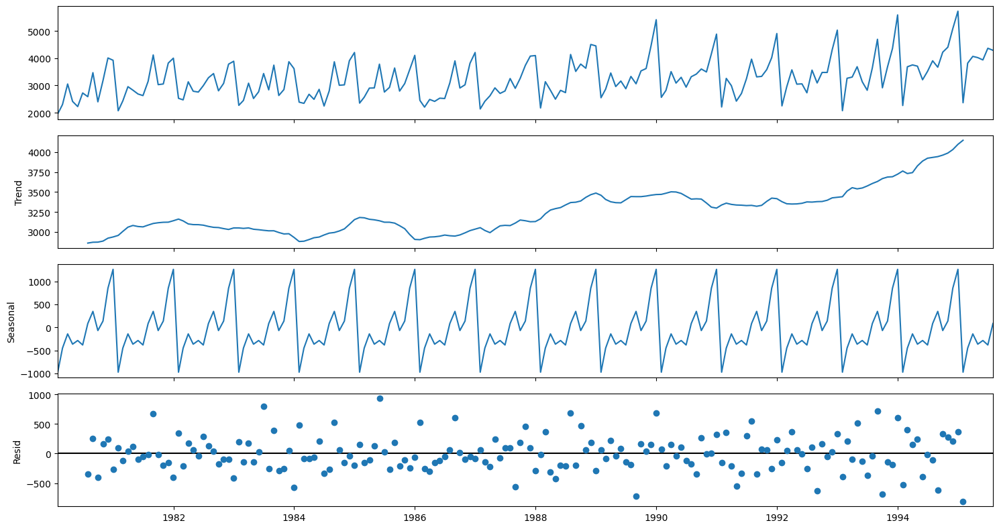

In [ ]:
df2_decompose = seasonal_decompose(df2, model='additive', period=12) #since here we are considering yearly seasonality and trend having monthly freq
df2_decompose.plot()
plt.tight_layout()
plt.show();

In [ ]:
S_Trend=df2_decompose.trend
S_Seasonality=df2_decompose.seasonal
S_Residual=df2_decompose.resid

print ('S_Trend', S_Trend.head(10), '\n')
print ('S_Seasonality', S_Seasonality.head(10), '\n')
print ('S_Residual', S_Residual.head(10), '\n')

S_Trend TimeStamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2858.833333
1980-08-31    2869.250000
1980-09-30    2870.666667
1980-10-31    2883.833333
Name: trend, dtype: float64 

S_Seasonality TimeStamp
1980-01-31   -974.619692
1980-02-29   -451.246677
1980-03-31   -143.118700
1980-04-30   -366.181200
1980-05-31   -286.815129
1980-06-30   -383.594891
1980-07-31     82.191419
1980-08-31    346.363641
1980-09-30    -69.997470
1980-10-31    136.721974
Name: seasonal, dtype: float64 

S_Residual TimeStamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31   -352.024752
1980-08-31    254.386359
1980-09-30   -400.669196
1980-10-31    159.444692
Name: resid, dtype: float64 



In [ ]:
S_Trend.head(12).to_csv('SoftDrink_trend.csv')
S_Seasonality.head(12).to_csv('SoftDrink_season.csv')
S_Residual.head(12).to_csv('SoftDrink_resid.csv')

Text(0.5, 1.0, 'Residual Plot of Additive Decomposition for Soft Drink Production Time Series')

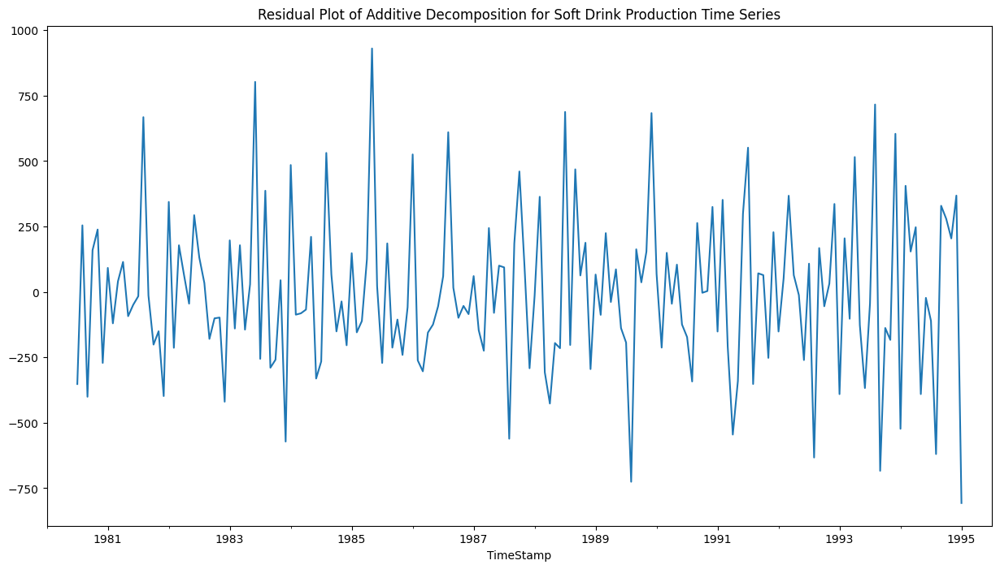

In [ ]:
#Let us know view S_Residual plot
S_Residual.plot()
plt.title('Residual Plot of Additive Decomposition for Soft Drink Production Time Series')

###  Multiplicative Decomposition of Soft Drink Production

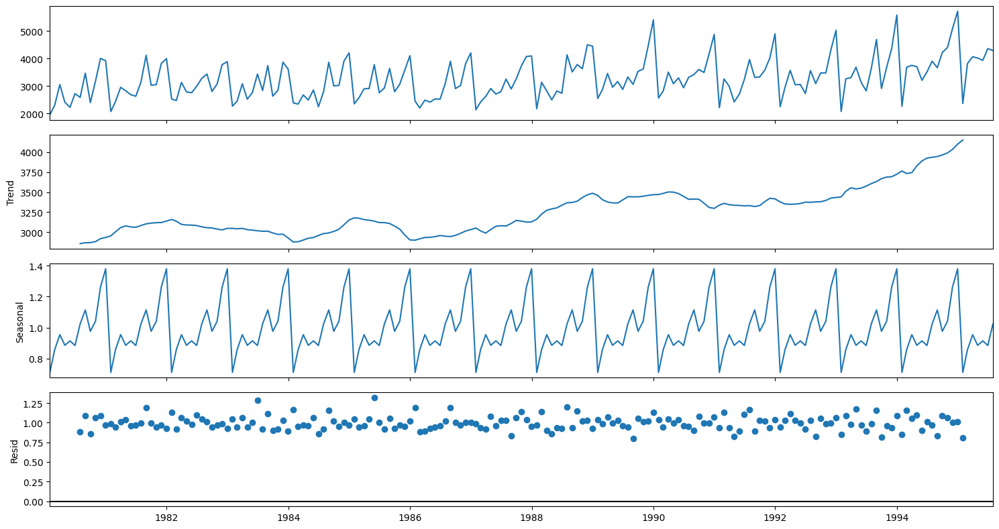

In [ ]:
df2_Mdecompose = seasonal_decompose(df2, model='multiplicative', period=12)
df2_Mdecompose.plot()
plt.tight_layout()
plt.show();

In [ ]:
SM_Trend=df2_Mdecompose.trend
SM_Seasonality=df2_Mdecompose.seasonal
SM_Residual=df2_Mdecompose.resid

print ('SM_Trend', SM_Trend.head(10), '\n')
print ('SM_Seasonality', SM_Seasonality.head(10), '\n')
print ('SM_Residual', SM_Residual.head(10), '\n')

SM_Trend TimeStamp
1980-01-31            NaN
1980-02-29            NaN
1980-03-31            NaN
1980-04-30            NaN
1980-05-31            NaN
1980-06-30            NaN
1980-07-31    2858.833333
1980-08-31    2869.250000
1980-09-30    2870.666667
1980-10-31    2883.833333
Name: trend, dtype: float64 

SM_Seasonality TimeStamp
1980-01-31    0.709526
1980-02-29    0.856420
1980-03-31    0.953935
1980-04-30    0.885217
1980-05-31    0.913735
1980-06-30    0.883890
1980-07-31    1.023936
1980-08-31    1.114195
1980-09-30    0.975955
1980-10-31    1.040944
Name: seasonal, dtype: float64 

SM_Residual TimeStamp
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    0.884444
1980-08-31    1.085425
1980-09-30    0.856641
1980-10-31    1.059326
Name: resid, dtype: float64 



In [ ]:
SM_Trend.head(12).to_csv('SoftDrink_mtrend.csv')
SM_Seasonality.head(12).to_csv('SoftDrink_mseason.csv')
SM_Residual.head(12).to_csv('SoftDrink_mresid.csv')

Text(0.5, 1.0, 'Residual Plot of Multiplicative Decomposition for Soft Drink Production Time Series')

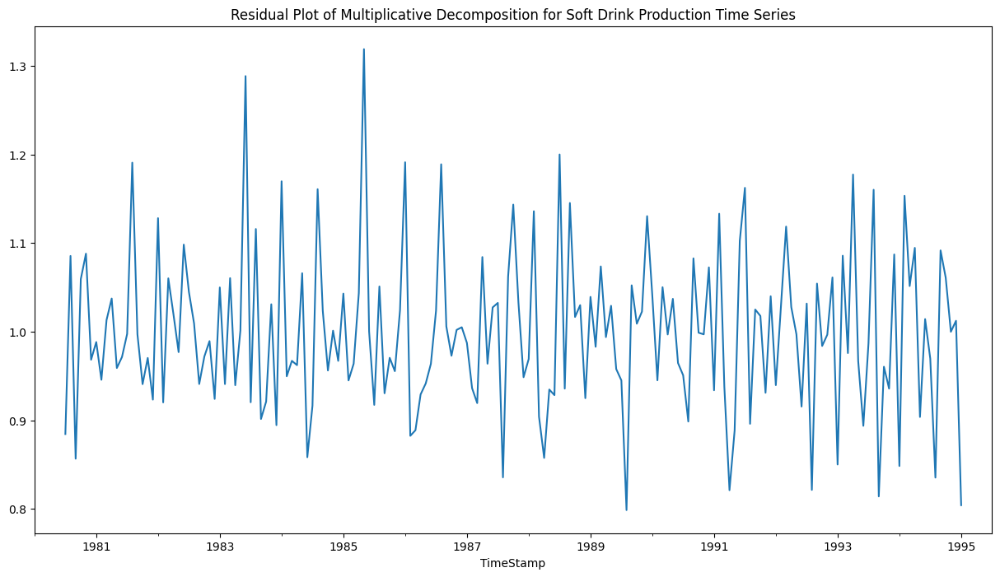

In [ ]:
#Let us know view R_Residual plot for Multiplicative Decomposition
SM_Residual.plot()
plt.title('Residual Plot of Multiplicative Decomposition for Soft Drink Production Time Series')

### Split the data into training and test. The test data should start in 1991.

In [ ]:
strain=df2[df2.index<'1991']
stest=df2[df2.index>='1991']

In [ ]:
print(strain.shape)
print(stest.shape)

(132, 1)
(55, 1)


In [ ]:
## This is to display multiple data frames from one cell
from IPython.display import display

In [ ]:
print('First few rows of Training Data')
display(strain.head())
print('Last few rows of Training Data')
display(strain.tail())
print('First few rows of Test Data')
display(stest.head())
print('Last few rows of Test Data')
display(stest.tail())

First few rows of Training Data


,SoftDrinkProduction
TimeStamp,
1980-01-31,1954
1980-02-29,2302
1980-03-31,3054
1980-04-30,2414
1980-05-31,2226


Last few rows of Training Data


,SoftDrinkProduction
TimeStamp,
1990-08-31,3418
1990-09-30,3604
1990-10-31,3495
1990-11-30,4163
1990-12-31,4882


First few rows of Test Data


,SoftDrinkProduction
TimeStamp,
1991-01-31,2211
1991-02-28,3260
1991-03-31,2992
1991-04-30,2425
1991-05-31,2707


Last few rows of Test Data


,SoftDrinkProduction
TimeStamp,
1995-03-31,4067
1995-04-30,4022
1995-05-31,3937
1995-06-30,4365
1995-07-31,4290


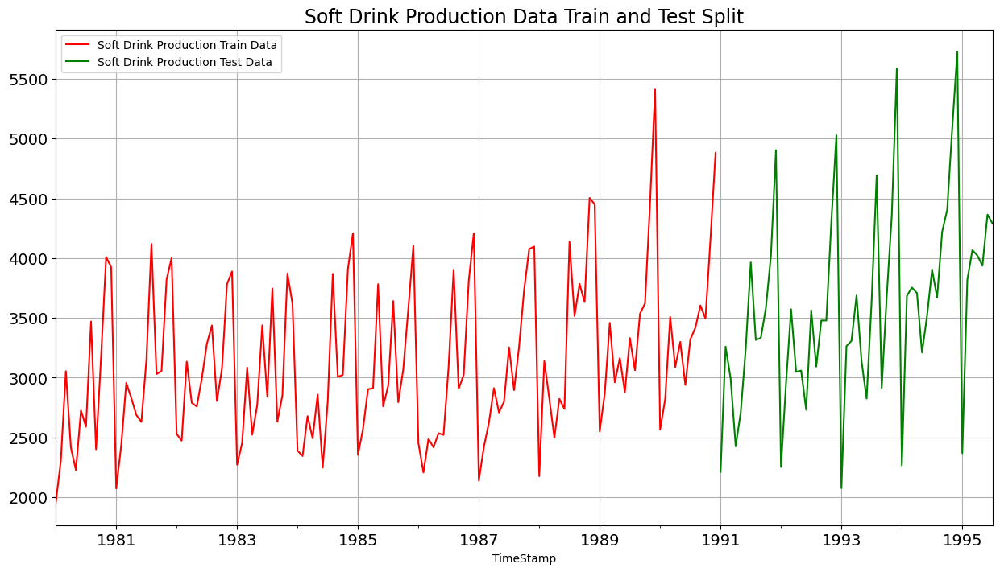

In [ ]:
#Visualization of train and test data.
strain['SoftDrinkProduction'].plot(fontsize=14, color='red')
stest['SoftDrinkProduction'].plot(fontsize=14, color='green')
plt.grid()
plt.legend(['Soft Drink Production Train Data','Soft Drink Production Test Data'])
plt.title('Soft Drink Production Data Train and Test Split', fontsize=17)
plt.show();

### Build different Models and Model Evaluation

Before we start with Linear Regression we have to modify our training and test data so that we can build a model that is going to regress the 'Rose' variable against the order of the occurrence.

In [ ]:
print(strain.shape)
print(stest.shape)

(132, 1)
(55, 1)


In [ ]:
train_time = [i+1 for i in range(len(strain))]
test_time = [i+133 for i in range(len(stest))]
print('Training Time Instance :','\n',train_time)
print('Test Time Instance :','\n',test_time)

Training Time Instance : 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Test Time Instance : 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [ ]:
LR_strain = strain.copy()
LR_stest = stest.copy()

In [ ]:
LR_strain['Time']=train_time
LR_stest['Time']=test_time

In [ ]:
print('First few rows of Training Data')
display(LR_strain.head())
print('Last few rows of Training Data')
display(LR_strain.tail())
print('First few rows of Test Data')
display(LR_stest.head())
print('Last few rows of Test Data')
display(LR_stest.tail())

First few rows of Training Data


,SoftDrinkProduction,Time
TimeStamp,,
1980-01-31,1954,1
1980-02-29,2302,2
1980-03-31,3054,3
1980-04-30,2414,4
1980-05-31,2226,5


Last few rows of Training Data


,SoftDrinkProduction,Time
TimeStamp,,
1990-08-31,3418,128
1990-09-30,3604,129
1990-10-31,3495,130
1990-11-30,4163,131
1990-12-31,4882,132


First few rows of Test Data


,SoftDrinkProduction,Time
TimeStamp,,
1991-01-31,2211,133
1991-02-28,3260,134
1991-03-31,2992,135
1991-04-30,2425,136
1991-05-31,2707,137


Last few rows of Test Data


,SoftDrinkProduction,Time
TimeStamp,,
1995-03-31,4067,183
1995-04-30,4022,184
1995-05-31,3937,185
1995-06-30,4365,186
1995-07-31,4290,187


In [ ]:
#Let us build Linear Regression on the modified test and training data
from sklearn.linear_model import LinearRegression
lrs = LinearRegression()

In [ ]:
lrs.fit(LR_strain[['Time']],LR_strain['SoftDrinkProduction'])

LinearRegression()

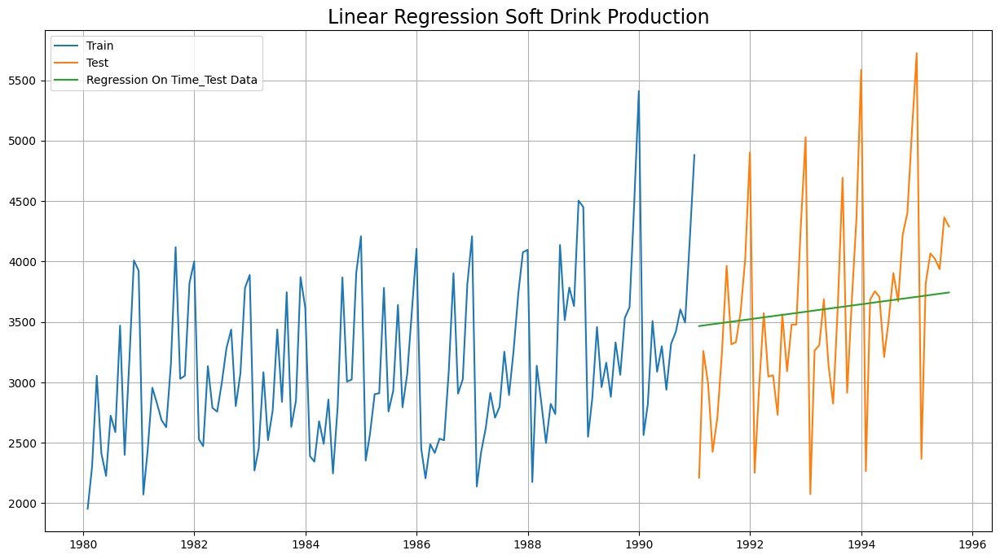

In [ ]:
train_predictions_LR = lrs.predict(LR_strain[['Time']])
LR_strain['RegOnTime']= train_predictions_LR

test_predictions_LR = lrs.predict(LR_stest[['Time']])
LR_stest['RegOnTime'] = test_predictions_LR

plt.plot(strain['SoftDrinkProduction'], label='Train')
plt.plot(stest['SoftDrinkProduction'], label='Test')
plt.plot(LR_stest['RegOnTime'], label='Regression On Time_Test Data')
plt.title('Linear Regression Soft Drink Production', fontsize=17)
plt.legend(loc='best')
plt.grid()
plt.show();

In [ ]:
#Model Evaluation
rmse_LRS_test = mean_squared_error(stest['SoftDrinkProduction'],test_predictions_LR,squared=False)
print("For Regression On Time forecast on the Test Data,  RMSE is %3.3f " %(rmse_LRS_test))

For Regression On Time forecast on the Test Data,  RMSE is 775.808 


In [ ]:
#Let's create a DataFrame for all the RMSE Value
LRs = pd.DataFrame({'Test RMSE Soft Drink Production': [rmse_LRS_test]},index=['Regression On Time'])
LRs

,Test RMSE Soft Drink Production
Regression On Time,775.80781


#### Model 2 - NAIVE APPROACH

In [ ]:
NM_strain = strain.copy()
NM_stest = stest.copy()

In [ ]:
strain.tail()

,SoftDrinkProduction
TimeStamp,
1990-08-31,3418
1990-09-30,3604
1990-10-31,3495
1990-11-30,4163
1990-12-31,4882


In [ ]:
NM_stest['naive'] = np.asarray(strain['SoftDrinkProduction'])[len(np.asarray(strain['SoftDrinkProduction']))-1]
NM_stest['naive'].head()

TimeStamp
1991-01-31    4882
1991-02-28    4882
1991-03-31    4882
1991-04-30    4882
1991-05-31    4882
Name: naive, dtype: int64

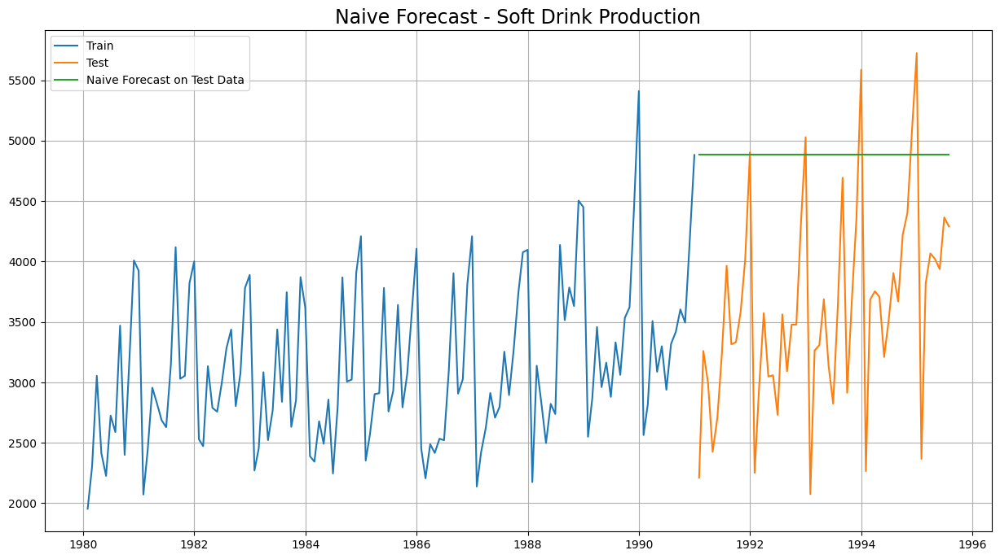

In [ ]:
plt.plot(NM_strain['SoftDrinkProduction'], label='Train')
plt.plot(stest['SoftDrinkProduction'], label='Test')

plt.plot(NM_stest['naive'], label='Naive Forecast on Test Data')

plt.legend(loc='best')
plt.title("Naive Forecast - Soft Drink Production", fontsize=17)
plt.grid()
plt.show();

In [ ]:
rmse_NM_stest = mean_squared_error(stest['SoftDrinkProduction'],NM_stest['naive'],squared=False)
print("For Naive Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_NM_stest))

For Naive Model forecast on the Test Data,  RMSE is 1519.259


In [ ]:
NMs = pd.DataFrame({'Test RMSE Soft Drink Production': [rmse_NM_stest]},index=['Naive Model'])

In [ ]:
RMSE_SoftDrink  = pd.concat([LRs, NMs], axis=0);
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233


#### Model 3 - SIMPLE AVERAGE MODEL


In [ ]:
#For this particular simple average method, we will forecast by using the average of the training values.
SA_strain = strain.copy()
SA_stest = stest.copy()

In [ ]:
SA_stest['mean_forecast'] = strain['SoftDrinkProduction'].mean()
SA_stest.head()

,SoftDrinkProduction,mean_forecast
TimeStamp,,
1991-01-31,2211,3124.166667
1991-02-28,3260,3124.166667
1991-03-31,2992,3124.166667
1991-04-30,2425,3124.166667
1991-05-31,2707,3124.166667


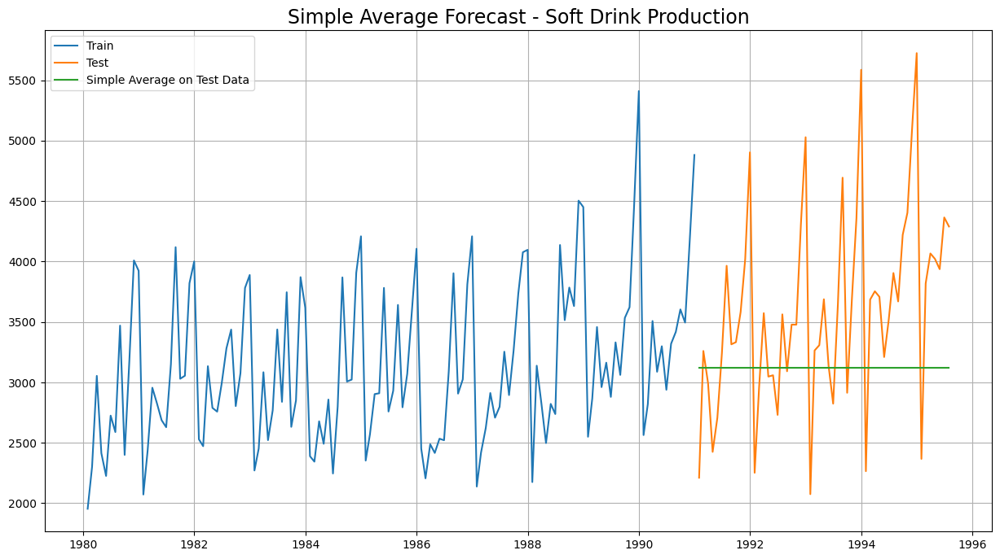

In [ ]:
plt.plot(SA_strain['SoftDrinkProduction'], label='Train')
plt.plot(SA_stest['SoftDrinkProduction'], label='Test')

plt.plot(SA_stest['mean_forecast'], label='Simple Average on Test Data')

plt.legend(loc='best')
plt.title("Simple Average Forecast - Soft Drink Production", fontsize=17)
plt.grid()
plt.show();

In [ ]:
rmse_SA_stest = mean_squared_error(stest['SoftDrinkProduction'],SA_stest['mean_forecast'],squared=False)
print("For Simple Average forecast on Soft Drink Production Test Data,  RMSE is %3.3f" %(rmse_SA_stest))

For Simple Average forecast on Soft Drink Production Test Data,  RMSE is 934.353


In [ ]:
SAs = pd.DataFrame({'Test RMSE Soft Drink Production': [rmse_SA_stest]},index=['Simple Average Model'])

In [ ]:
RMSE_SoftDrink = pd.concat([LRs, NMs,SAs], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
Simple Average Model,934.353358


#### Model 4 - MOVING AVERAGE MODEL

In [ ]:
MovingAverage = df2.copy()
MovingAverage.head()

,SoftDrinkProduction
TimeStamp,
1980-01-31,1954
1980-02-29,2302
1980-03-31,3054
1980-04-30,2414
1980-05-31,2226


In [ ]:
#Moving Models
MovingAverage['Trailing_4'] = MovingAverage['SoftDrinkProduction'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['SoftDrinkProduction'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['SoftDrinkProduction'].rolling(9).mean()

MovingAverage.head()

,SoftDrinkProduction,Trailing_4,Trailing_6,Trailing_9
TimeStamp,,,,
1980-01-31,1954,NaN,NaN,NaN
1980-02-29,2302,NaN,NaN,NaN
1980-03-31,3054,NaN,NaN,NaN
1980-04-30,2414,2431.0,NaN,NaN
1980-05-31,2226,2499.0,NaN,NaN


In [ ]:
#Splitting the data into test anr train again
trailing_MovingAverage_strain=MovingAverage[MovingAverage.index<'1991']
trailing_MovingAverage_stest=MovingAverage[MovingAverage.index>='1991']

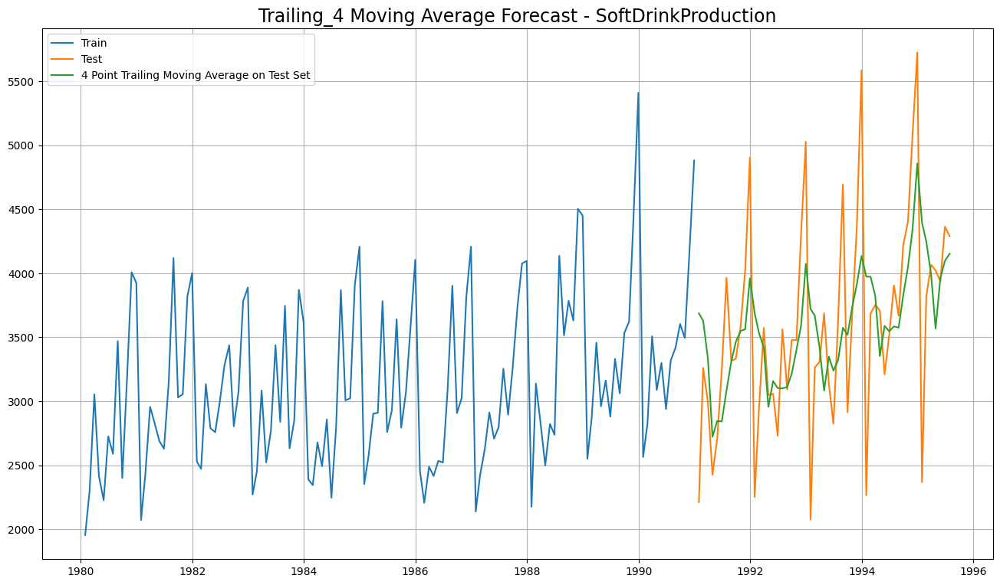

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_strain['SoftDrinkProduction'], label='Train')
plt.plot(trailing_MovingAverage_stest['SoftDrinkProduction'], label='Test')

plt.plot(trailing_MovingAverage_stest['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.grid()
plt.title('Trailing_4 Moving Average Forecast - SoftDrinkProduction', fontsize=17)
plt.show();

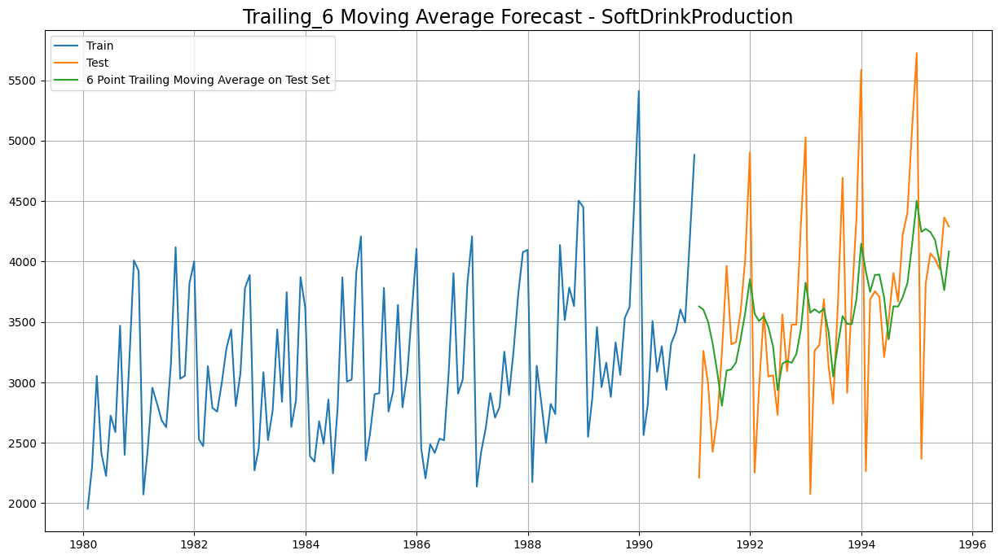

In [ ]:
plt.plot(trailing_MovingAverage_strain['SoftDrinkProduction'], label='Train')
plt.plot(trailing_MovingAverage_stest['SoftDrinkProduction'], label='Test')

plt.plot(trailing_MovingAverage_stest['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')

plt.legend(loc = 'best')
plt.grid()
plt.title('Trailing_6 Moving Average Forecast - SoftDrinkProduction', fontsize=17)
plt.show();

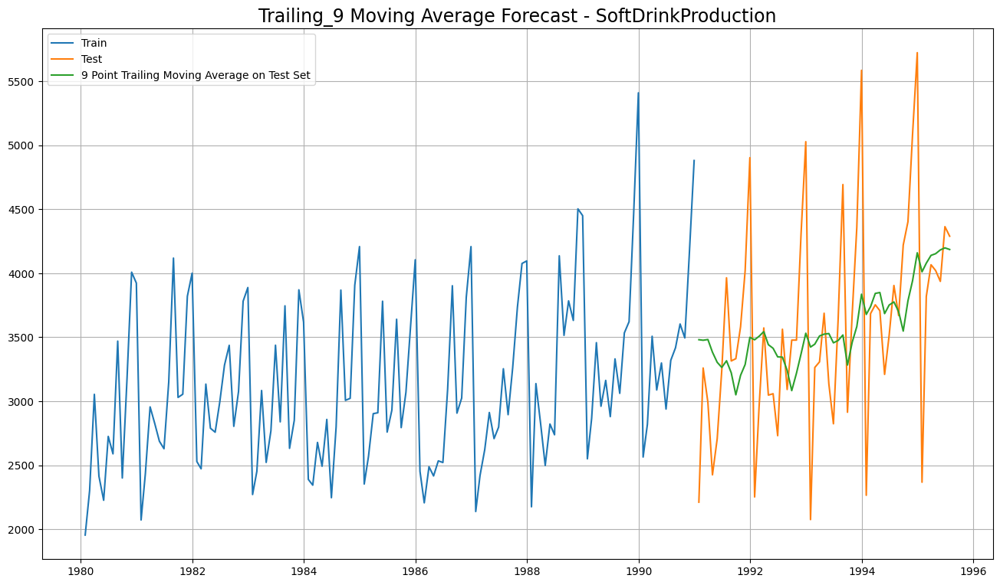

In [ ]:


plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_strain['SoftDrinkProduction'], label='Train')
plt.plot(trailing_MovingAverage_stest['SoftDrinkProduction'], label='Test')

plt.plot(trailing_MovingAverage_stest['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.grid()
plt.title('Trailing_9 Moving Average Forecast - SoftDrinkProduction', fontsize=17)
plt.show();

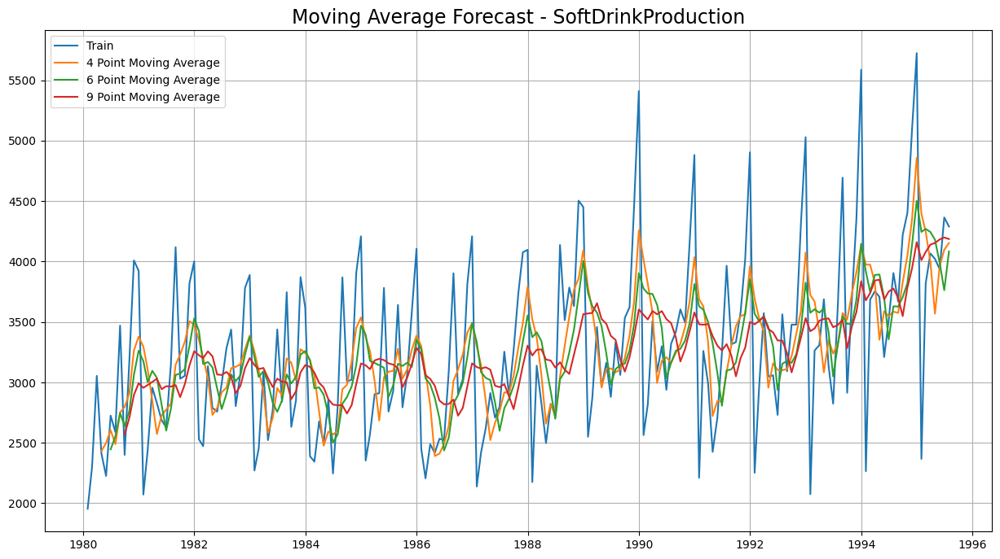

In [ ]:
#Visulaizing the trailing models together on whole Rose dataset
plt.plot(MovingAverage['SoftDrinkProduction'], label='Train')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid()
plt.title('Moving Average Forecast - SoftDrinkProduction', fontsize=17)
plt.show();

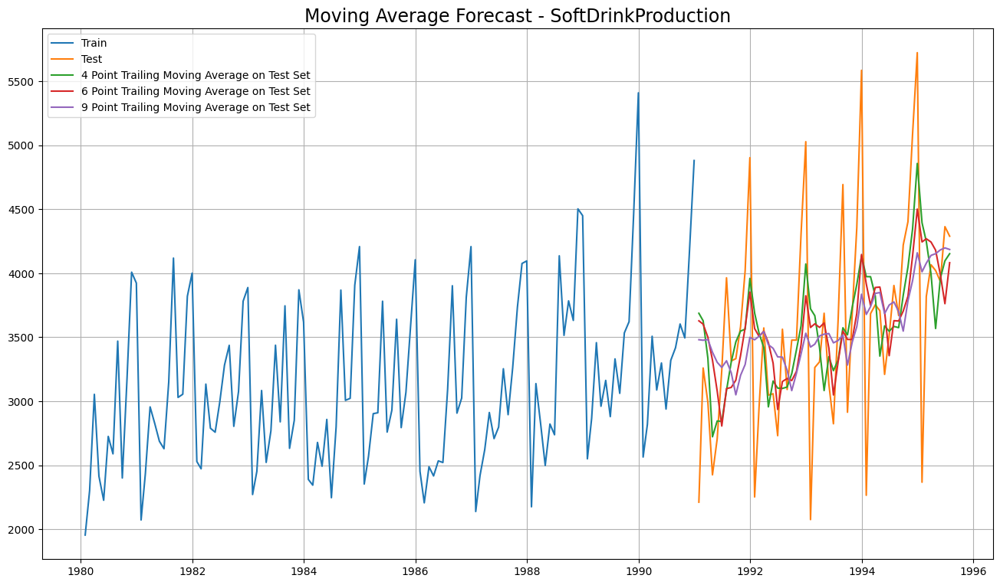

In [ ]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,9))
plt.plot(trailing_MovingAverage_strain['SoftDrinkProduction'], label='Train')
plt.plot(trailing_MovingAverage_stest['SoftDrinkProduction'], label='Test')

plt.plot(trailing_MovingAverage_stest['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_stest['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_stest['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
#The best location for title
plt.legend(loc ='best')
plt.grid()
plt.title('Moving Average Forecast - SoftDrinkProduction', fontsize=17);
plt.show();

In [ ]:
#Model Evaluation: This is done only on test data

## Test Data - RMSE --> 4 point Trailing MA

rmse_MAs_test_4 = mean_squared_error(stest['SoftDrinkProduction'],trailing_MovingAverage_stest['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is %3.3f" %(rmse_MAs_test_4))

## Test Data - RMSE --> 6 point Trailing MA

rmse_MAs_test_6 = mean_squared_error(stest['SoftDrinkProduction'],trailing_MovingAverage_stest['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is %3.3f" %(rmse_MAs_test_6))

## Test Data - RMSE --> 9 point Trailing MA

rmse_MAs_test_9 = mean_squared_error(stest['SoftDrinkProduction'],trailing_MovingAverage_stest['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is %3.3f" %(rmse_MAs_test_9))

For 4 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is 687.182
For 6 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is 710.514
For 9 point Moving Average Model forecast on SoftDrinkProduction Training Data,  RMSE is 735.890


In [ ]:
MAs = pd.DataFrame({'Test RMSE Soft Drink Production': [rmse_MAs_test_4 ,rmse_MAs_test_6,rmse_MAs_test_9]} ,index=['4point Trailing MovingAverage','6point Trailing MovingAverage','9point Trailing MovingAverage'])
MAs

,Test RMSE Soft Drink Production
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827


In [ ]:
RMSE_SoftDrink = pd.concat([LRs, NMs,SAs, MAs], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
Simple Average Model,934.353358
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827


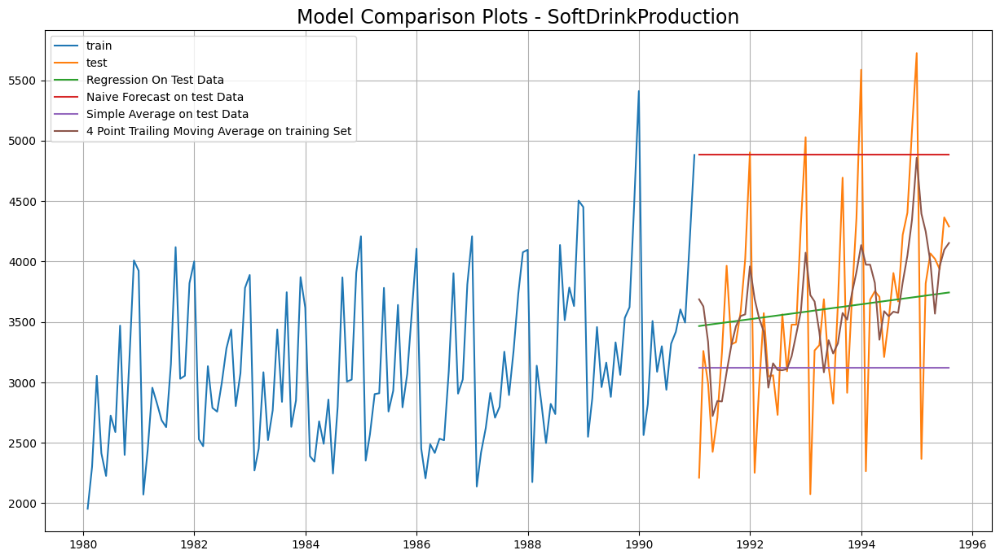

In [ ]:
#Since we have built all the models now, lets visualize a consildated plots for all the above models.
plt.plot(strain['SoftDrinkProduction'], label='train')
plt.plot(stest['SoftDrinkProduction'], label='test')

plt.plot(LR_stest['RegOnTime'], label='Regression On Test Data')

plt.plot(NM_stest['naive'], label='Naive Forecast on test Data')

plt.plot(SA_stest['mean_forecast'], label='Simple Average on test Data')

plt.plot(trailing_MovingAverage_stest['Trailing_4'], label='4 Point Trailing Moving Average on training Set') #4point Trailing MovingAverage has the least RMSE value


plt.legend(loc='best')
plt.title("Model Comparison Plots - SoftDrinkProduction", fontsize=17)
plt.grid();

### Model 5 - Simple Exponential Smoothing

In [ ]:
import statsmodels.tools.eval_measures as em
from statsmodels.tsa.api import SimpleExpSmoothing, ExponentialSmoothing, Holt

In [ ]:
S_SES = SimpleExpSmoothing(strain,initialization_method='estimated' )
S_SES_autofit = S_SES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
S_SES_autofit.params

{'smoothing_level': 0.11899125573220379,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 2572.9666666666653,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
#Here, Python has optimized the smoothing level to be almost 0.1
SES_predict_soft = S_SES_autofit.forecast(steps=len(stest))
SES_predict_soft

1991-01-31    3656.670334
1991-02-28    3656.670334
1991-03-31    3656.670334
1991-04-30    3656.670334
1991-05-31    3656.670334
1991-06-30    3656.670334
1991-07-31    3656.670334
1991-08-31    3656.670334
1991-09-30    3656.670334
1991-10-31    3656.670334
1991-11-30    3656.670334
1991-12-31    3656.670334
1992-01-31    3656.670334
1992-02-29    3656.670334
1992-03-31    3656.670334
1992-04-30    3656.670334
1992-05-31    3656.670334
1992-06-30    3656.670334
1992-07-31    3656.670334
1992-08-31    3656.670334
1992-09-30    3656.670334
1992-10-31    3656.670334
1992-11-30    3656.670334
1992-12-31    3656.670334
1993-01-31    3656.670334
1993-02-28    3656.670334
1993-03-31    3656.670334
1993-04-30    3656.670334
1993-05-31    3656.670334
1993-06-30    3656.670334
1993-07-31    3656.670334
1993-08-31    3656.670334
1993-09-30    3656.670334
1993-10-31    3656.670334
1993-11-30    3656.670334
1993-12-31    3656.670334
1994-01-31    3656.670334
1994-02-28    3656.670334
1994-03-31  

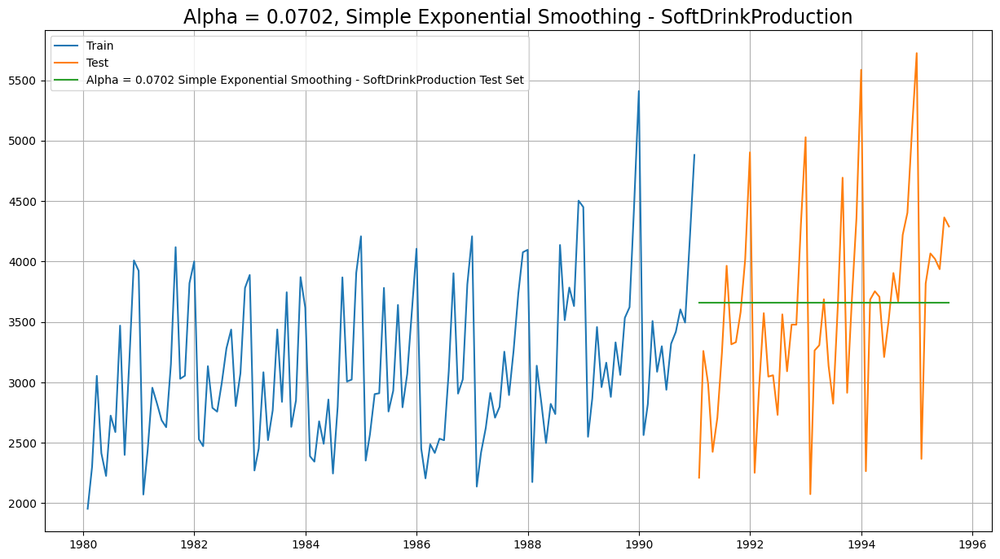

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

plt.plot(SES_predict_soft, label='Alpha = 0.0702 Simple Exponential Smoothing - SoftDrinkProduction Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha = 0.0702, Simple Exponential Smoothing - SoftDrinkProduction', fontsize=17);

In [ ]:
#Model Evaluation
print('SES RMSE:',mean_squared_error(stest.values,SES_predict_soft.values,squared=False))

SES RMSE: 809.4880766247412


In [ ]:
S_SES= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,SES_predict_soft.values,squared=False)]},index=['Simple Exponential Smoothing'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077


#### Model 6 - Double Exponential Model

In [ ]:
S_DES = Holt(strain,initialization_method='estimated' )
S_DES_autofit = S_DES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
S_DES_autofit.params

{'smoothing_level': 0.12422871835746076,
 'smoothing_trend': 0.1076907898617213,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 2142.921735097963,
 'initial_trend': 42.27433099915336,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
DES_predict_soft = S_DES_autofit.forecast(steps=len(stest))
DES_predict_soft

1991-01-31    3727.184414
1991-02-28    3751.450911
1991-03-31    3775.717408
1991-04-30    3799.983904
1991-05-31    3824.250401
1991-06-30    3848.516897
1991-07-31    3872.783394
1991-08-31    3897.049890
1991-09-30    3921.316387
1991-10-31    3945.582884
1991-11-30    3969.849380
1991-12-31    3994.115877
1992-01-31    4018.382373
1992-02-29    4042.648870
1992-03-31    4066.915366
1992-04-30    4091.181863
1992-05-31    4115.448360
1992-06-30    4139.714856
1992-07-31    4163.981353
1992-08-31    4188.247849
1992-09-30    4212.514346
1992-10-31    4236.780842
1992-11-30    4261.047339
1992-12-31    4285.313836
1993-01-31    4309.580332
1993-02-28    4333.846829
1993-03-31    4358.113325
1993-04-30    4382.379822
1993-05-31    4406.646318
1993-06-30    4430.912815
1993-07-31    4455.179312
1993-08-31    4479.445808
1993-09-30    4503.712305
1993-10-31    4527.978801
1993-11-30    4552.245298
1993-12-31    4576.511794
1994-01-31    4600.778291
1994-02-28    4625.044788
1994-03-31  

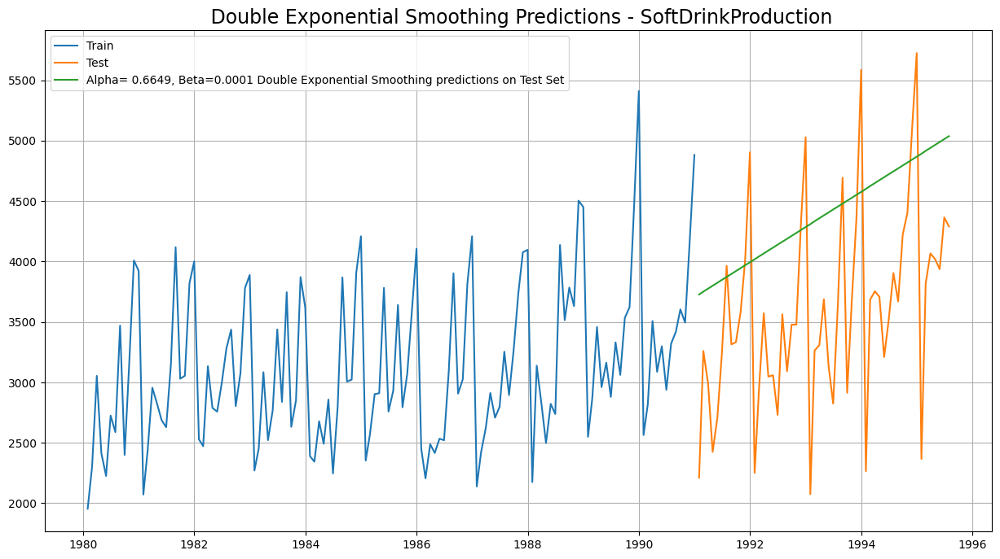

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

#plt.plot(DES_predict_soft, label='Alpha = 0.09874 Simple Exponential Smoothing - SoftDrinkProduction Test Set') #SES
plt.plot(DES_predict_soft, label='Alpha= 0.6649, Beta=0.0001 Double Exponential Smoothing predictions on Test Set') #DES

plt.legend(loc='best')
plt.grid()
plt.title(' Double Exponential Smoothing Predictions - SoftDrinkProduction', fontsize=17);

In [ ]:
#Model Evaluation
print('DES RMSE:',mean_squared_error(stest.values,DES_predict_soft.values,squared=False))

DES RMSE: 1074.3293459708495


In [ ]:
S_DES= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,DES_predict_soft.values,squared=False)]},index=['Double Exponential Smoothing'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346


### Model 7 - Holt-Winter's Model (Exponential Smoothing) with additive errors

In [ ]:
S_TES = ExponentialSmoothing(strain,trend='additive',seasonal='additive',initialization_method='estimated')
S_TES_autofit = S_TES.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
S_TES_autofit.params

{'smoothing_level': 0.14725349665078738,
 'smoothing_trend': 0.04026354389497352,
 'smoothing_seasonal': 0.262954089643287,
 'damping_trend': nan,
 'initial_level': 2803.2134064051784,
 'initial_trend': 7.795420105412205,
 'initial_seasons': array([-687.28403418, -582.87477981,  -55.66996054, -365.74541979,
        -253.25547469, -196.41431615,  -32.54648749,  690.32288388,
        -282.21062228,   44.7500281 ,  867.40547063,  853.51824254]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
TES_predict_soft = S_TES_autofit.forecast(steps=len(stest))
TES_predict_soft

1991-01-31    2572.068741
1991-02-28    2890.820260
1991-03-31    3286.542739
1991-04-30    2997.804800
1991-05-31    3204.777167
1991-06-30    3004.791150
1991-07-31    3540.682191
1991-08-31    3621.304308
1991-09-30    3614.892314
1991-10-31    3663.196669
1991-11-30    4382.055599
1991-12-31    4760.578998
1992-01-31    2624.748594
1992-02-29    2943.500112
1992-03-31    3339.222592
1992-04-30    3050.484652
1992-05-31    3257.457019
1992-06-30    3057.471003
1992-07-31    3593.362044
1992-08-31    3673.984161
1992-09-30    3667.572167
1992-10-31    3715.876522
1992-11-30    4434.735452
1992-12-31    4813.258851
1993-01-31    2677.428447
1993-02-28    2996.179965
1993-03-31    3391.902445
1993-04-30    3103.164505
1993-05-31    3310.136872
1993-06-30    3110.150856
1993-07-31    3646.041896
1993-08-31    3726.664013
1993-09-30    3720.252020
1993-10-31    3768.556374
1993-11-30    4487.415305
1993-12-31    4865.938704
1994-01-31    2730.108299
1994-02-28    3048.859818
1994-03-31  

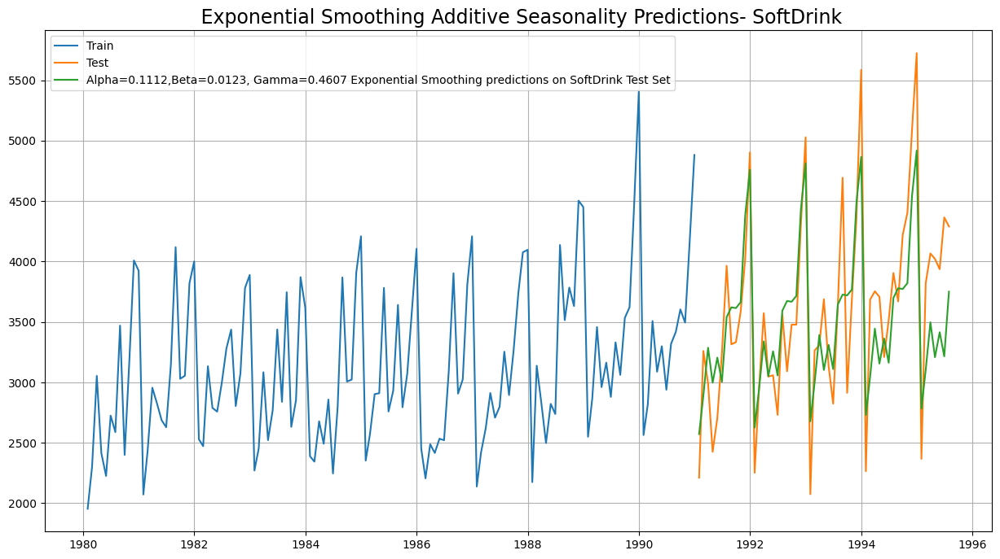

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')

#plt.plot(DES_predict_soft, label='Alpha = 0.09874 Simple Exponential Smoothing - SoftDrink Test Set') #SES
#plt.plot(DES_predict_soft, label='Alpha= 0.6649, Beta=0.0001 Double Exponential Smoothing predictions on SoftDrink Test Set') #DES
plt.plot(TES_predict_soft, label='Alpha=0.1112,Beta=0.0123, Gamma=0.4607 Exponential Smoothing predictions on SoftDrink Test Set') #TES

plt.legend(loc='best')
plt.grid()
plt.title(' Exponential Smoothing Additive Seasonality Predictions- SoftDrink', fontsize=17);

In [ ]:
#Model Evaluation
print('TES RMSE:',mean_squared_error(stest.values,TES_predict_soft.values,squared=False))

TES RMSE: 459.79696091329055


In [ ]:
S_TES= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,TES_predict_soft.values,squared=False)]},index=['Exponential Smoothing (Additive Seasonality)'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961


### Model 8 - Holt-Winter's Model (Exponential Smoothing) with multiplicative seasonality


In [ ]:
S_TES_M = ExponentialSmoothing(strain,trend='additive',seasonal='multiplicative',initialization_method='estimated')
S_TES_M_autofit = S_TES_M.fit(optimized=True)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
S_TES_M_autofit.params

{'smoothing_level': 0.11109431519592447,
 'smoothing_trend': 0.049376826867578195,
 'smoothing_seasonal': 0.23045135049306534,
 'damping_trend': nan,
 'initial_level': 2803.2031192879085,
 'initial_trend': 15.090789924689997,
 'initial_seasons': array([0.81675206, 0.85707329, 1.03845496, 0.9260439 , 0.95069866,
        0.97315248, 1.03766339, 1.25338534, 0.99255867, 1.07376893,
        1.35052981, 1.38008798]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [ ]:
TES_M_predict_soft = S_TES_M_autofit.forecast(steps=len(stest))
TES_M_predict_soft

1991-01-31    2569.744680
1991-02-28    2890.183186
1991-03-31    3297.975314
1991-04-30    3008.698928
1991-05-31    3215.504574
1991-06-30    3021.654339
1991-07-31    3573.714185
1991-08-31    3715.124416
1991-09-30    3598.671447
1991-10-31    3680.723715
1991-11-30    4460.607096
1991-12-31    4866.427317
1992-01-31    2610.979012
1992-02-29    2936.497369
1992-03-31    3350.753745
1992-04-30    3056.783861
1992-05-31    3266.826317
1992-06-30    3069.818033
1992-07-31    3630.601880
1992-08-31    3774.184786
1992-09-30    3655.804843
1992-10-31    3739.082583
1992-11-30    4531.237903
1992-12-31    4943.382478
1993-01-31    2652.213343
1993-02-28    2982.811553
1993-03-31    3403.532177
1993-04-30    3104.868794
1993-05-31    3318.148060
1993-06-30    3117.981727
1993-07-31    3687.489575
1993-08-31    3833.245155
1993-09-30    3712.938239
1993-10-31    3797.441450
1993-11-30    4601.868710
1993-12-31    5020.337639
1994-01-31    2693.447675
1994-02-28    3029.125737
1994-03-31  

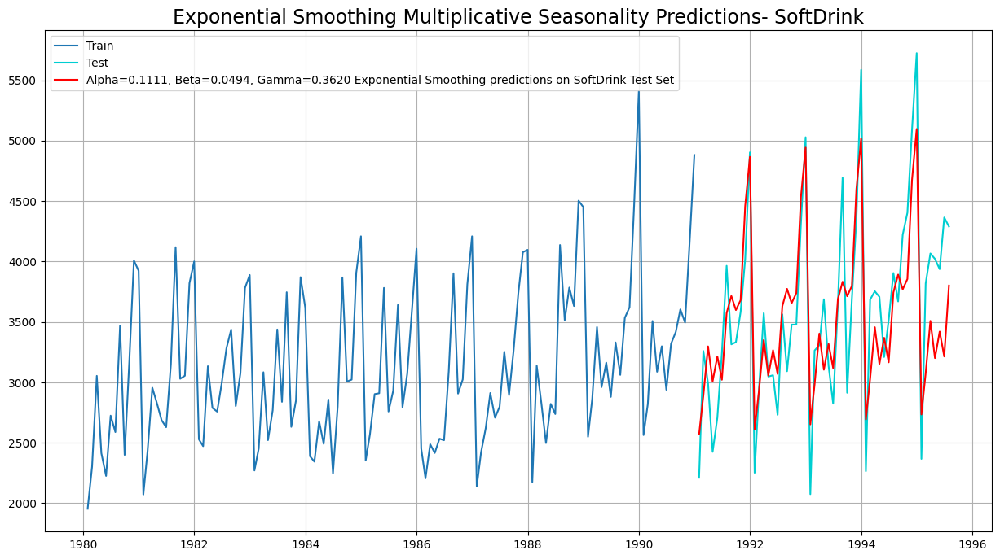

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test', color = 'darkturquoise')

#plt.plot(DES_predict_soft, label='Alpha = 0.09874 Simple Exponential Smoothing - SoftDrink Test Set', color = 'green') #SES
#plt.plot(DES_predict_soft, label='Alpha= 0.6649, Beta=0.0001 Double Exponential Smoothing predictions on SoftDrink Test Set',color = 'yellow') #DES
#plt.plot(TES_predict_soft, label='Alpha=0.1112,Beta=0.0123, Gamma=0.4607 Exponential Smoothing predictions on SoftDrink Test Set', color = 'magenta') #TES
plt.plot(TES_M_predict_soft, label='Alpha=0.1111, Beta=0.0494, Gamma=0.3620 Exponential Smoothing predictions on SoftDrink Test Set', color = 'red')

plt.legend(loc='best')
plt.grid()
plt.title('Exponential Smoothing Multiplicative Seasonality Predictions- SoftDrink', fontsize=17);

In [ ]:
#Model Evaluation
print('TES M_RMSE:',mean_squared_error(stest.values,TES_M_predict_soft.values,squared=False))

TES M_RMSE: 447.6228366327932


In [ ]:
S_M_TES= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,TES_M_predict_soft.values,squared=False)]},index=['Exponential Smoothing (Multi Seasonality)'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES, S_M_TES], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961
Exponential Smoothing (Multi Seasonality),447.622837


### Check for stationarity of the whole Time Series data.
The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:

1.   H0: The Time Series has a unit root and is thus non-stationary.
2.   H1:The Time Series does not have a unit root and is thus stationary

We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the α (0.05)
 value.

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
dftest1 = adfuller(df2, regression='ct')
print('DF test statistic is %3.3f' %dftest1[0])
print('DF test p-value is' ,dftest1[1])
print('Number of lags used' ,dftest1[2])

DF test statistic is -0.425
DF test p-value is 0.9861019765758298
Number of lags used 12


In [ ]:
#Since the p value is greater than 0.05, So Time Series is non-stationary.

#Let us take one level of differencing to see whether the series becomes stationary

dftest1 = adfuller(df2.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest1[0])
print('DF test p-value is' ,dftest1[1])
print('Number of lags used' ,dftest1[2])

DF test statistic is -9.481
DF test p-value is 3.053709292535803e-14
Number of lags used 11


fill

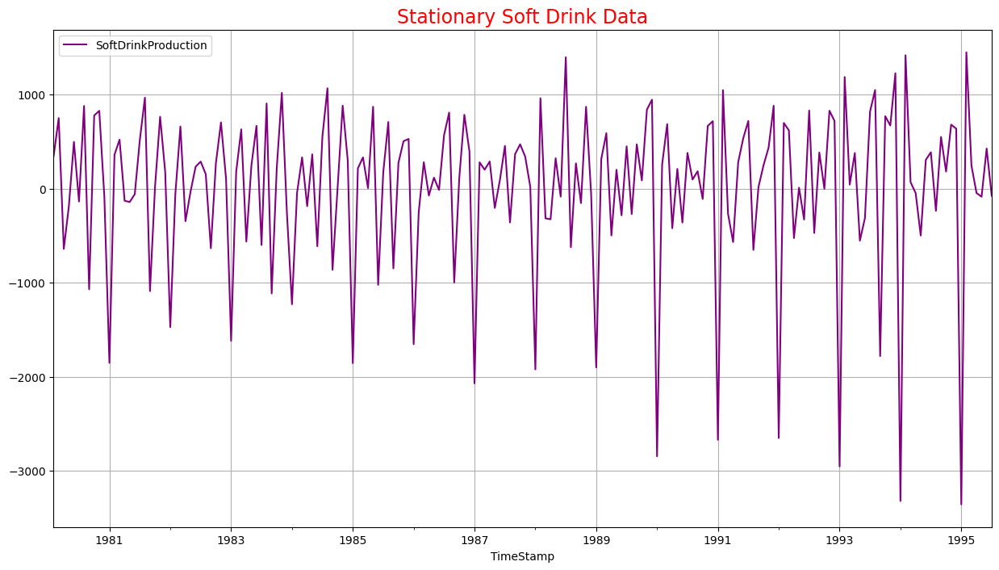

In [ ]:
df2.diff().dropna().plot(grid=True, color='purple');
plt.title('Stationary Soft Drink Data', color='red', fontsize=17);

#### Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

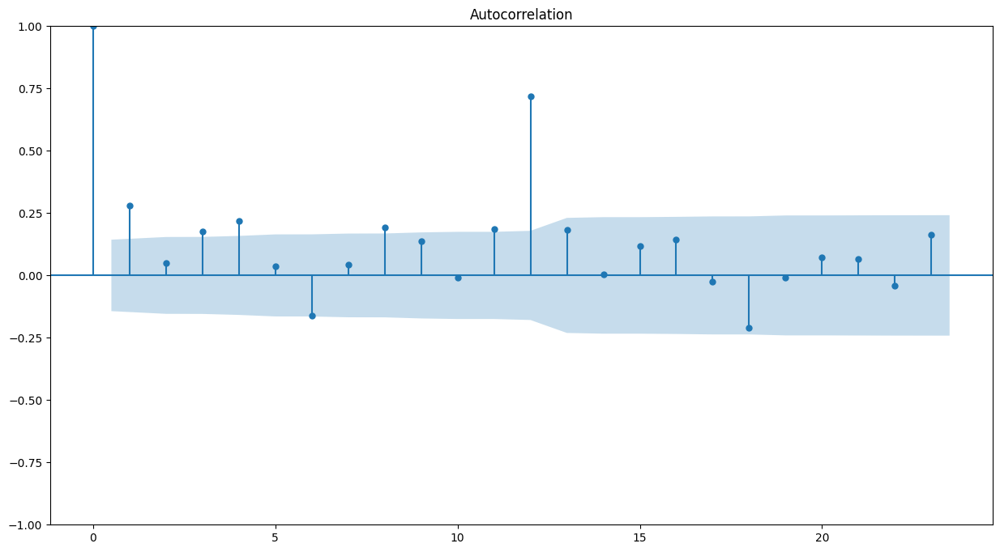

In [ ]:
plot_acf(df2, alpha=0.05);

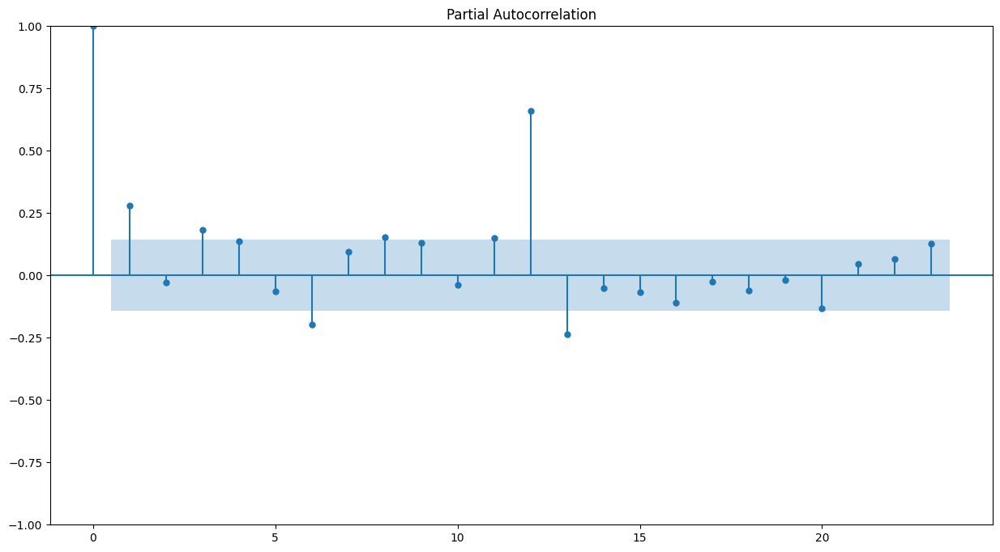

In [ ]:
plot_pacf(df2, alpha=0.05, method='ywmle');

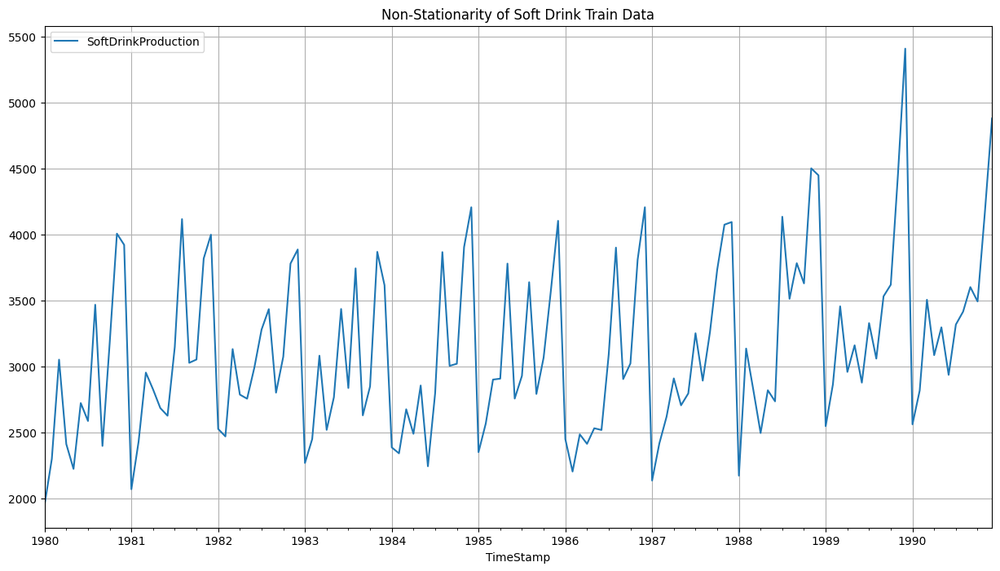

In [ ]:
#Checking for stationarity of the Training Data Time Series
strain.plot(grid=True)
plt.title('Non-Stationarity of Soft Drink Train Data')
plt.show();

In [ ]:
dftest2 = adfuller(strain,regression='ct')
print('DF test statistic is %3.3f' %dftest2[0])
print('DF test p-value is' ,dftest2[1])
print('Number of lags used' ,dftest2[2])

DF test statistic is -1.649
DF test p-value is 0.7726647141271958
Number of lags used 12


In [ ]:
#Since the train data is non-stationary, lets take first level of differencing
dftest2 = adfuller(strain.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest2[0])
print('DF test p-value is' ,dftest2[1])
print('Number of lags used' ,dftest2[2])

DF test statistic is -7.271
DF test p-value is 3.4205181049973744e-09
Number of lags used 11


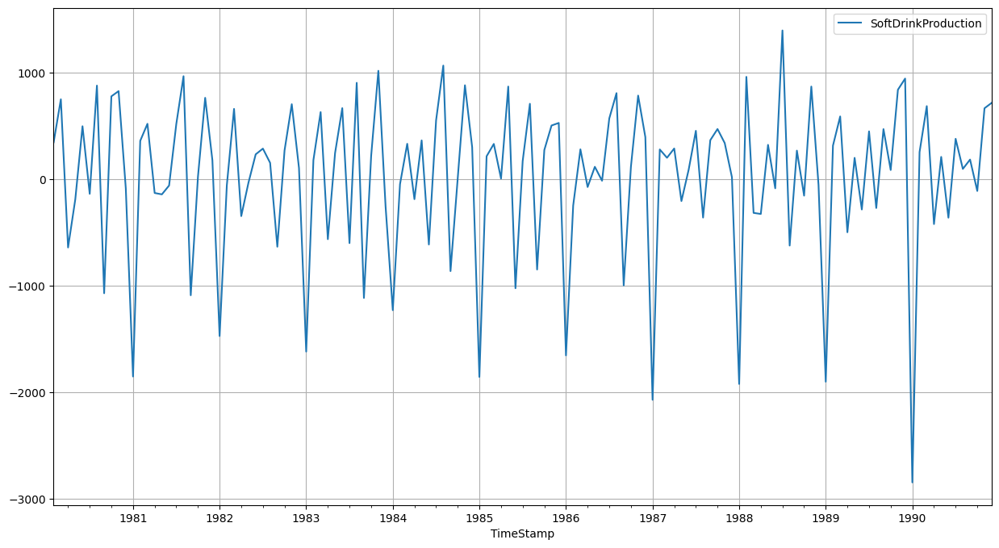

In [ ]:

strain.diff().dropna().plot(grid=True);

In [ ]:
strain.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132 entries, 1980-01-31 to 1990-12-31
Data columns (total 1 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   SoftDrinkProduction  132 non-null    int64
dtypes: int64(1)
memory usage: 2.1 KB


### Model 9 - Automated ARIMA Model

Now that our training data is stationary, let us build an automated version of ARIMA model and for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC)

Note: The data has some seasonality so ideally we should build a SARIMA model. But lets test on the lowest Akaike Information Criteria, which one suits best - ARIMA or SARIMA

In [ ]:
import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [ ]:
# Creating an empty Dataframe with column names only
SOFT_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
SOFT_ARIMA_AIC

,param,AIC


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    S_ARIMA_model = ARIMA(strain['SoftDrinkProduction'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,S_ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:2103.7338336875
ARIMA(0, 1, 1) - AIC:2069.599630211402
ARIMA(0, 1, 2) - AIC:2056.4892632434903


<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(0, 1, 3) - AIC:2056.8317894192514
ARIMA(1, 1, 0) - AIC:2097.872121649042
ARIMA(1, 1, 1) - AIC:2061.523083929782
ARIMA(1, 1, 2) - AIC:2056.715682068919


<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AI

ARIMA(1, 1, 3) - AIC:2058.712159036654
ARIMA(2, 1, 0) - AIC:2073.234860536023
ARIMA(2, 1, 1) - AIC:2059.1006718133845


<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(2, 1, 2) - AIC:2058.7127021004603


<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S

ARIMA(2, 1, 3) - AIC:2057.0899706111686
ARIMA(3, 1, 0) - AIC:2070.3653671411803
ARIMA(3, 1, 1) - AIC:2058.3045459913437
ARIMA(3, 1, 2) - AIC:2060.6799657038237


<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


ARIMA(3, 1, 3) - AIC:2059.6040424563953


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-105-645c052bd611>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SOFT_ARIMA_AIC = SOFT_ARIMA_AIC.append({'param':param, 'AIC': S_ARIMA_model.aic}, ignore_index=True)


In [ ]:
SOFT_ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
2,"(0, 1, 2)",2056.489263
6,"(1, 1, 2)",2056.715682
3,"(0, 1, 3)",2056.831789
11,"(2, 1, 3)",2057.089971
13,"(3, 1, 1)",2058.304546


In [ ]:
auto_S_ARIMA = ARIMA(strain, order=(0,1,2))

results_auto_S_ARIMA = auto_S_ARIMA.fit()

print(results_auto_S_ARIMA.summary())

                                SARIMAX Results                                
Dep. Variable:     SoftDrinkProduction   No. Observations:                  132
Model:                  ARIMA(0, 1, 2)   Log Likelihood               -1025.245
Date:                 Mon, 28 Aug 2023   AIC                           2056.489
Time:                         08:57:32   BIC                           2065.115
Sample:                     01-31-1980   HQIC                          2059.994
                          - 12-31-1990                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5407      0.085     -6.392      0.000      -0.707      -0.375
ma.L2         -0.3913      0.113     -3.475      0.001      -0.612      -0.171
sigma2      3.572e+05   4.62e+04      7.725 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


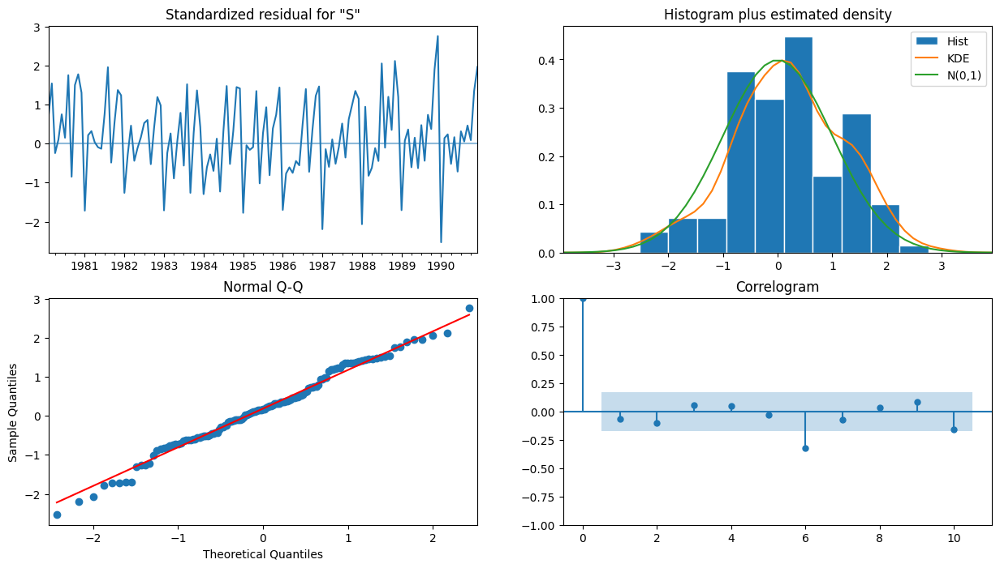

In [ ]:
#SoftDrink ARIMA Diagnostic plot
results_auto_S_ARIMA.plot_diagnostics();

In [ ]:
#Prediction and Evaluation of ARIMA model on the Saprkling Test
predicted_auto_S_ARIMA = results_auto_S_ARIMA.forecast(steps=len(stest))
predicted_auto_S_ARIMA

1991-01-31    3931.418229
1991-02-28    3471.550575
1991-03-31    3471.550575
1991-04-30    3471.550575
1991-05-31    3471.550575
1991-06-30    3471.550575
1991-07-31    3471.550575
1991-08-31    3471.550575
1991-09-30    3471.550575
1991-10-31    3471.550575
1991-11-30    3471.550575
1991-12-31    3471.550575
1992-01-31    3471.550575
1992-02-29    3471.550575
1992-03-31    3471.550575
1992-04-30    3471.550575
1992-05-31    3471.550575
1992-06-30    3471.550575
1992-07-31    3471.550575
1992-08-31    3471.550575
1992-09-30    3471.550575
1992-10-31    3471.550575
1992-11-30    3471.550575
1992-12-31    3471.550575
1993-01-31    3471.550575
1993-02-28    3471.550575
1993-03-31    3471.550575
1993-04-30    3471.550575
1993-05-31    3471.550575
1993-06-30    3471.550575
1993-07-31    3471.550575
1993-08-31    3471.550575
1993-09-30    3471.550575
1993-10-31    3471.550575
1993-11-30    3471.550575
1993-12-31    3471.550575
1994-01-31    3471.550575
1994-02-28    3471.550575
1994-03-31  

In [ ]:
#Model Evaluation
rmse = mean_squared_error(stest['SoftDrinkProduction'],predicted_auto_S_ARIMA,squared=False)
rmse

831.6158494996555

In [ ]:
R_S_ARIMA= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,predicted_auto_S_ARIMA.values,squared=False)]},index=['ARIMA (0, 1, 2)'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES, S_M_TES, R_S_ARIMA], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961
Exponential Smoothing (Multi Seasonality),447.622837


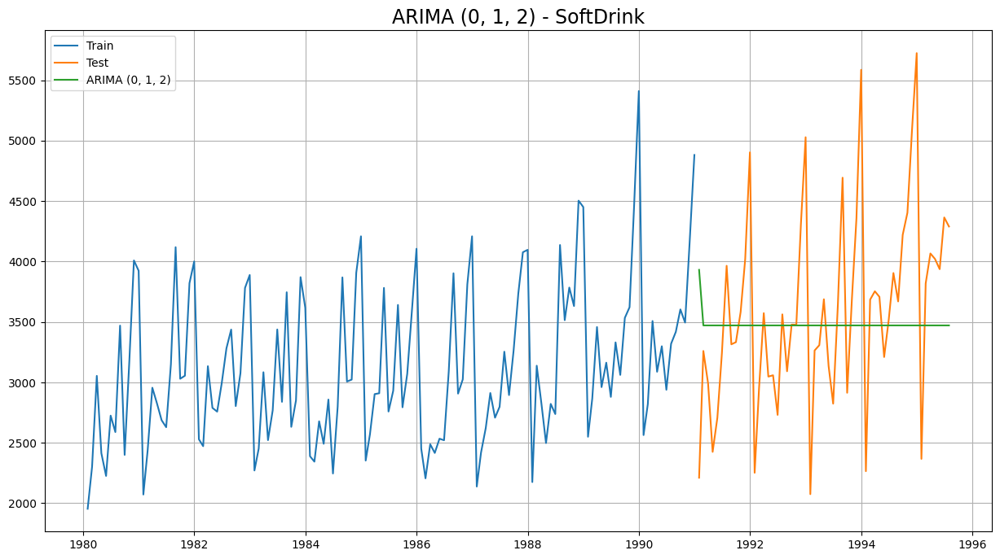

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
plt.plot(predicted_auto_S_ARIMA,label='ARIMA (0, 1, 2)')


plt.legend(loc='best')
plt.grid()
plt.title('ARIMA (0, 1, 2) - SoftDrink', fontsize=17);

#### Model 10 - Manual ARIMA

Build a version of the ARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots.

Let us look at the ACF and the PACF plots once more.


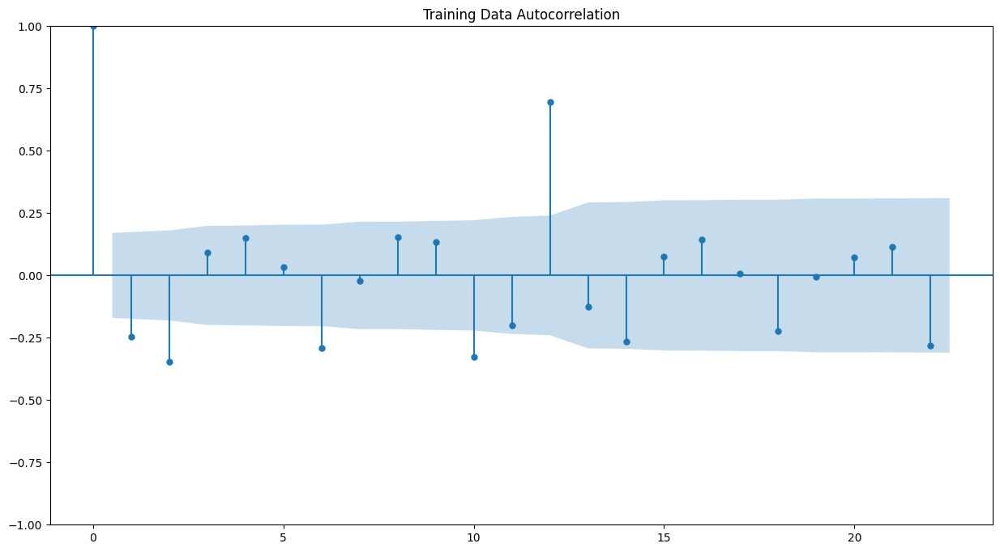

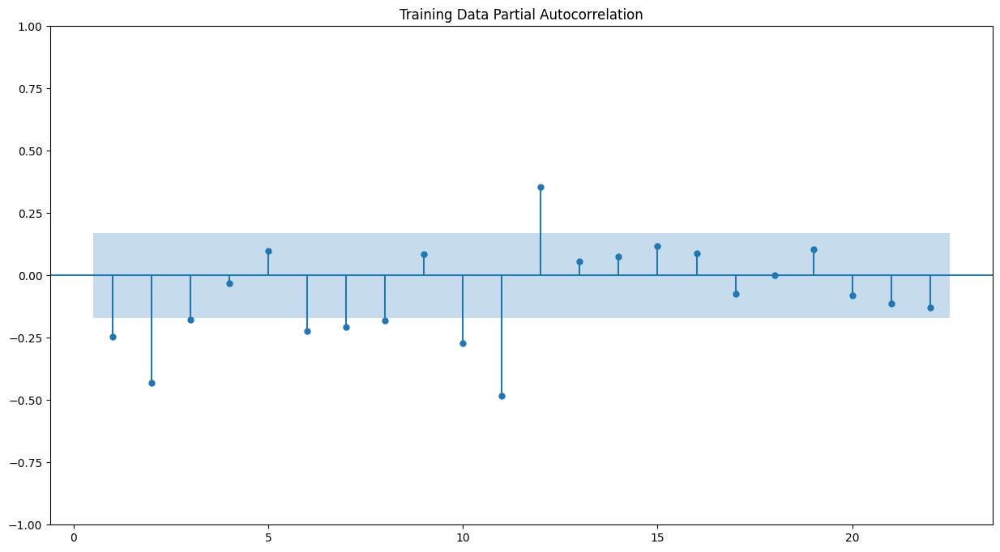

In [ ]:
plot_acf(strain.diff(),title='Training Data Autocorrelation',missing='drop')
plot_pacf(strain.diff().dropna(),title='Training Data Partial Autocorrelation',zero=False,method='ywmle')
plt.show()

Here, we have taken alpha=0.05.

As per the above plot p and q will be 3 and 2

In [ ]:
SManual_ARIMA = ARIMA(strain['SoftDrinkProduction'], order=(3,1,2),freq='M')

results_SManual_ARIMA = SManual_ARIMA.fit()

print(results_SManual_ARIMA.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


                                SARIMAX Results                                
Dep. Variable:     SoftDrinkProduction   No. Observations:                  132
Model:                  ARIMA(3, 1, 2)   Log Likelihood               -1024.340
Date:                 Mon, 28 Aug 2023   AIC                           2060.680
Time:                         08:57:34   BIC                           2077.931
Sample:                     01-31-1980   HQIC                          2067.690
                          - 12-31-1990                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3216      0.460     -0.700      0.484      -1.223       0.579
ar.L2         -0.0001      0.189     -0.001      0.999      -0.371       0.370
ar.L3         -0.0227      0.218     -0.104 

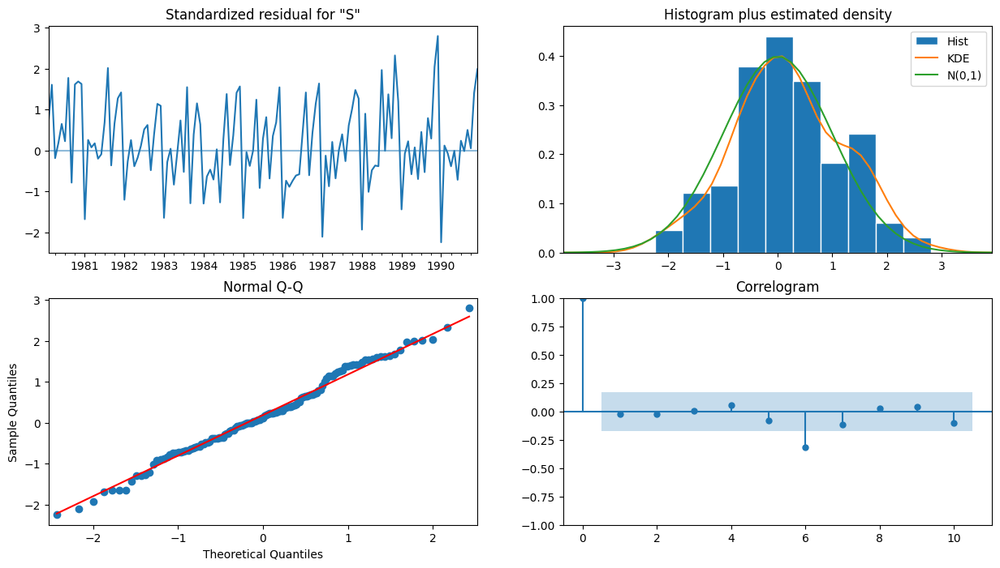

In [ ]:
#SoftDrinkProduction Manual ARIMA Diagnostic plot
results_SManual_ARIMA.plot_diagnostics();

In [ ]:
predicted_SManual_ARIMA = results_SManual_ARIMA.forecast(steps=len(stest))
predicted_SManual_ARIMA

1991-01-31    3808.668243
1991-02-28    3383.981131
1991-03-31    3504.367970
1991-04-30    3490.113763
1991-05-31    3504.339160
1991-06-30    3497.028278
1991-07-31    3499.701843
1991-08-31    3498.519470
1991-09-30    3499.065635
1991-10-31    3498.829339
1991-11-30    3498.932150
1991-12-31    3498.886696
1992-01-31    3498.906675
1992-02-29    3498.897917
1992-03-31    3498.901765
1992-04-30    3498.900074
1992-05-31    3498.900817
1992-06-30    3498.900491
1992-07-31    3498.900634
1992-08-31    3498.900571
1992-09-30    3498.900598
1992-10-31    3498.900586
1992-11-30    3498.900592
1992-12-31    3498.900589
1993-01-31    3498.900590
1993-02-28    3498.900590
1993-03-31    3498.900590
1993-04-30    3498.900590
1993-05-31    3498.900590
1993-06-30    3498.900590
1993-07-31    3498.900590
1993-08-31    3498.900590
1993-09-30    3498.900590
1993-10-31    3498.900590
1993-11-30    3498.900590
1993-12-31    3498.900590
1994-01-31    3498.900590
1994-02-28    3498.900590
1994-03-31  

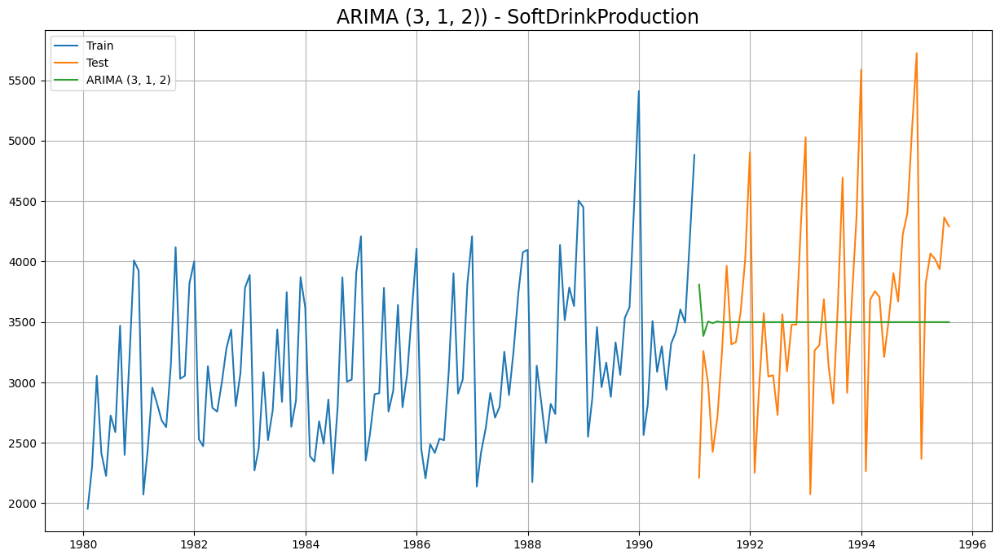

In [ ]:
# Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
plt.plot(predicted_SManual_ARIMA,label='ARIMA (3, 1, 2)')


plt.legend(loc='best')
plt.grid()
plt.title('ARIMA (3, 1, 2)) - SoftDrinkProduction', fontsize=17);

In [ ]:
#Model Evaluation
rmse = mean_squared_error(stest['SoftDrinkProduction'],predicted_SManual_ARIMA,squared=False)
rmse

822.2172638663685

In [ ]:
SM_ARIMA= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,predicted_SManual_ARIMA.values,squared=False)]},index=['ARIMA (3, 1, 2)'])
RMSE_SoftDrink  = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES, S_M_TES, R_S_ARIMA, SM_ARIMA], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961
Exponential Smoothing (Multi Seasonality),447.622837


#### Model 11 - Automated SARIMA Model
Build an Automated version of a SARIMA model for which the best parameters are selected in accordance with the lowest Akaike Information Criteria (AIC)

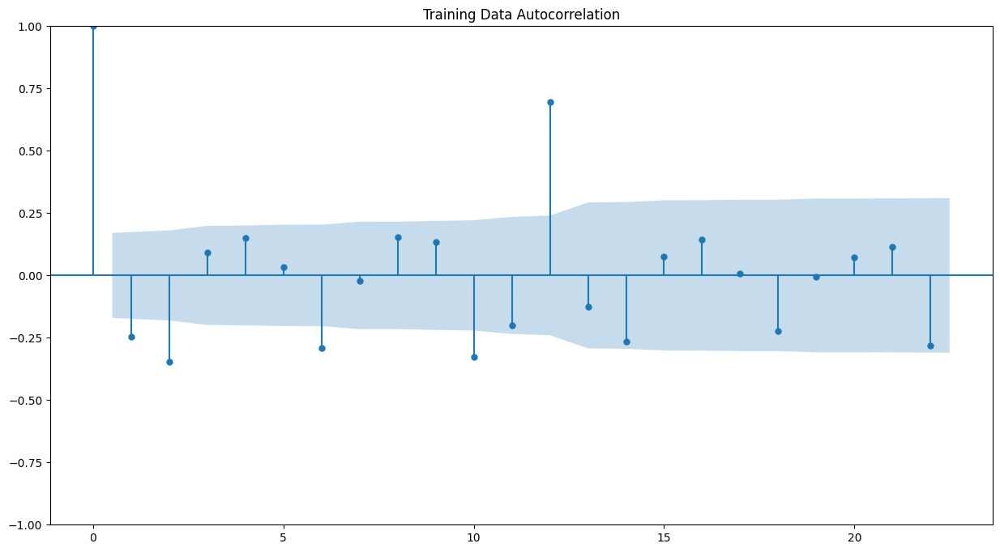

In [ ]:
plot_acf(strain.diff(),title='Training Data Autocorrelation',missing='drop');

In [ ]:
#We can see that there is a seasonality. Lets build the models now.
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [ ]:
SARIMA_AIC_soft = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_soft

,param,seasonal,AIC


In [ ]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_smodel = sm.tsa.statespace.SARIMAX(strain['SoftDrinkProduction'].values,
                                            order=param, seasonal_order= param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_S_SARIMA = SARIMA_smodel.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_S_SARIMA.aic))
        SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2088.4633983660715
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1836.220093770657


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1633.5491793653493


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:3747.2705156540783
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1789.8662806996663
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1764.6107238899406
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1591.5155744481326


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warning

SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:4438.194333909523
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1608.648860364038
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1608.6165283979626


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1591.8014039553652


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:3307.8054203581087
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:1431.8195214429534
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:1433.6836345123477


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:1435.6483733347138


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:6760.798839985402
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2035.4871783907402
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1788.5369694843869

<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)



SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1577.0183750724525


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(0, 1, 1)x(0, 0, 3, 12) - AIC:3656.01677419033
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1749.9824755850325
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1697.7997311033164


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:1530.6914315585884


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 3, 12) - AIC:3885.1780720134766
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:1563.4637994170953


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:1558.2120753838099


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:1529.2536659271266


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 3, 12) - AIC:4103.842530308779
SARIMA(0, 1, 1)x(3, 0, 0, 12) - AIC:1391.5159313903657


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(3, 0, 1, 12) - AIC:1391.6784806926123


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(3, 0, 2, 12) - AIC:1393.2542228893396


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(0, 1, 1)x(3, 0, 3, 12) - AIC:1960.2930397335203
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:2008.753008540958
SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1762.3734963548918


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:1560.8259136546887


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 3, 12) - AIC:3650.630110925048
SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1744.333084465503
SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1684.9857149264212


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:1518.229380675375


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 3, 12) - AIC:3738.257754063029


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:1564.296467021353


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:1559.4022470471875


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:1517.2079034803905


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 3, 12) - AIC:3507.68907040494
SARIMA(0, 1, 2)x(3, 0, 0, 12) - AIC:1392.0923895477774


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 1, 12) - AIC:1392.889691604518


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(3, 0, 2, 12) - AIC:1394.6785425336195


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(0, 1, 2)x(3, 0, 3, 12) - AIC:2968.91863180186
SARIMA(0, 1, 3)x(0, 0, 0, 12) - AIC:1992.4491478145942
SARIMA(0, 1, 3)x(0, 0, 1, 12) - AIC:1749.3536183758517


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(0, 0, 2, 12) - AIC:1548.9937425994306


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(0, 0, 3, 12) - AIC:4382.062962451716
SARIMA(0, 1, 3)x(1, 0, 0, 12) - AIC:1746.2493017246732


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 1, 12) - AIC:1673.776856202408


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 2, 12) - AIC:1506.7422199455352


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(1, 0, 3, 12) - AIC:4082.693096211896
SARIMA(0, 1, 3)x(2, 0, 0, 12) - AIC:1566.20192055093


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 1, 12) - AIC:1561.2942416742696


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 2, 12) - AIC:1505.6350989653265


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(2, 0, 3, 12) - AIC:3932.954708332896
SARIMA(0, 1, 3)x(3, 0, 0, 12) - AIC:1394.046151663439


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 1, 12) - AIC:1394.821725214664


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 2, 12) - AIC:1396.6195181083567


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 3)x(3, 0, 3, 12) - AIC:6657.246664038278
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:2082.346293203914
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1830.7959380862133


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:1619.1692193105584


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(1, 1, 0)x(0, 0, 3, 12) - AIC:4079.462382095695
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1762.686922670103
SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1746.034454856944


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:1573.3986023937134


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 3, 12) - AIC:3774.6121508054534
SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:1575.3766146707335


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:1574.3043753933498


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:1572.711841137882


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 3, 12) - AIC:3567.1954101402334
SARIMA(1, 1, 0)x(3, 0, 0, 12) - AIC:1403.9062790896671


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 1, 12) - AIC:1404.8772929476838


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 2, 12) - AIC:1405.6815365014108


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(3, 0, 3, 12) - AIC:6898.014353984618
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:2026.5294817474264


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1779.6139226872185


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:1575.1200609607652


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 3, 12) - AIC:3636.157250200925
SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1730.659784956743


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1699.1714026436339


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:1531.8683338234753


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 3, 12) - AIC:3196.2138399893283
SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:1546.3906446335948


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:1544.971326795929


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:1530.6567519848702


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 3, 12) - AIC:3697.7796377870504


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 0, 12) - AIC:1378.1108268899625


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 1, 12) - AIC:1379.4108641044338


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 2, 12) - AIC:1381.116187643434


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(3, 0, 3, 12) - AIC:6815.468097217087
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:2006.7462276365845


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1763.7570445188019


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:1561.8449999112422


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 3, 12) - AIC:3648.0014946350466
SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1734.4177579735906


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1686.9458097841014


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:1519.197015449037


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 3, 12) - AIC:3112.625439014685
SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:1548.2807767423876


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:1546.500275844139


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:1518.3289759796053


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 3, 12) - AIC:3549.8441817794214
SARIMA(1, 1, 2)x(3, 0, 0, 12) - AIC:1379.4891004064943


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(3, 0, 1, 12) - AIC:1380.633440168639


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(3, 0, 2, 12) - AIC:1382.171784085882


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(3, 0, 3, 12) - AIC:6738.879008851152
SARIMA(1, 1, 3)x(0, 0, 0, 12) - AIC:1993.7636095584066


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 1, 12) - AIC:1751.201510869477


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 2, 12) - AIC:1548.7413820918136


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(0, 0, 3, 12) - AIC:3794.3271801833903


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 0, 12) - AIC:1734.0453013318381


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 1, 12) - AIC:1675.7561332939808


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 2, 12) - AIC:1507.6931784806807


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(1, 0, 3, 12) - AIC:3692.9424568489635
SARIMA(1, 1, 3)x(2, 0, 0, 12) - AIC:1550.2325959013367


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 1, 12) - AIC:1548.8140559594108


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 2, 12) - AIC:1506.5836177003794


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(2, 0, 3, 12) - AIC:3070.470750125127
SARIMA(1, 1, 3)x(3, 0, 0, 12) - AIC:1381.4552198524143


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(3, 0, 1, 12) - AIC:1382.6330750899294


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(3, 0, 2, 12) - AIC:1384.1703883687205


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 3)x(3, 0, 3, 12) - AIC:22.0
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:2040.0704103507978
SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1814.1583482027463


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:1607.689201397783


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(2, 1, 0)x(0, 0, 3, 12) - AIC:3990.8461401310137
SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1738.250072013797
SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1717.8744470685392


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:1561.9021353053167


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 3, 12) - AIC:3479.711518864984
SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:1547.9158672872234


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:1546.9578751839035


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:1546.8665186645962


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 3, 12) - AIC:3850.554376548352
SARIMA(2, 1, 0)x(3, 0, 0, 12) - AIC:1378.747156749801


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(3, 0, 1, 12) - AIC:1379.6405722497204


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(3, 0, 2, 12) - AIC:1380.824710425045


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(3, 0, 3, 12) - AIC:6805.7389398846135
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:2024.4456626381198


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1778.6762974897888


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:1577.0337158769337


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 3, 12) - AIC:4137.229021504949
SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1717.9115930478686


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1700.7853241049052


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:1533.7922419997635


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 3, 12) - AIC:4112.835124145022
SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:1534.5085119806522


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:1533.0523649506886


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:1532.651498652178


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 3, 12) - AIC:3699.7796377906966


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 0, 12) - AIC:1366.4702945434642


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 1, 12) - AIC:1367.791404121418


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 2, 12) - AIC:1369.524427989222


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(3, 0, 3, 12) - AIC:2645.700301045974
SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:2008.472196605966


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1765.3351336094156


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:1562.7584199684538


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 3, 12) - AIC:2916.399208403311
SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1717.5426780771313


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 1, 12) - AIC:1688.8418429958558


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 2, 12) - AIC:1521.1910051344307


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 3, 12) - AIC:3175.754288469169
SARIMA(2, 1, 2)x(2, 0, 0, 12) - AIC:1535.9388543597222


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 1, 12) - AIC:1534.0240861517443


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 2, 12) - AIC:1520.3136559120255


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 3, 12) - AIC:2497.953684144611
SARIMA(2, 1, 2)x(3, 0, 0, 12) - AIC:1367.7234168180128


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 1, 12) - AIC:1369.0617883252569


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 2, 12) - AIC:1370.6028248636992


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(3, 0, 3, 12) - AIC:116.44450246697032
SARIMA(2, 1, 3)x(0, 0, 0, 12) - AIC:1992.301260586999


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(0, 0, 1, 12) - AIC:1752.3850836363831
SARIMA(2, 1, 3)x(0, 0, 2, 12) - AIC:1549.9160990835571


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(0, 0, 3, 12) - AIC:3545.545902232509
SARIMA(2, 1, 3)x(1, 0, 0, 12) - AIC:1721.4223792422742


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 1, 12) - AIC:1675.8823221131763


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 2, 12) - AIC:1508.8985216427698


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(1, 0, 3, 12) - AIC:3126.1222955760877
SARIMA(2, 1, 3)x(2, 0, 0, 12) - AIC:1536.8204068814755


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 1, 12) - AIC:1535.995184575337


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 2, 12) - AIC:1503.6015660528942


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(2, 0, 3, 12) - AIC:4202.947837081848
SARIMA(2, 1, 3)x(3, 0, 0, 12) - AIC:1365.5494630767332


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(3, 0, 1, 12) - AIC:1371.059636903847


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 3)x(3, 0, 2, 12) - AIC:1369.15643325464


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


SARIMA(2, 1, 3)x(3, 0, 3, 12) - AIC:24.0
SARIMA(3, 1, 0)x(0, 0, 0, 12) - AIC:2022.4138558163286
SARIMA(3, 1, 0)x(0, 0, 1, 12) - AIC:1812.40131822551


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(0, 0, 2, 12) - AIC:1605.241962514726


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(0, 0, 3, 12) - AIC:3538.4932570386554
SARIMA(3, 1, 0)x(1, 0, 0, 12) - AIC:1719.7443958496028


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(1, 0, 1, 12) - AIC:1698.4787581827782
SARIMA(3, 1, 0)x(1, 0, 2, 12) - AIC:1558.4832687853643


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(1, 0, 3, 12) - AIC:3502.4465675016822
SARIMA(3, 1, 0)x(2, 0, 0, 12) - AIC:1529.361512884088


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 1, 12) - AIC:1528.7958279744817


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 2, 12) - AIC:1529.2886327223343


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(2, 0, 3, 12) - AIC:3472.6060563197557
SARIMA(3, 1, 0)x(3, 0, 0, 12) - AIC:1361.0088098540018


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(3, 0, 1, 12) - AIC:1362.4041811613981


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(3, 0, 2, 12) - AIC:1363.992670167673


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 0)x(3, 0, 3, 12) - AIC:6732.618796151995
SARIMA(3, 1, 1)x(0, 0, 0, 12) - AIC:2007.461161778354


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 1, 12) - AIC:1780.1012201987544


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 2, 12) - AIC:1578.5247712146343


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(0, 0, 3, 12) - AIC:4138.751181059123
SARIMA(3, 1, 1)x(1, 0, 0, 12) - AIC:1705.3828857391052


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 1, 12) - AIC:1688.4931411741238


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 2, 12) - AIC:1535.5165931720653


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(1, 0, 3, 12) - AIC:4114.835124145022
SARIMA(3, 1, 1)x(2, 0, 0, 12) - AIC:1522.0154644338568


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 1, 12) - AIC:1520.9548942861552


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 2, 12) - AIC:1520.7674148426577


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(2, 0, 3, 12) - AIC:3701.779637790721


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 0, 12) - AIC:1354.2469242527716


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 1, 12) - AIC:1355.6420787277175


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 2, 12) - AIC:1357.2774012001416


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 1)x(3, 0, 3, 12) - AIC:6735.090313270897
SARIMA(3, 1, 2)x(0, 0, 0, 12) - AIC:2009.4528875997094


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 1, 12) - AIC:1768.6803006334035


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 2, 12) - AIC:1564.7538817503244


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(0, 0, 3, 12) - AIC:3318.858841309195
SARIMA(3, 1, 2)x(1, 0, 0, 12) - AIC:1707.036494154483


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 1, 12) - AIC:1689.8221382375566


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 2, 12) - AIC:1522.9170949359327


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(1, 0, 3, 12) - AIC:3278.536537866914
SARIMA(3, 1, 2)x(2, 0, 0, 12) - AIC:1523.9294263973939


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(2, 0, 1, 12) - AIC:1522.2640705555891


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(2, 0, 2, 12) - AIC:1521.8285858626175


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(2, 0, 3, 12) - AIC:3113.6584985115087
SARIMA(3, 1, 2)x(3, 0, 0, 12) - AIC:1355.7661414322354


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 1, 12) - AIC:1357.114537828816


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 2, 12) - AIC:1358.5071097091375


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 2)x(3, 0, 3, 12) - AIC:6737.276299734165


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 0, 12) - AIC:1968.1470912448667


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 1, 12) - AIC:1736.584795326783


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 2, 12) - AIC:1546.6556493496464


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(0, 0, 3, 12) - AIC:3499.2172331198767
SARIMA(3, 1, 3)x(1, 0, 0, 12) - AIC:1706.7413152576025


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 1, 12) - AIC:1677.8012916261355


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 2, 12) - AIC:1509.1335522181948


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(1, 0, 3, 12) - AIC:3433.145543519872
SARIMA(3, 1, 3)x(2, 0, 0, 12) - AIC:1525.7434999826914


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 1, 12) - AIC:1522.6274749956724


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 2, 12) - AIC:1508.116267861472


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(2, 0, 3, 12) - AIC:3889.9584620625697
SARIMA(3, 1, 3)x(3, 0, 0, 12) - AIC:1350.3159999023956


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 1, 12) - AIC:1351.9020143067683


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 2, 12) - AIC:1356.6624643627938


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


SARIMA(3, 1, 3)x(3, 0, 3, 12) - AIC:6661.562260512825


<ipython-input-123-1c2aa9c225a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC_soft = SARIMA_AIC_soft.append({'param':param,'seasonal':param_seasonal ,'AIC': results_S_SARIMA.aic}, ignore_index=True)


In [ ]:
SARIMA_AIC_soft.sort_values(by=['AIC']).head()

,param,seasonal,AIC
127,"(1, 1, 3)","(3, 0, 3, 12)",22.000000
191,"(2, 1, 3)","(3, 0, 3, 12)",24.000000
175,"(2, 1, 2)","(3, 0, 3, 12)",116.444502
252,"(3, 1, 3)","(3, 0, 0, 12)",1350.316000
253,"(3, 1, 3)","(3, 0, 1, 12)",1351.902014


In [ ]:
import statsmodels.api as sm

auto_S_SARIMA = sm.tsa.statespace.SARIMAX(strain['SoftDrinkProduction'],
                                order=(2, 1, 1),
                                seasonal_order=(0, 0, 3, 12),
                                enforce_stationarity=False,)
results_auto_S_SARIMA = auto_S_SARIMA.fit(maxiter=1000)
print(results_auto_S_SARIMA.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


                                         SARIMAX Results                                          
Dep. Variable:                        SoftDrinkProduction   No. Observations:                  132
Model:             SARIMAX(2, 1, 1)x(0, 0, [1, 2, 3], 12)   Log Likelihood                -692.334
Date:                                    Mon, 28 Aug 2023   AIC                           1398.668
Time:                                            09:02:49   BIC                           1416.396
Sample:                                        01-31-1980   HQIC                          1405.826
                                             - 12-31-1990                                         
Covariance Type:                                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2399      0.114      2.113      0

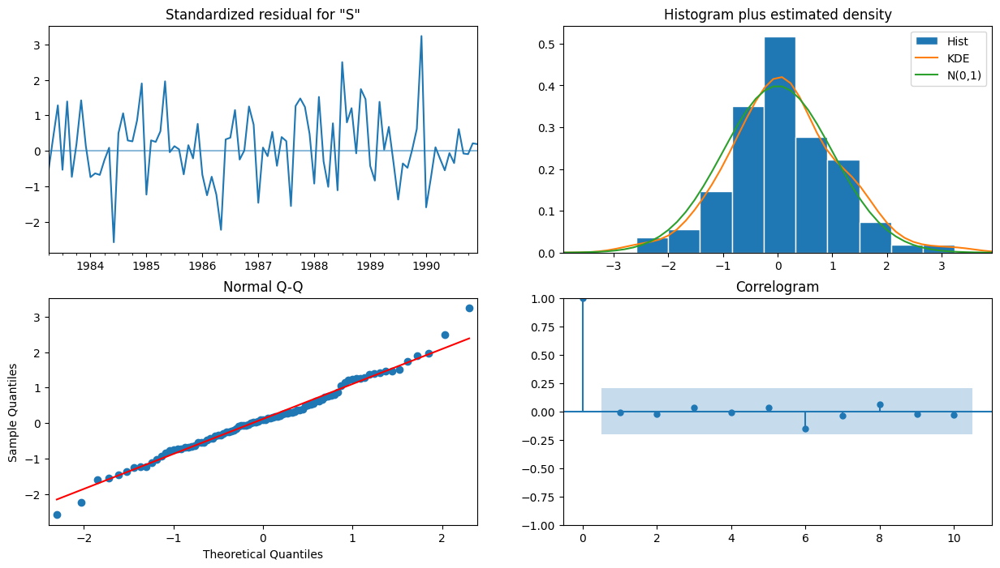

In [ ]:
results_auto_S_SARIMA.plot_diagnostics()
plt.show()

In [ ]:
#Prediction on Test Data (Auto SARIMA Model)
predicted_auto_SARIMA_soft = results_auto_S_SARIMA.get_forecast(steps=len(stest))
predicted_auto_SARIMA1_soft= results_auto_S_SARIMA.get_prediction(start=pd.to_datetime('1991-01-01'), dynamic=False)
predicted_auto_SARIMA1_soft

In [ ]:
predicted_auto_SARIMA_soft.summary_frame(alpha=0.05).head()

SoftDrinkProduction,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,3017.041127,397.765473,2237.435125,3796.647129
1991-02-28,2961.453537,412.229448,2153.498666,3769.408408
1991-03-31,3588.093901,412.514163,2779.580997,4396.606804
1991-04-30,3227.303665,412.632220,2418.559375,4036.047956
1991-05-31,3421.008763,412.873667,2611.791246,4230.226279


In [ ]:
rmse = mean_squared_error(stest['SoftDrinkProduction'],predicted_auto_SARIMA_soft.predicted_mean,squared=False)
rmse

777.4418919307658

In [ ]:
A_SARIMA_soft= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,predicted_auto_SARIMA_soft.predicted_mean,squared=False)]},index=['SARIMA (2, 1, 1) (0, 0, 3, 12)'])
RMSE_Sparkling = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES, S_M_TES, R_S_ARIMA, SM_ARIMA, A_SARIMA_soft], axis=0)
RMSE_Sparkling

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961
Exponential Smoothing (Multi Seasonality),447.622837


/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 9 (	) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


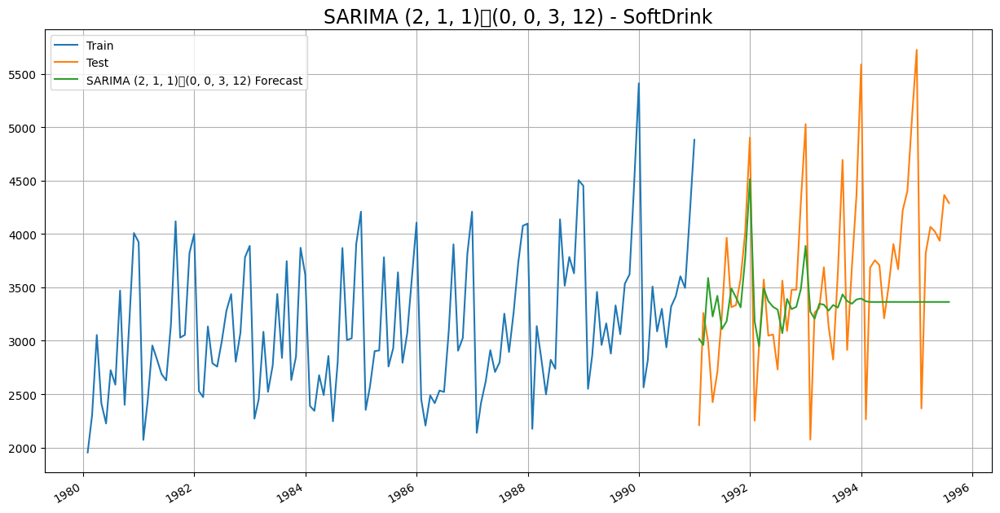

In [ ]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(strain, label='Train')
plt.plot(stest, label='Test')
predicted_auto_SARIMA_soft.predicted_mean.plot(label='SARIMA (2, 1, 1)	(0, 0, 3, 12) Forecast')


plt.legend(loc='best')
plt.grid()
plt.title('SARIMA (2, 1, 1)	(0, 0, 3, 12) - SoftDrink', fontsize=17);

#### Model 12 - Manual SARIMA Model

Build a version of the SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots - Seasonality at 12

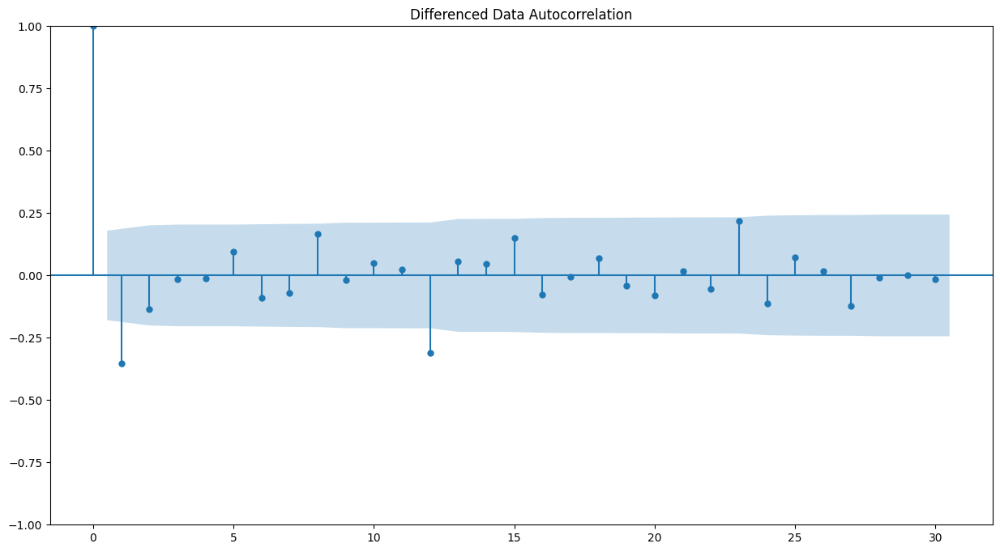

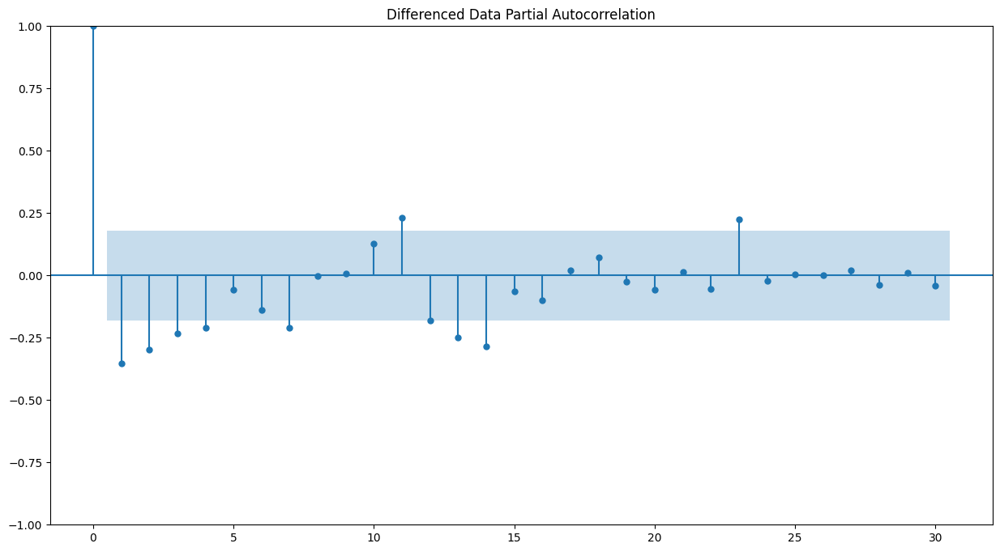

In [ ]:
#We see that there is a trend and a seasonality. So, now we take a seasonal differencing and check the series.
plot_acf((strain['SoftDrinkProduction'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Autocorrelation')
plot_pacf((strain['SoftDrinkProduction'].diff(12).dropna()).diff().dropna(),lags=30, title='Differenced Data Partial Autocorrelation');

In [ ]:
manual_SARIMA_soft = sm.tsa.statespace.SARIMAX(strain['SoftDrinkProduction'].values,
                                order=(0, 1, 0),
                                seasonal_order=(4, 1, 0, 12),
                                enforce_stationarity=False)
results_manual_SARIMA_soft = manual_SARIMA_soft.fit(maxiter=1000)
print(results_manual_SARIMA_soft.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(0, 1, 0)x(4, 1, 0, 12)   Log Likelihood                -531.551
Date:                            Mon, 28 Aug 2023   AIC                           1073.101
Time:                                    09:02:51   BIC                           1084.415
Sample:                                         0   HQIC                          1077.600
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.3519      0.108     -3.254      0.001      -0.564      -0.140
ar.S.L24      -0.2931      0.142   

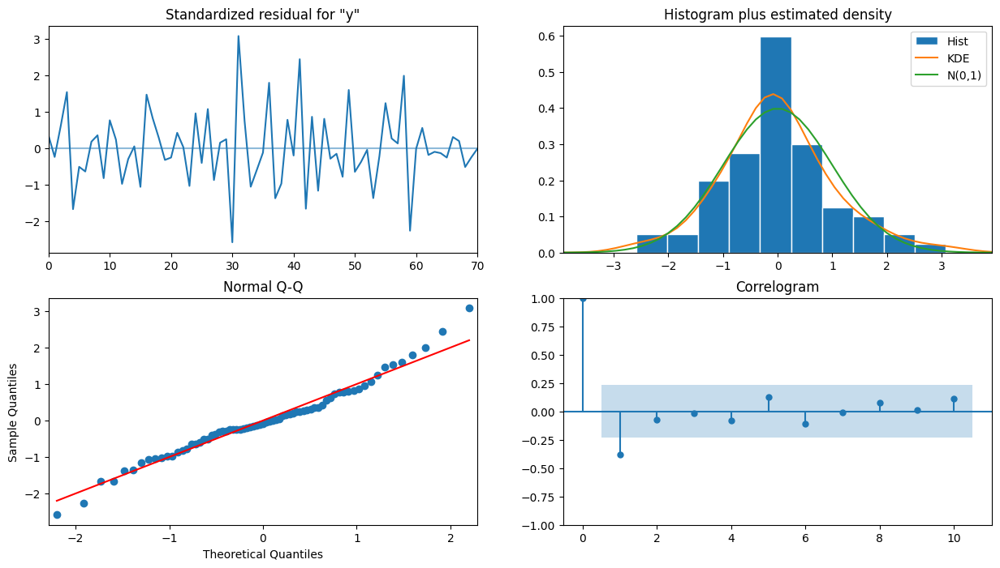

In [ ]:
results_manual_SARIMA_soft.plot_diagnostics();

In [ ]:
predicted_manual_SARIMA_soft = results_manual_SARIMA_soft.get_forecast(steps=len(stest))

In [ ]:
rmse = mean_squared_error(stest['SoftDrinkProduction'],predicted_manual_SARIMA_soft.predicted_mean,squared=False)
rmse

730.6980546443982

In [ ]:
SARIMA_stest=stest.copy()
SARIMA_stest['Sparkling_manual_forecasted'] = predicted_manual_SARIMA_soft.predicted_mean
SARIMA_stest.head()

,SoftDrinkProduction,Sparkling_manual_forecasted
TimeStamp,,
1991-01-31,2211,2370.538583
1991-02-28,3260,2606.847547
1991-03-31,2992,3134.517733
1991-04-30,2425,2852.527210
1991-05-31,2707,2998.890085


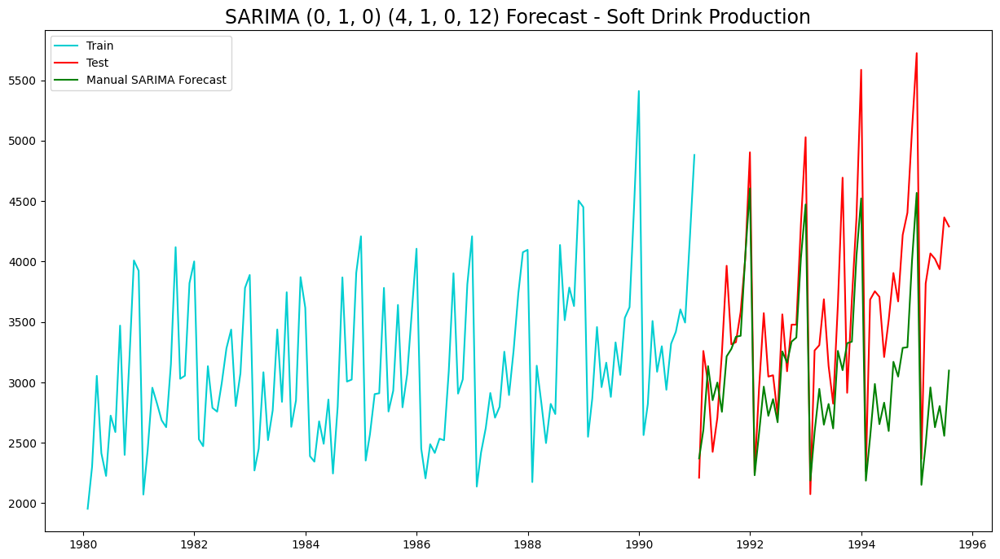

In [ ]:
plt.plot(strain['SoftDrinkProduction'], label='Train', color = 'darkturquoise')
plt.plot(stest['SoftDrinkProduction'], label='Test', color = 'red')

plt.plot(SARIMA_stest['Sparkling_manual_forecasted'], color='green', label='Manual SARIMA Forecast')
plt.title('SARIMA (0, 1, 0) (4, 1, 0, 12) Forecast - Soft Drink Production', fontsize=17)
plt.legend(loc='best')

In [ ]:
S_manual_SARIMA= pd.DataFrame({'Test RMSE Soft Drink Production': [mean_squared_error(stest.values,predicted_manual_SARIMA_soft.predicted_mean,squared=False)]},index=['SARIMA (0, 1, 0) (4, 1, 0, 12)'])
RMSE_SoftDrink = pd.concat([LRs, NMs, MAs, SAs, S_SES, S_DES, S_TES, S_M_TES, R_S_ARIMA, SM_ARIMA, A_SARIMA_soft, S_manual_SARIMA], axis=0)
RMSE_SoftDrink

,Test RMSE Soft Drink Production
Regression On Time,775.807810
Naive Model,1519.259233
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
9point Trailing MovingAverage,735.889827
Simple Average Model,934.353358
Simple Exponential Smoothing,809.488077
Double Exponential Smoothing,1074.329346
Exponential Smoothing (Additive Seasonality),459.796961
Exponential Smoothing (Multi Seasonality),447.622837


## Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

In [ ]:
RMSE_SoftDrink.sort_values(by=['Test RMSE Soft Drink Production'])

,Test RMSE Soft Drink Production
Exponential Smoothing (Multi Seasonality),447.622837
Exponential Smoothing (Additive Seasonality),459.796961
4point Trailing MovingAverage,687.181726
6point Trailing MovingAverage,710.513877
"SARIMA (0, 1, 0) (4, 1, 0, 12)",730.698055
9point Trailing MovingAverage,735.889827
Regression On Time,775.807810
"SARIMA (2, 1, 1) (0, 0, 3, 12)",777.441892
Simple Exponential Smoothing,809.488077
"ARIMA (3, 1, 2)",822.217264


### Best Model for SOFT DRINK with Least RMSE - Exponential Smoothing (Multi Seasonality) using damped trend

In [ ]:
ES_Multi_Soft = ExponentialSmoothing(df2, trend='additive',seasonal='multiplicative',initialization_method='estimated')
ES_Multi_Soft_fit = ES_Multi_Soft.fit(optimized=True)

print('')
print('Holt Winters model Exponential Smoothing Estimated Parameters')
print('')
print(ES_Multi_Soft_fit.params)


Holt Winters model Exponential Smoothing Estimated Parameters

{'smoothing_level': 0.11107151151589528, 'smoothing_trend': 0.0740476713431814, 'smoothing_seasonal': 0.26338627111730806, 'damping_trend': nan, 'initial_level': 2803.211094109776, 'initial_trend': 25.53764409329134, 'initial_seasons': array([0.77129178, 0.83660248, 1.01510773, 0.90500959, 0.91703062,
       0.95106201, 1.00506407, 1.22945797, 0.95512513, 1.03766877,
       1.29108834, 1.32864112]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency M will be used.
  self._init_dates(dates, freq)


In [ ]:
# Forecasting using this model for the duration of the test set
TES_predict_Spark =  ES_Multi_Soft_fit.forecast(steps=12)
TES_predict_Spark
prediction_1 = TES_predict_Spark
TES_predict_Spark.to_csv('soft_forecast_tes.csv')

In [ ]:
pred_1_df2 = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(ES_Multi_Soft_fit.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(ES_Multi_Soft_fit.resid,ddof=1)})
pred_1_df2.head()

,lower_CI,prediction,upper_ci
1995-08-31,3871.990121,4529.717442,5187.444763
1995-09-30,3691.375900,4349.103221,5006.830541
1995-10-31,4007.436559,4665.163880,5322.891200
1995-11-30,4881.747593,5539.474914,6197.202235
1995-12-31,5823.266777,6480.994098,7138.721419


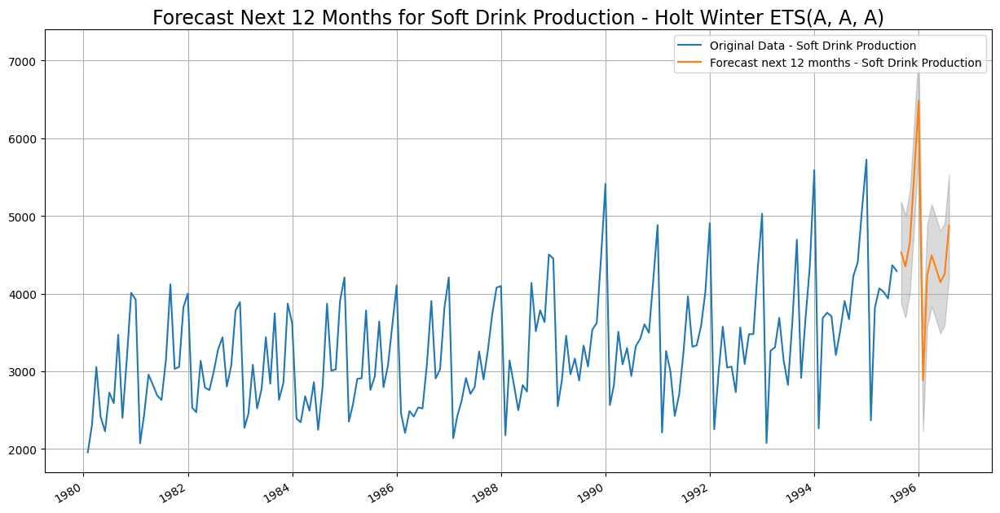

In [ ]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(df2['SoftDrinkProduction'], label='Original Data - Soft Drink Production')

ax =TES_predict_Spark.plot(label='Forecast next 12 months - Soft Drink Production')
ax.fill_between(pred_1_df2.index,pred_1_df2['lower_CI'], pred_1_df2['upper_ci'], color='k', alpha=.15)

plt.legend(loc='best')
plt.grid()
plt.title('Forecast Next 12 Months for Soft Drink Production - Holt Winter ETS(A, A, A)', fontsize=17);